In [1]:
import tensorflow as tf
tf.__version__
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 648403761961754885,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 2247245756997238465
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6920575392
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 12706091500435784464
 physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080 SUPER, pci bus id: 0000:01:00.0, compute capability: 7.5",
 name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 4071943680842630935
 physical_device_desc: "device: XLA_GPU device"]

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [3]:
tf.debugging.set_log_device_placement(True)

a = tf.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
b = tf.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
c = tf.matmul(a, b)
print(c)

Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
tf.Tensor(
[[22. 28.]
 [49. 64.]], shape=(2, 2), dtype=float32)


In [4]:
import keras
from keras.models import Sequential, Model
from keras import layers, applications, optimizers
from keras.layers import Conv2D, MaxPool2D, AveragePooling2D, Dropout, Flatten, Dense, Activation, GlobalAveragePooling2D, GlobalMaxPooling2D, Input, concatenate
from keras.preprocessing.image import ImageDataGenerator, load_img

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import random

In [5]:
epochs = 100
batch_size = 5
image_size = 224

In [6]:
#load train data(25000 imgs each)

filenames = os.listdir('./input/train/train')
data = []
categories = []

for filename in filenames:
    category = filename.split('.')[0]
    if category == 'dog':
        categories.append(1)
    else:
        categories.append(0)
    
    image = keras.preprocessing.image.load_img(os.path.join('./input/train/train', filename),
                                               color_mode='rgb',
                                               target_size= (image_size,image_size))
    image = np.array(image)
    data.append(image)

data = np.array(data)
categories = np.array(categories)

print(data)
print(categories)

[[[[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 203 119]
   [241 202 123]
   [239 200 121]]

  [[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 205 120]
   [242 203 124]
   [240 201 122]]

  [[203 164  87]
   [206 167  90]
   [209 170  93]
   ...
   [245 204 122]
   [243 204 125]
   [241 202 123]]

  ...

  [[154 123  56]
   [155 124  57]
   [156 125  58]
   ...
   [  3   3   1]
   [  3   3   1]
   [  3   3   1]]

  [[153 122  55]
   [153 122  55]
   [154 123  56]
   ...
   [  2   2   0]
   [  2   2   0]
   [  2   2   0]]

  [[151 120  53]
   [152 121  54]
   [153 122  55]
   ...
   [  1   1   0]
   [  1   1   0]
   [  1   1   0]]]


 [[[ 39  44  40]
   [ 40  44  43]
   [ 41  45  46]
   ...
   [210 209 181]
   [207 204 171]
   [201 199 161]]

  [[ 40  45  41]
   [ 40  44  43]
   [ 41  45  46]
   ...
   [207 203 176]
   [203 200 169]
   [197 195 157]]

  [[ 39  44  40]
   [ 38  42  41]
   [ 37  41  42]
   ...
   [195 191 166]
   [198 193 164]
   [205 200

In [7]:
# shuffle dataset

idx = np.random.permutation(len(data))
data, categories = data[idx], categories[idx]

In [8]:
# split train 6(15,000) / val 2(5,000) / test 2(5,000)

x_train = data[:15000]
y_train = categories[:15000]
x_temp, y_temp = data[-10000:], categories[-10000:]

from sklearn.model_selection import train_test_split

x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5)

In [9]:
print(x_train, y_train)

print(x_temp, y_temp)
print(x_temp.shape, y_temp.shape)

print(x_val, y_val)

print(x_test, y_test)
print(x_test.shape, y_test.shape)

[[[[ 86  86  62]
   [ 85  85  61]
   [ 82  84  62]
   ...
   [120 119  98]
   [121 120  99]
   [120 122 100]]

  [[ 85  85  61]
   [ 84  84  60]
   [ 81  83  61]
   ...
   [121 120  99]
   [122 121 100]
   [121 123 101]]

  [[ 93  93  69]
   [ 92  91  70]
   [ 89  91  70]
   ...
   [125 124 103]
   [126 125 104]
   [124 126 105]]

  ...

  [[155 145 143]
   [156 146 144]
   [154 144 143]
   ...
   [ 84  78  62]
   [ 83  77  61]
   [ 83  77  61]]

  [[154 145 140]
   [155 145 143]
   [154 144 142]
   ...
   [ 79  76  59]
   [ 77  74  57]
   [ 75  72  55]]

  [[151 144 138]
   [153 146 140]
   [152 145 139]
   ...
   [ 78  75  58]
   [ 76  73  56]
   [ 73  70  53]]]


 [[[  0   1   0]
   [  3   3   3]
   [  4   2   3]
   ...
   [ 67  35  22]
   [ 69  31  20]
   [ 66  40  23]]

  [[  1   1   1]
   [  4   4   4]
   [  7   5   6]
   ...
   [ 75  46  32]
   [ 81  45  33]
   [ 72  45  28]]

  [[  3   1   2]
   [  4   2   3]
   [  9   5   6]
   ...
   [ 73  45  31]
   [ 79  47  34]
   [ 69  41

In [10]:
def inception_module(x,
                     filters_1x1,
                     filters_3x3_reduce,
                     filters_3x3,
                     filters_5x5_reduce,
                     filters_5x5,
                     filters_pool_proj,
                     name=None):
    
    conv_1x1 = Conv2D(filters_1x1, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    
    conv_3x3 = Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_3x3 = Conv2D(filters_3x3, (3, 3), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_3x3)

    conv_5x5 = Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_5x5 = Conv2D(filters_5x5, (5, 5), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_5x5)

    pool_proj = MaxPool2D((3, 3), strides=(1, 1), padding='same')(x)
    pool_proj = Conv2D(filters_pool_proj, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(pool_proj)

    module = concatenate([conv_1x1, conv_3x3, conv_5x5, pool_proj], axis=3, name=name)
    
    return module

In [11]:
kernel_init = keras.initializers.glorot_uniform()
bias_init = keras.initializers.Constant(0.2)

In [12]:
input_layer = Input(shape=(image_size, image_size, 3))

x = Conv2D(64, (7, 7), padding='same', strides=(2, 2), activation='relu', name='conv_1_7x7/2', kernel_initializer=kernel_init, bias_initializer=bias_init)(input_layer)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_1_3x3/2')(x)
x = Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu', name='conv_2a_3x3/1')(x)
x = Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu', name='conv_2b_3x3/1')(x)
x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_2_3x3/2')(x)

x = inception_module(x,
                     filters_1x1=64,
                     filters_3x3_reduce=96,
                     filters_3x3=128,
                     filters_5x5_reduce=16,
                     filters_5x5=32,
                     filters_pool_proj=32,
                     name='inception_3a')

x = inception_module(x,
                     filters_1x1=128,
                     filters_3x3_reduce=128,
                     filters_3x3=192,
                     filters_5x5_reduce=32,
                     filters_5x5=96,
                     filters_pool_proj=64,
                     name='inception_3b')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_3_3x3/2')(x)

x = inception_module(x,
                     filters_1x1=192,
                     filters_3x3_reduce=96,
                     filters_3x3=208,
                     filters_5x5_reduce=16,
                     filters_5x5=48,
                     filters_pool_proj=64,
                     name='inception_4a')


x1 = AveragePooling2D((5, 5), strides=3)(x)
x1 = Conv2D(128, (1, 1), padding='same', activation='relu')(x1)
x1 = Flatten()(x1)
x1 = Dense(1024, activation='relu')(x1)
x1 = Dropout(0.7)(x1)
x1 = Dense(10, activation='softmax', name='auxilliary_output_1')(x1)

x = inception_module(x,
                     filters_1x1=160,
                     filters_3x3_reduce=112,
                     filters_3x3=224,
                     filters_5x5_reduce=24,
                     filters_5x5=64,
                     filters_pool_proj=64,
                     name='inception_4b')

x = inception_module(x,
                     filters_1x1=128,
                     filters_3x3_reduce=128,
                     filters_3x3=256,
                     filters_5x5_reduce=24,
                     filters_5x5=64,
                     filters_pool_proj=64,
                     name='inception_4c')

x = inception_module(x,
                     filters_1x1=112,
                     filters_3x3_reduce=144,
                     filters_3x3=288,
                     filters_5x5_reduce=32,
                     filters_5x5=64,
                     filters_pool_proj=64,
                     name='inception_4d')


x2 = AveragePooling2D((5, 5), strides=3)(x)
x2 = Conv2D(128, (1, 1), padding='same', activation='relu')(x2)
x2 = Flatten()(x2)
x2 = Dense(1024, activation='relu')(x2)
x2 = Dropout(0.7)(x2)
x2 = Dense(10, activation='softmax', name='auxilliary_output_2')(x2)

x = inception_module(x,
                     filters_1x1=256,
                     filters_3x3_reduce=160,
                     filters_3x3=320,
                     filters_5x5_reduce=32,
                     filters_5x5=128,
                     filters_pool_proj=128,
                     name='inception_4e')

x = MaxPool2D((3, 3), padding='same', strides=(2, 2), name='max_pool_4_3x3/2')(x)

x = inception_module(x,
                     filters_1x1=256,
                     filters_3x3_reduce=160,
                     filters_3x3=320,
                     filters_5x5_reduce=32,
                     filters_5x5=128,
                     filters_pool_proj=128,
                     name='inception_5a')

x = inception_module(x,
                     filters_1x1=384,
                     filters_3x3_reduce=192,
                     filters_3x3=384,
                     filters_5x5_reduce=48,
                     filters_5x5=128,
                     filters_pool_proj=128,
                     name='inception_5b')

x = GlobalAveragePooling2D(name='avg_pool_5_3x3/1')(x)

x = Dropout(0.4)(x)

x = Dense(10, activation='softmax', name='output')(x)


Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/repli

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/r

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task

In [13]:
%load_ext tensorboard

import datetime

In [14]:
model = Model(input_layer, [x, x1, x2], name='inception_v1')

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalN

In [15]:
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, clipnorm=1.),
    metrics=['accuracy']
)

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

In [16]:
model.summary()

Model: "inception_v1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv_1_7x7/2 (Conv2D)           (None, 112, 112, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
max_pool_1_3x3/2 (MaxPooling2D) (None, 56, 56, 64)   0           conv_1_7x7/2[0][0]               
__________________________________________________________________________________________________
conv_2a_3x3/1 (Conv2D)          (None, 56, 56, 64)   4160        max_pool_1_3x3/2[0][0]           
_______________________________________________________________________________________

In [17]:
log_dir = "logs/inception/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [18]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler

early_stopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

In [19]:
def scheduler(epoch, lr):
   if epoch < 10:
     return lr
   else:
     return lr * 0.04
    
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [20]:
# without early stopping

epochs = 50

history = model.fit(
    x_train, y_train,
    epochs=epochs,
    validation_data=(x_val, y_val),
    #validation_steps=2500//batch_size,
    #steps_per_epoch=22500//batch_size,
    verbose=1,
    callbacks=[tensorboard_callback, lr_scheduler]
)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op SummaryWriter 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:lo

Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device 

Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:loc

Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localho

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /j

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost

 27/469 [>.............................] - ETA: 28s - loss: 5.1240 - output_loss: 1.1408 - auxilliary_output_1_loss: 2.3671 - auxilliary_output_2_loss: 1.6161 - output_accuracy: 0.4803 - auxilliary_output_1_accuracy: 0.4421 - auxilliary_output_2_accuracy: 0.4711Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 49/469 [==>...........................] - ETA: 27s - loss: 3.8962 - output_loss: 0.9792 - auxilliary_output_1_loss: 1.6701 - auxilliary_output_2_loss: 1.2470 - output_accuracy: 0.4821 - auxilliary_output_1_accuracy: 0.4694 - auxilliary_output_2_accuracy: 0.4987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/469 [===>..........................] - ETA: 25s - loss: 3.4116 - output_loss: 0.9183 - auxilliary_output_1_loss: 1.3956 - auxilliary_output_2_loss: 1.0978 - output_accuracy: 0.4824 - auxilliary_output_1_accuracy: 0.4776 - auxilliary_output_2_accuracy: 0.5053Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/469 [====>.........................] - ETA: 24s - loss: 3.1384 - output_loss: 0.8740 - auxilliary_output_1_loss: 1.2428 - auxilliary_output_2_loss: 1.0216 - output_accuracy: 0.4889 - auxilliary_output_1_accuracy: 0.4889 - auxilliary_output_2_accuracy: 0.4987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 22s - loss: 2.9780 - output_loss: 0.8557 - auxilliary_output_1_loss: 1.1495 - auxilliary_output_2_loss: 0.9729 - output_accuracy: 0.4929 - auxilliary_output_1_accuracy: 0.4918 - auxilliary_output_2_accuracy: 0.4948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


137/469 [=======>......................] - ETA: 21s - loss: 2.8549 - output_loss: 0.8359 - auxilliary_output_1_loss: 1.0855 - auxilliary_output_2_loss: 0.9334 - output_accuracy: 0.4936 - auxilliary_output_1_accuracy: 0.4941 - auxilliary_output_2_accuracy: 0.4991Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 19s - loss: 2.7641 - output_loss: 0.8202 - auxilliary_output_1_loss: 1.0381 - auxilliary_output_2_loss: 0.9058 - output_accuracy: 0.4943 - auxilliary_output_1_accuracy: 0.4955 - auxilliary_output_2_accuracy: 0.5002Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


181/469 [==========>...................] - ETA: 18s - loss: 2.6945 - output_loss: 0.8097 - auxilliary_output_1_loss: 1.0007 - auxilliary_output_2_loss: 0.8842 - output_accuracy: 0.4950 - auxilliary_output_1_accuracy: 0.4967 - auxilliary_output_2_accuracy: 0.5031Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 2.6397 - output_loss: 0.7996 - auxilliary_output_1_loss: 0.9715 - auxilliary_output_2_loss: 0.8686 - output_accuracy: 0.4972 - auxilliary_output_1_accuracy: 0.4966 - auxilliary_output_2_accuracy: 0.5022Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


225/469 [=============>................] - ETA: 15s - loss: 2.5986 - output_loss: 0.7936 - auxilliary_output_1_loss: 0.9493 - auxilliary_output_2_loss: 0.8556 - output_accuracy: 0.4974 - auxilliary_output_1_accuracy: 0.4949 - auxilliary_output_2_accuracy: 0.5039Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 2.5619 - output_loss: 0.7885 - auxilliary_output_1_loss: 0.9295 - auxilliary_output_2_loss: 0.8439 - output_accuracy: 0.4982 - auxilliary_output_1_accuracy: 0.4977 - auxilliary_output_2_accuracy: 0.5032Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


269/469 [================>.............] - ETA: 12s - loss: 2.5290 - output_loss: 0.7821 - auxilliary_output_1_loss: 0.9136 - auxilliary_output_2_loss: 0.8333 - output_accuracy: 0.5014 - auxilliary_output_1_accuracy: 0.4995 - auxilliary_output_2_accuracy: 0.5062Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 2.5048 - output_loss: 0.7780 - auxilliary_output_1_loss: 0.9003 - auxilliary_output_2_loss: 0.8264 - output_accuracy: 0.5011 - auxilliary_output_1_accuracy: 0.4988 - auxilliary_output_2_accuracy: 0.5079Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


313/469 [===================>..........] - ETA: 10s - loss: 2.4852 - output_loss: 0.7758 - auxilliary_output_1_loss: 0.8883 - auxilliary_output_2_loss: 0.8211 - output_accuracy: 0.4994 - auxilliary_output_1_accuracy: 0.4998 - auxilliary_output_2_accuracy: 0.5057Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 2.4636 - output_loss: 0.7723 - auxilliary_output_1_loss: 0.8770 - auxilliary_output_2_loss: 0.8144 - output_accuracy: 0.4987 - auxilliary_output_1_accuracy: 0.5005 - auxilliary_output_2_accuracy: 0.5054Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


357/469 [=====================>........] - ETA: 7s - loss: 2.4439 - output_loss: 0.7683 - auxilliary_output_1_loss: 0.8671 - auxilliary_output_2_loss: 0.8084 - output_accuracy: 0.4985 - auxilliary_output_1_accuracy: 0.5032 - auxilliary_output_2_accuracy: 0.5053Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 2.4284 - output_loss: 0.7652 - auxilliary_output_1_loss: 0.8593 - auxilliary_output_2_loss: 0.8038 - output_accuracy: 0.4974 - auxilliary_output_1_accuracy: 0.5030 - auxilliary_output_2_accuracy: 0.5033Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


401/469 [========================>.....] - ETA: 4s - loss: 2.4136 - output_loss: 0.7637 - auxilliary_output_1_loss: 0.8510 - auxilliary_output_2_loss: 0.7988 - output_accuracy: 0.4956 - auxilliary_output_1_accuracy: 0.5041 - auxilliary_output_2_accuracy: 0.5026Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 2s - loss: 2.3995 - output_loss: 0.7613 - auxilliary_output_1_loss: 0.8434 - auxilliary_output_2_loss: 0.7948 - output_accuracy: 0.4955 - auxilliary_output_1_accuracy: 0.5057 - auxilliary_output_2_accuracy: 0.5022Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


445/469 [===========================>..] - ETA: 1s - loss: 2.3882 - output_loss: 0.7594 - auxilliary_output_1_loss: 0.8378 - auxilliary_output_2_loss: 0.7910 - output_accuracy: 0.4954 - auxilliary_output_1_accuracy: 0.5051 - auxilliary_output_2_accuracy: 0.5020Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 2.3758 - output_loss: 0.7569 - auxilliary_output_1_loss: 0.8312 - auxilliary_output_2_loss: 0.7877 - output_accuracy: 0.4971 - auxilliary_output_1_accuracy: 0.5072 - auxilliary_output_2_accuracy: 0.5019Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.3751 - output_loss: 0.7568 - auxilliary_output_1_loss: 0.8308 - auxilliary_output_2_loss: 0.7874 - output_accuracy: 0.4968 - auxilliary_output_1_accuracy: 0.5073 - auxilliary_output_2_accuracy: 0.5018Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Execut

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 40/469 [=>............................] - ETA: 26s - loss: 2.1643 - output_loss: 0.7079 - auxilliary_output_1_loss: 0.7309 - auxilliary_output_2_loss: 0.7255 - output_accuracy: 0.5211 - auxilliary_output_1_accuracy: 0.5039 - auxilliary_output_2_accuracy: 0.5133Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 62/469 [==>...........................] - ETA: 26s - loss: 2.1565 - output_loss: 0.7073 - auxilliary_output_1_loss: 0.7253 - auxilliary_output_2_loss: 0.7239 - output_accuracy: 0.5318 - auxilliary_output_1_accuracy: 0.5076 - auxilliary_output_2_accuracy: 0.5081Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/469 [====>.........................] - ETA: 24s - loss: 2.1569 - output_loss: 0.7090 - auxilliary_output_1_loss: 0.7256 - auxilliary_output_2_loss: 0.7223 - output_accuracy: 0.5242 - auxilliary_output_1_accuracy: 0.5067 - auxilliary_output_2_accuracy: 0.5100Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


106/469 [=====>........................] - ETA: 23s - loss: 2.1480 - output_loss: 0.7068 - auxilliary_output_1_loss: 0.7195 - auxilliary_output_2_loss: 0.7217 - output_accuracy: 0.5259 - auxilliary_output_1_accuracy: 0.5153 - auxilliary_output_2_accuracy: 0.5071Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


128/469 [=======>......................] - ETA: 22s - loss: 2.1501 - output_loss: 0.7086 - auxilliary_output_1_loss: 0.7212 - auxilliary_output_2_loss: 0.7203 - output_accuracy: 0.5227 - auxilliary_output_1_accuracy: 0.5127 - auxilliary_output_2_accuracy: 0.5068Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


150/469 [========>.....................] - ETA: 20s - loss: 2.1481 - output_loss: 0.7070 - auxilliary_output_1_loss: 0.7212 - auxilliary_output_2_loss: 0.7199 - output_accuracy: 0.5208 - auxilliary_output_1_accuracy: 0.5065 - auxilliary_output_2_accuracy: 0.5054Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


172/469 [==========>...................] - ETA: 19s - loss: 2.1481 - output_loss: 0.7074 - auxilliary_output_1_loss: 0.7207 - auxilliary_output_2_loss: 0.7200 - output_accuracy: 0.5207 - auxilliary_output_1_accuracy: 0.5042 - auxilliary_output_2_accuracy: 0.5024Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


194/469 [===========>..................] - ETA: 17s - loss: 2.1495 - output_loss: 0.7090 - auxilliary_output_1_loss: 0.7208 - auxilliary_output_2_loss: 0.7197 - output_accuracy: 0.5184 - auxilliary_output_1_accuracy: 0.5045 - auxilliary_output_2_accuracy: 0.5056Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


216/469 [============>.................] - ETA: 16s - loss: 2.1510 - output_loss: 0.7094 - auxilliary_output_1_loss: 0.7213 - auxilliary_output_2_loss: 0.7203 - output_accuracy: 0.5181 - auxilliary_output_1_accuracy: 0.5036 - auxilliary_output_2_accuracy: 0.5068Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


238/469 [==============>...............] - ETA: 14s - loss: 2.1508 - output_loss: 0.7102 - auxilliary_output_1_loss: 0.7209 - auxilliary_output_2_loss: 0.7197 - output_accuracy: 0.5163 - auxilliary_output_1_accuracy: 0.5083 - auxilliary_output_2_accuracy: 0.5077Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


260/469 [===============>..............] - ETA: 13s - loss: 2.1535 - output_loss: 0.7123 - auxilliary_output_1_loss: 0.7213 - auxilliary_output_2_loss: 0.7199 - output_accuracy: 0.5154 - auxilliary_output_1_accuracy: 0.5069 - auxilliary_output_2_accuracy: 0.5056Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


282/469 [=================>............] - ETA: 12s - loss: 2.1548 - output_loss: 0.7133 - auxilliary_output_1_loss: 0.7207 - auxilliary_output_2_loss: 0.7208 - output_accuracy: 0.5134 - auxilliary_output_1_accuracy: 0.5065 - auxilliary_output_2_accuracy: 0.5037Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


304/469 [==================>...........] - ETA: 10s - loss: 2.1531 - output_loss: 0.7125 - auxilliary_output_1_loss: 0.7205 - auxilliary_output_2_loss: 0.7201 - output_accuracy: 0.5134 - auxilliary_output_1_accuracy: 0.5062 - auxilliary_output_2_accuracy: 0.5037Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


326/469 [===================>..........] - ETA: 9s - loss: 2.1525 - output_loss: 0.7119 - auxilliary_output_1_loss: 0.7208 - auxilliary_output_2_loss: 0.7197 - output_accuracy: 0.5131 - auxilliary_output_1_accuracy: 0.5041 - auxilliary_output_2_accuracy: 0.5031Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


348/469 [=====================>........] - ETA: 7s - loss: 2.1519 - output_loss: 0.7123 - auxilliary_output_1_loss: 0.7205 - auxilliary_output_2_loss: 0.7191 - output_accuracy: 0.5121 - auxilliary_output_1_accuracy: 0.5026 - auxilliary_output_2_accuracy: 0.5046Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


370/469 [======================>.......] - ETA: 6s - loss: 2.1519 - output_loss: 0.7126 - auxilliary_output_1_loss: 0.7205 - auxilliary_output_2_loss: 0.7188 - output_accuracy: 0.5110 - auxilliary_output_1_accuracy: 0.5010 - auxilliary_output_2_accuracy: 0.5041Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


392/469 [========================>.....] - ETA: 4s - loss: 2.1516 - output_loss: 0.7125 - auxilliary_output_1_loss: 0.7203 - auxilliary_output_2_loss: 0.7188 - output_accuracy: 0.5101 - auxilliary_output_1_accuracy: 0.4990 - auxilliary_output_2_accuracy: 0.5033Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


414/469 [=========================>....] - ETA: 3s - loss: 2.1498 - output_loss: 0.7121 - auxilliary_output_1_loss: 0.7196 - auxilliary_output_2_loss: 0.7181 - output_accuracy: 0.5100 - auxilliary_output_1_accuracy: 0.4995 - auxilliary_output_2_accuracy: 0.5045Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


436/469 [==========================>...] - ETA: 2s - loss: 2.1491 - output_loss: 0.7121 - auxilliary_output_1_loss: 0.7195 - auxilliary_output_2_loss: 0.7175 - output_accuracy: 0.5087 - auxilliary_output_1_accuracy: 0.4976 - auxilliary_output_2_accuracy: 0.5051Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


458/469 [============================>.] - ETA: 0s - loss: 2.1490 - output_loss: 0.7123 - auxilliary_output_1_loss: 0.7192 - auxilliary_output_2_loss: 0.7175 - output_accuracy: 0.5077 - auxilliary_output_1_accuracy: 0.4960 - auxilliary_output_2_accuracy: 0.5040Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.1482 - output_loss: 0.7120 - auxilliary_output_1_loss: 0.7191 - auxilliary_output_2_loss: 0.7171 - output_accuracy: 0.5075 - auxilliary_output_1_accuracy: 0.4955 - auxilliary_output_2_accuracy: 0.5045Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wri

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 35/469 [=>............................] - ETA: 27s - loss: 2.1325 - output_loss: 0.7041 - auxilliary_output_1_loss: 0.7137 - auxilliary_output_2_loss: 0.7147 - output_accuracy: 0.5232 - auxilliary_output_1_accuracy: 0.4884 - auxilliary_output_2_accuracy: 0.4866Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/469 [==>...........................] - ETA: 25s - loss: 2.1263 - output_loss: 0.7013 - auxilliary_output_1_loss: 0.7127 - auxilliary_output_2_loss: 0.7123 - output_accuracy: 0.5164 - auxilliary_output_1_accuracy: 0.5027 - auxilliary_output_2_accuracy: 0.4956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 79/469 [====>.........................] - ETA: 24s - loss: 2.1206 - output_loss: 0.7012 - auxilliary_output_1_loss: 0.7101 - auxilliary_output_2_loss: 0.7093 - output_accuracy: 0.5134 - auxilliary_output_1_accuracy: 0.5079 - auxilliary_output_2_accuracy: 0.5024Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


101/469 [=====>........................] - ETA: 23s - loss: 2.1226 - output_loss: 0.7032 - auxilliary_output_1_loss: 0.7100 - auxilliary_output_2_loss: 0.7095 - output_accuracy: 0.5111 - auxilliary_output_1_accuracy: 0.5040 - auxilliary_output_2_accuracy: 0.5031Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 21s - loss: 2.1242 - output_loss: 0.7027 - auxilliary_output_1_loss: 0.7101 - auxilliary_output_2_loss: 0.7114 - output_accuracy: 0.5097 - auxilliary_output_1_accuracy: 0.5015 - auxilliary_output_2_accuracy: 0.4962Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


145/469 [========>.....................] - ETA: 20s - loss: 2.1243 - output_loss: 0.7020 - auxilliary_output_1_loss: 0.7105 - auxilliary_output_2_loss: 0.7119 - output_accuracy: 0.5162 - auxilliary_output_1_accuracy: 0.4983 - auxilliary_output_2_accuracy: 0.4935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 2.1229 - output_loss: 0.7031 - auxilliary_output_1_loss: 0.7096 - auxilliary_output_2_loss: 0.7102 - output_accuracy: 0.5129 - auxilliary_output_1_accuracy: 0.4994 - auxilliary_output_2_accuracy: 0.4987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


189/469 [===========>..................] - ETA: 17s - loss: 2.1224 - output_loss: 0.7030 - auxilliary_output_1_loss: 0.7097 - auxilliary_output_2_loss: 0.7097 - output_accuracy: 0.5112 - auxilliary_output_1_accuracy: 0.4993 - auxilliary_output_2_accuracy: 0.4998Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 2.1234 - output_loss: 0.7039 - auxilliary_output_1_loss: 0.7097 - auxilliary_output_2_loss: 0.7099 - output_accuracy: 0.5113 - auxilliary_output_1_accuracy: 0.4996 - auxilliary_output_2_accuracy: 0.5018Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


233/469 [=============>................] - ETA: 15s - loss: 2.1236 - output_loss: 0.7035 - auxilliary_output_1_loss: 0.7100 - auxilliary_output_2_loss: 0.7101 - output_accuracy: 0.5127 - auxilliary_output_1_accuracy: 0.4988 - auxilliary_output_2_accuracy: 0.5017Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 13s - loss: 2.1254 - output_loss: 0.7042 - auxilliary_output_1_loss: 0.7106 - auxilliary_output_2_loss: 0.7106 - output_accuracy: 0.5114 - auxilliary_output_1_accuracy: 0.4980 - auxilliary_output_2_accuracy: 0.4994Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


277/469 [================>.............] - ETA: 12s - loss: 2.1259 - output_loss: 0.7045 - auxilliary_output_1_loss: 0.7106 - auxilliary_output_2_loss: 0.7108 - output_accuracy: 0.5102 - auxilliary_output_1_accuracy: 0.4993 - auxilliary_output_2_accuracy: 0.4983Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 10s - loss: 2.1265 - output_loss: 0.7050 - auxilliary_output_1_loss: 0.7109 - auxilliary_output_2_loss: 0.7106 - output_accuracy: 0.5095 - auxilliary_output_1_accuracy: 0.5014 - auxilliary_output_2_accuracy: 0.4992Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


321/469 [===================>..........] - ETA: 9s - loss: 2.1257 - output_loss: 0.7048 - auxilliary_output_1_loss: 0.7111 - auxilliary_output_2_loss: 0.7098 - output_accuracy: 0.5096 - auxilliary_output_1_accuracy: 0.5035 - auxilliary_output_2_accuracy: 0.4994Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 2.1239 - output_loss: 0.7042 - auxilliary_output_1_loss: 0.7104 - auxilliary_output_2_loss: 0.7093 - output_accuracy: 0.5113 - auxilliary_output_1_accuracy: 0.5060 - auxilliary_output_2_accuracy: 0.4998Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


365/469 [======================>.......] - ETA: 6s - loss: 2.1211 - output_loss: 0.7032 - auxilliary_output_1_loss: 0.7094 - auxilliary_output_2_loss: 0.7085 - output_accuracy: 0.5142 - auxilliary_output_1_accuracy: 0.5080 - auxilliary_output_2_accuracy: 0.5016Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 2.1201 - output_loss: 0.7031 - auxilliary_output_1_loss: 0.7086 - auxilliary_output_2_loss: 0.7083 - output_accuracy: 0.5153 - auxilliary_output_1_accuracy: 0.5103 - auxilliary_output_2_accuracy: 0.5046Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


409/469 [=========================>....] - ETA: 3s - loss: 2.1186 - output_loss: 0.7027 - auxilliary_output_1_loss: 0.7082 - auxilliary_output_2_loss: 0.7077 - output_accuracy: 0.5157 - auxilliary_output_1_accuracy: 0.5122 - auxilliary_output_2_accuracy: 0.5067Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 2.1169 - output_loss: 0.7025 - auxilliary_output_1_loss: 0.7073 - auxilliary_output_2_loss: 0.7071 - output_accuracy: 0.5170 - auxilliary_output_1_accuracy: 0.5146 - auxilliary_output_2_accuracy: 0.5096Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


453/469 [===========================>..] - ETA: 1s - loss: 2.1127 - output_loss: 0.7022 - auxilliary_output_1_loss: 0.7049 - auxilliary_output_2_loss: 0.7056 - output_accuracy: 0.5190 - auxilliary_output_1_accuracy: 0.5199 - auxilliary_output_2_accuracy: 0.5135Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.1080 - output_loss: 0.7014 - auxilliary_output_1_loss: 0.7032 - auxilliary_output_2_loss: 0.7034 - output_accuracy: 0.5208 - auxilliary_output_1_accuracy: 0.5231 - auxilliary_output_2_accuracy: 0.5179Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 30/469 [>.............................] - ETA: 27s - loss: 2.0376 - output_loss: 0.6904 - auxilliary_output_1_loss: 0.6639 - auxilliary_output_2_loss: 0.6834 - output_accuracy: 0.5896 - auxilliary_output_1_accuracy: 0.6104 - auxilliary_output_2_accuracy: 0.6104Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/469 [==>...........................] - ETA: 26s - loss: 2.0322 - output_loss: 0.6894 - auxilliary_output_1_loss: 0.6650 - auxilliary_output_2_loss: 0.6778 - output_accuracy: 0.5721 - auxilliary_output_1_accuracy: 0.6214 - auxilliary_output_2_accuracy: 0.6172Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 74/469 [===>..........................] - ETA: 25s - loss: 2.0440 - output_loss: 0.6928 - auxilliary_output_1_loss: 0.6710 - auxilliary_output_2_loss: 0.6802 - output_accuracy: 0.5676 - auxilliary_output_1_accuracy: 0.6136 - auxilliary_output_2_accuracy: 0.6094Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/469 [=====>........................] - ETA: 23s - loss: 2.0476 - output_loss: 0.6918 - auxilliary_output_1_loss: 0.6755 - auxilliary_output_2_loss: 0.6803 - output_accuracy: 0.5609 - auxilliary_output_1_accuracy: 0.6016 - auxilliary_output_2_accuracy: 0.5990Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 22s - loss: 2.0553 - output_loss: 0.6910 - auxilliary_output_1_loss: 0.6790 - auxilliary_output_2_loss: 0.6853 - output_accuracy: 0.5588 - auxilliary_output_1_accuracy: 0.5961 - auxilliary_output_2_accuracy: 0.5906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


140/469 [=======>......................] - ETA: 21s - loss: 2.0522 - output_loss: 0.6916 - auxilliary_output_1_loss: 0.6774 - auxilliary_output_2_loss: 0.6833 - output_accuracy: 0.5600 - auxilliary_output_1_accuracy: 0.5971 - auxilliary_output_2_accuracy: 0.5886Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 19s - loss: 2.0527 - output_loss: 0.6921 - auxilliary_output_1_loss: 0.6770 - auxilliary_output_2_loss: 0.6836 - output_accuracy: 0.5600 - auxilliary_output_1_accuracy: 0.6005 - auxilliary_output_2_accuracy: 0.5926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


184/469 [==========>...................] - ETA: 18s - loss: 2.0534 - output_loss: 0.6929 - auxilliary_output_1_loss: 0.6774 - auxilliary_output_2_loss: 0.6832 - output_accuracy: 0.5574 - auxilliary_output_1_accuracy: 0.6002 - auxilliary_output_2_accuracy: 0.5919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 16s - loss: 2.0537 - output_loss: 0.6928 - auxilliary_output_1_loss: 0.6782 - auxilliary_output_2_loss: 0.6828 - output_accuracy: 0.5625 - auxilliary_output_1_accuracy: 0.6018 - auxilliary_output_2_accuracy: 0.5939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


228/469 [=============>................] - ETA: 15s - loss: 2.0502 - output_loss: 0.6924 - auxilliary_output_1_loss: 0.6765 - auxilliary_output_2_loss: 0.6814 - output_accuracy: 0.5610 - auxilliary_output_1_accuracy: 0.6022 - auxilliary_output_2_accuracy: 0.5953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 2.0440 - output_loss: 0.6909 - auxilliary_output_1_loss: 0.6746 - auxilliary_output_2_loss: 0.6785 - output_accuracy: 0.5629 - auxilliary_output_1_accuracy: 0.6021 - auxilliary_output_2_accuracy: 0.5985Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


272/469 [================>.............] - ETA: 12s - loss: 2.0498 - output_loss: 0.6926 - auxilliary_output_1_loss: 0.6770 - auxilliary_output_2_loss: 0.6802 - output_accuracy: 0.5619 - auxilliary_output_1_accuracy: 0.6003 - auxilliary_output_2_accuracy: 0.5969Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 2.0480 - output_loss: 0.6918 - auxilliary_output_1_loss: 0.6761 - auxilliary_output_2_loss: 0.6800 - output_accuracy: 0.5638 - auxilliary_output_1_accuracy: 0.5998 - auxilliary_output_2_accuracy: 0.5963Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


316/469 [===================>..........] - ETA: 9s - loss: 2.0437 - output_loss: 0.6910 - auxilliary_output_1_loss: 0.6740 - auxilliary_output_2_loss: 0.6786 - output_accuracy: 0.5656 - auxilliary_output_1_accuracy: 0.6017 - auxilliary_output_2_accuracy: 0.5992Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 2.0376 - output_loss: 0.6889 - auxilliary_output_1_loss: 0.6726 - auxilliary_output_2_loss: 0.6760 - output_accuracy: 0.5682 - auxilliary_output_1_accuracy: 0.6026 - auxilliary_output_2_accuracy: 0.6017Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


360/469 [======================>.......] - ETA: 7s - loss: 2.0330 - output_loss: 0.6882 - auxilliary_output_1_loss: 0.6709 - auxilliary_output_2_loss: 0.6739 - output_accuracy: 0.5704 - auxilliary_output_1_accuracy: 0.6047 - auxilliary_output_2_accuracy: 0.6046Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 2.0293 - output_loss: 0.6867 - auxilliary_output_1_loss: 0.6701 - auxilliary_output_2_loss: 0.6724 - output_accuracy: 0.5737 - auxilliary_output_1_accuracy: 0.6067 - auxilliary_output_2_accuracy: 0.6060Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


404/469 [========================>.....] - ETA: 4s - loss: 2.0250 - output_loss: 0.6855 - auxilliary_output_1_loss: 0.6682 - auxilliary_output_2_loss: 0.6713 - output_accuracy: 0.5751 - auxilliary_output_1_accuracy: 0.6093 - auxilliary_output_2_accuracy: 0.6071Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 2.0217 - output_loss: 0.6852 - auxilliary_output_1_loss: 0.6664 - auxilliary_output_2_loss: 0.6700 - output_accuracy: 0.5762 - auxilliary_output_1_accuracy: 0.6111 - auxilliary_output_2_accuracy: 0.6091Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


448/469 [===========================>..] - ETA: 1s - loss: 2.0189 - output_loss: 0.6843 - auxilliary_output_1_loss: 0.6659 - auxilliary_output_2_loss: 0.6686 - output_accuracy: 0.5777 - auxilliary_output_1_accuracy: 0.6122 - auxilliary_output_2_accuracy: 0.6102Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 2.0151 - output_loss: 0.6830 - auxilliary_output_1_loss: 0.6649 - auxilliary_output_2_loss: 0.6673 - output_accuracy: 0.5795 - auxilliary_output_1_accuracy: 0.6141 - auxilliary_output_2_accuracy: 0.6115Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 25/469 [>.............................] - ETA: 27s - loss: 2.0698 - output_loss: 0.7095 - auxilliary_output_1_loss: 0.6835 - auxilliary_output_2_loss: 0.6768 - output_accuracy: 0.5587 - auxilliary_output_1_accuracy: 0.5888 - auxilliary_output_2_accuracy: 0.6275Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/469 [==>...........................] - ETA: 26s - loss: 2.0297 - output_loss: 0.6979 - auxilliary_output_1_loss: 0.6640 - auxilliary_output_2_loss: 0.6678 - output_accuracy: 0.5632 - auxilliary_output_1_accuracy: 0.6097 - auxilliary_output_2_accuracy: 0.6237Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/469 [===>..........................] - ETA: 25s - loss: 2.0057 - output_loss: 0.6869 - auxilliary_output_1_loss: 0.6595 - auxilliary_output_2_loss: 0.6592 - output_accuracy: 0.5734 - auxilliary_output_1_accuracy: 0.6119 - auxilliary_output_2_accuracy: 0.6282Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/469 [====>.........................] - ETA: 24s - loss: 1.9866 - output_loss: 0.6794 - auxilliary_output_1_loss: 0.6521 - auxilliary_output_2_loss: 0.6551 - output_accuracy: 0.5845 - auxilliary_output_1_accuracy: 0.6271 - auxilliary_output_2_accuracy: 0.6312Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 22s - loss: 1.9908 - output_loss: 0.6830 - auxilliary_output_1_loss: 0.6528 - auxilliary_output_2_loss: 0.6551 - output_accuracy: 0.5821 - auxilliary_output_1_accuracy: 0.6267 - auxilliary_output_2_accuracy: 0.6319Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


135/469 [=======>......................] - ETA: 21s - loss: 1.9953 - output_loss: 0.6822 - auxilliary_output_1_loss: 0.6555 - auxilliary_output_2_loss: 0.6575 - output_accuracy: 0.5833 - auxilliary_output_1_accuracy: 0.6236 - auxilliary_output_2_accuracy: 0.6280Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 19s - loss: 1.9897 - output_loss: 0.6790 - auxilliary_output_1_loss: 0.6542 - auxilliary_output_2_loss: 0.6565 - output_accuracy: 0.5896 - auxilliary_output_1_accuracy: 0.6246 - auxilliary_output_2_accuracy: 0.6286Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


179/469 [==========>...................] - ETA: 18s - loss: 1.9808 - output_loss: 0.6765 - auxilliary_output_1_loss: 0.6527 - auxilliary_output_2_loss: 0.6515 - output_accuracy: 0.5924 - auxilliary_output_1_accuracy: 0.6278 - auxilliary_output_2_accuracy: 0.6311Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.9749 - output_loss: 0.6766 - auxilliary_output_1_loss: 0.6512 - auxilliary_output_2_loss: 0.6471 - output_accuracy: 0.5956 - auxilliary_output_1_accuracy: 0.6312 - auxilliary_output_2_accuracy: 0.6314Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


223/469 [=============>................] - ETA: 15s - loss: 1.9644 - output_loss: 0.6759 - auxilliary_output_1_loss: 0.6457 - auxilliary_output_2_loss: 0.6427 - output_accuracy: 0.5964 - auxilliary_output_1_accuracy: 0.6369 - auxilliary_output_2_accuracy: 0.6361Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.9580 - output_loss: 0.6740 - auxilliary_output_1_loss: 0.6430 - auxilliary_output_2_loss: 0.6411 - output_accuracy: 0.5982 - auxilliary_output_1_accuracy: 0.6403 - auxilliary_output_2_accuracy: 0.6389Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


267/469 [================>.............] - ETA: 12s - loss: 1.9625 - output_loss: 0.6752 - auxilliary_output_1_loss: 0.6452 - auxilliary_output_2_loss: 0.6421 - output_accuracy: 0.5974 - auxilliary_output_1_accuracy: 0.6382 - auxilliary_output_2_accuracy: 0.6382Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.9507 - output_loss: 0.6714 - auxilliary_output_1_loss: 0.6410 - auxilliary_output_2_loss: 0.6383 - output_accuracy: 0.6021 - auxilliary_output_1_accuracy: 0.6422 - auxilliary_output_2_accuracy: 0.6419Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


311/469 [==================>...........] - ETA: 10s - loss: 1.9533 - output_loss: 0.6710 - auxilliary_output_1_loss: 0.6424 - auxilliary_output_2_loss: 0.6399 - output_accuracy: 0.6029 - auxilliary_output_1_accuracy: 0.6394 - auxilliary_output_2_accuracy: 0.6384Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.9638 - output_loss: 0.6725 - auxilliary_output_1_loss: 0.6471 - auxilliary_output_2_loss: 0.6442 - output_accuracy: 0.5994 - auxilliary_output_1_accuracy: 0.6323 - auxilliary_output_2_accuracy: 0.6330Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


355/469 [=====================>........] - ETA: 7s - loss: 1.9643 - output_loss: 0.6723 - auxilliary_output_1_loss: 0.6466 - auxilliary_output_2_loss: 0.6454 - output_accuracy: 0.6002 - auxilliary_output_1_accuracy: 0.6327 - auxilliary_output_2_accuracy: 0.6321Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 5s - loss: 1.9632 - output_loss: 0.6715 - auxilliary_output_1_loss: 0.6467 - auxilliary_output_2_loss: 0.6450 - output_accuracy: 0.6010 - auxilliary_output_1_accuracy: 0.6327 - auxilliary_output_2_accuracy: 0.6335Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


399/469 [========================>.....] - ETA: 4s - loss: 1.9643 - output_loss: 0.6719 - auxilliary_output_1_loss: 0.6471 - auxilliary_output_2_loss: 0.6453 - output_accuracy: 0.6013 - auxilliary_output_1_accuracy: 0.6340 - auxilliary_output_2_accuracy: 0.6345Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.9616 - output_loss: 0.6705 - auxilliary_output_1_loss: 0.6464 - auxilliary_output_2_loss: 0.6446 - output_accuracy: 0.6027 - auxilliary_output_1_accuracy: 0.6334 - auxilliary_output_2_accuracy: 0.6349Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


443/469 [===========================>..] - ETA: 1s - loss: 1.9566 - output_loss: 0.6682 - auxilliary_output_1_loss: 0.6451 - auxilliary_output_2_loss: 0.6433 - output_accuracy: 0.6051 - auxilliary_output_1_accuracy: 0.6351 - auxilliary_output_2_accuracy: 0.6370Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.9528 - output_loss: 0.6663 - auxilliary_output_1_loss: 0.6443 - auxilliary_output_2_loss: 0.6423 - output_accuracy: 0.6066 - auxilliary_output_1_accuracy: 0.6364 - auxilliary_output_2_accuracy: 0.6371Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.9516 - output_loss: 0.6656 - auxilliary_output_1_loss: 0.6442 - auxilliary_output_2_loss: 0.6418 - output_accuracy: 0.6073 - auxilliary_output_1_accuracy: 0.6363 - auxilliary_output_2_accuracy: 0.6378Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 6/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/469 [>.............................] - ETA: 27s - loss: 1.8536 - output_loss: 0.6248 - auxilliary_output_1_loss: 0.6240 - auxilli

 42/469 [=>............................] - ETA: 26s - loss: 1.8469 - output_loss: 0.6192 - auxilliary_output_1_loss: 0.6262 - auxilliary_output_2_loss: 0.6015 - output_accuracy: 0.6607 - auxilliary_output_1_accuracy: 0.6667 - auxilliary_output_2_accuracy: 0.6734Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/469 [===>..........................] - ETA: 25s - loss: 1.8365 - output_loss: 0.6184 - auxilliary_output_1_loss: 0.6166 - auxilliary_output_2_loss: 0.6016 - output_accuracy: 0.6621 - auxilliary_output_1_accuracy: 0.6792 - auxilliary_output_2_accuracy: 0.6772Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/469 [====>.........................] - ETA: 24s - loss: 1.8657 - output_loss: 0.6303 - auxilliary_output_1_loss: 0.6219 - auxilliary_output_2_loss: 0.6135 - output_accuracy: 0.6453 - auxilliary_output_1_accuracy: 0.6682 - auxilliary_output_2_accuracy: 0.6639Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


108/469 [=====>........................] - ETA: 23s - loss: 1.8966 - output_loss: 0.6405 - auxilliary_output_1_loss: 0.6318 - auxilliary_output_2_loss: 0.6243 - output_accuracy: 0.6348 - auxilliary_output_1_accuracy: 0.6528 - auxilliary_output_2_accuracy: 0.6522Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


130/469 [=======>......................] - ETA: 21s - loss: 1.9016 - output_loss: 0.6463 - auxilliary_output_1_loss: 0.6316 - auxilliary_output_2_loss: 0.6237 - output_accuracy: 0.6276 - auxilliary_output_1_accuracy: 0.6526 - auxilliary_output_2_accuracy: 0.6553Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


152/469 [========>.....................] - ETA: 20s - loss: 1.8916 - output_loss: 0.6423 - auxilliary_output_1_loss: 0.6253 - auxilliary_output_2_loss: 0.6241 - output_accuracy: 0.6343 - auxilliary_output_1_accuracy: 0.6587 - auxilliary_output_2_accuracy: 0.6575Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


174/469 [==========>...................] - ETA: 18s - loss: 1.8835 - output_loss: 0.6382 - auxilliary_output_1_loss: 0.6244 - auxilliary_output_2_loss: 0.6208 - output_accuracy: 0.6390 - auxilliary_output_1_accuracy: 0.6618 - auxilliary_output_2_accuracy: 0.6607Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


196/469 [===========>..................] - ETA: 17s - loss: 1.8880 - output_loss: 0.6394 - auxilliary_output_1_loss: 0.6263 - auxilliary_output_2_loss: 0.6222 - output_accuracy: 0.6382 - auxilliary_output_1_accuracy: 0.6618 - auxilliary_output_2_accuracy: 0.6596Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


218/469 [============>.................] - ETA: 16s - loss: 1.8977 - output_loss: 0.6408 - auxilliary_output_1_loss: 0.6302 - auxilliary_output_2_loss: 0.6267 - output_accuracy: 0.6365 - auxilliary_output_1_accuracy: 0.6575 - auxilliary_output_2_accuracy: 0.6550Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


240/469 [==============>...............] - ETA: 14s - loss: 1.9161 - output_loss: 0.6460 - auxilliary_output_1_loss: 0.6371 - auxilliary_output_2_loss: 0.6330 - output_accuracy: 0.6273 - auxilliary_output_1_accuracy: 0.6499 - auxilliary_output_2_accuracy: 0.6465Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


262/469 [===============>..............] - ETA: 13s - loss: 1.9201 - output_loss: 0.6469 - auxilliary_output_1_loss: 0.6391 - auxilliary_output_2_loss: 0.6341 - output_accuracy: 0.6254 - auxilliary_output_1_accuracy: 0.6478 - auxilliary_output_2_accuracy: 0.6465Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


284/469 [=================>............] - ETA: 11s - loss: 1.9186 - output_loss: 0.6466 - auxilliary_output_1_loss: 0.6388 - auxilliary_output_2_loss: 0.6331 - output_accuracy: 0.6265 - auxilliary_output_1_accuracy: 0.6478 - auxilliary_output_2_accuracy: 0.6468Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


306/469 [==================>...........] - ETA: 10s - loss: 1.9159 - output_loss: 0.6454 - auxilliary_output_1_loss: 0.6384 - auxilliary_output_2_loss: 0.6321 - output_accuracy: 0.6288 - auxilliary_output_1_accuracy: 0.6485 - auxilliary_output_2_accuracy: 0.6476Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


328/469 [===================>..........] - ETA: 9s - loss: 1.9088 - output_loss: 0.6427 - auxilliary_output_1_loss: 0.6357 - auxilliary_output_2_loss: 0.6304 - output_accuracy: 0.6329 - auxilliary_output_1_accuracy: 0.6508 - auxilliary_output_2_accuracy: 0.6494Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


350/469 [=====================>........] - ETA: 7s - loss: 1.9149 - output_loss: 0.6458 - auxilliary_output_1_loss: 0.6366 - auxilliary_output_2_loss: 0.6325 - output_accuracy: 0.6304 - auxilliary_output_1_accuracy: 0.6496 - auxilliary_output_2_accuracy: 0.6461Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


372/469 [======================>.......] - ETA: 6s - loss: 1.9193 - output_loss: 0.6459 - auxilliary_output_1_loss: 0.6387 - auxilliary_output_2_loss: 0.6347 - output_accuracy: 0.6302 - auxilliary_output_1_accuracy: 0.6464 - auxilliary_output_2_accuracy: 0.6424Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


394/469 [========================>.....] - ETA: 4s - loss: 1.9224 - output_loss: 0.6467 - auxilliary_output_1_loss: 0.6394 - auxilliary_output_2_loss: 0.6362 - output_accuracy: 0.6292 - auxilliary_output_1_accuracy: 0.6454 - auxilliary_output_2_accuracy: 0.6413Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


416/469 [=========================>....] - ETA: 3s - loss: 1.9195 - output_loss: 0.6449 - auxilliary_output_1_loss: 0.6391 - auxilliary_output_2_loss: 0.6355 - output_accuracy: 0.6316 - auxilliary_output_1_accuracy: 0.6456 - auxilliary_output_2_accuracy: 0.6412Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


438/469 [===========================>..] - ETA: 1s - loss: 1.9208 - output_loss: 0.6449 - auxilliary_output_1_loss: 0.6396 - auxilliary_output_2_loss: 0.6364 - output_accuracy: 0.6323 - auxilliary_output_1_accuracy: 0.6455 - auxilliary_output_2_accuracy: 0.6405Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


460/469 [============================>.] - ETA: 0s - loss: 1.9201 - output_loss: 0.6443 - auxilliary_output_1_loss: 0.6399 - auxilliary_output_2_loss: 0.6359 - output_accuracy: 0.6329 - auxilliary_output_1_accuracy: 0.6458 - auxilliary_output_2_accuracy: 0.6406Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.9182 - output_loss: 0.6437 - auxilliary_output_1_loss: 0.6388 - auxilliary_output_2_loss: 0.6356 - output_accuracy: 0.6336 - auxilliary_output_1_accuracy: 0.6466 - auxilliary_output_2_accuracy: 0.6409Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
469/469 [==============================] - 34s 72ms/step - loss: 1.9182 - output_loss: 0.6437 - auxilliary_output_1_loss: 0.6388 - auxilliary_output_2_loss: 0.6356 - output_accuracy: 0.6336 - auxilliary_output_1_accuracy: 0.6466 - auxilliary_output_2_accuracy: 0.6409 - val_loss: 1.8256 - val_output_loss: 0.6436 - val_auxilliary_output_

 37/469 [=>............................] - ETA: 27s - loss: 1.9181 - output_loss: 0.6449 - auxilliary_output_1_loss: 0.6464 - auxilliary_output_2_loss: 0.6268 - output_accuracy: 0.6410 - auxilliary_output_1_accuracy: 0.6470 - auxilliary_output_2_accuracy: 0.6579Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/469 [==>...........................] - ETA: 25s - loss: 1.9417 - output_loss: 0.6528 - auxilliary_output_1_loss: 0.6538 - auxilliary_output_2_loss: 0.6352 - output_accuracy: 0.6308 - auxilliary_output_1_accuracy: 0.6261 - auxilliary_output_2_accuracy: 0.6409Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/469 [====>.........................] - ETA: 24s - loss: 1.9592 - output_loss: 0.6611 - auxilliary_output_1_loss: 0.6595 - auxilliary_output_2_loss: 0.6386 - output_accuracy: 0.6219 - auxilliary_output_1_accuracy: 0.6169 - auxilliary_output_2_accuracy: 0.6366Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


103/469 [=====>........................] - ETA: 23s - loss: 1.9390 - output_loss: 0.6517 - auxilliary_output_1_loss: 0.6516 - auxilliary_output_2_loss: 0.6357 - output_accuracy: 0.6289 - auxilliary_output_1_accuracy: 0.6244 - auxilliary_output_2_accuracy: 0.6387Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.9174 - output_loss: 0.6433 - auxilliary_output_1_loss: 0.6455 - auxilliary_output_2_loss: 0.6285 - output_accuracy: 0.6382 - auxilliary_output_1_accuracy: 0.6323 - auxilliary_output_2_accuracy: 0.6485Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


147/469 [========>.....................] - ETA: 20s - loss: 1.9208 - output_loss: 0.6441 - auxilliary_output_1_loss: 0.6457 - auxilliary_output_2_loss: 0.6311 - output_accuracy: 0.6350 - auxilliary_output_1_accuracy: 0.6333 - auxilliary_output_2_accuracy: 0.6454Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.9093 - output_loss: 0.6409 - auxilliary_output_1_loss: 0.6421 - auxilliary_output_2_loss: 0.6262 - output_accuracy: 0.6379 - auxilliary_output_1_accuracy: 0.6370 - auxilliary_output_2_accuracy: 0.6483Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


191/469 [===========>..................] - ETA: 17s - loss: 1.8987 - output_loss: 0.6370 - auxilliary_output_1_loss: 0.6384 - auxilliary_output_2_loss: 0.6233 - output_accuracy: 0.6430 - auxilliary_output_1_accuracy: 0.6405 - auxilliary_output_2_accuracy: 0.6527Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.8988 - output_loss: 0.6375 - auxilliary_output_1_loss: 0.6384 - auxilliary_output_2_loss: 0.6228 - output_accuracy: 0.6432 - auxilliary_output_1_accuracy: 0.6422 - auxilliary_output_2_accuracy: 0.6524Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


235/469 [==============>...............] - ETA: 15s - loss: 1.8884 - output_loss: 0.6342 - auxilliary_output_1_loss: 0.6348 - auxilliary_output_2_loss: 0.6194 - output_accuracy: 0.6464 - auxilliary_output_1_accuracy: 0.6460 - auxilliary_output_2_accuracy: 0.6565Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.8845 - output_loss: 0.6320 - auxilliary_output_1_loss: 0.6332 - auxilliary_output_2_loss: 0.6193 - output_accuracy: 0.6507 - auxilliary_output_1_accuracy: 0.6475 - auxilliary_output_2_accuracy: 0.6587Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


279/469 [================>.............] - ETA: 12s - loss: 1.8816 - output_loss: 0.6308 - auxilliary_output_1_loss: 0.6317 - auxilliary_output_2_loss: 0.6191 - output_accuracy: 0.6508 - auxilliary_output_1_accuracy: 0.6506 - auxilliary_output_2_accuracy: 0.6597Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 10s - loss: 1.8874 - output_loss: 0.6323 - auxilliary_output_1_loss: 0.6337 - auxilliary_output_2_loss: 0.6214 - output_accuracy: 0.6479 - auxilliary_output_1_accuracy: 0.6485 - auxilliary_output_2_accuracy: 0.6578Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


323/469 [===================>..........] - ETA: 9s - loss: 1.9036 - output_loss: 0.6373 - auxilliary_output_1_loss: 0.6385 - auxilliary_output_2_loss: 0.6279 - output_accuracy: 0.6387 - auxilliary_output_1_accuracy: 0.6413 - auxilliary_output_2_accuracy: 0.6499Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 7s - loss: 1.9104 - output_loss: 0.6387 - auxilliary_output_1_loss: 0.6407 - auxilliary_output_2_loss: 0.6311 - output_accuracy: 0.6374 - auxilliary_output_1_accuracy: 0.6381 - auxilliary_output_2_accuracy: 0.6461Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


367/469 [======================>.......] - ETA: 6s - loss: 1.9109 - output_loss: 0.6381 - auxilliary_output_1_loss: 0.6419 - auxilliary_output_2_loss: 0.6309 - output_accuracy: 0.6376 - auxilliary_output_1_accuracy: 0.6371 - auxilliary_output_2_accuracy: 0.6476Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.9059 - output_loss: 0.6357 - auxilliary_output_1_loss: 0.6409 - auxilliary_output_2_loss: 0.6293 - output_accuracy: 0.6405 - auxilliary_output_1_accuracy: 0.6380 - auxilliary_output_2_accuracy: 0.6492Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


411/469 [=========================>....] - ETA: 3s - loss: 1.9034 - output_loss: 0.6345 - auxilliary_output_1_loss: 0.6409 - auxilliary_output_2_loss: 0.6279 - output_accuracy: 0.6408 - auxilliary_output_1_accuracy: 0.6382 - auxilliary_output_2_accuracy: 0.6504Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.9073 - output_loss: 0.6351 - auxilliary_output_1_loss: 0.6433 - auxilliary_output_2_loss: 0.6289 - output_accuracy: 0.6416 - auxilliary_output_1_accuracy: 0.6371 - auxilliary_output_2_accuracy: 0.6508Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


455/469 [============================>.] - ETA: 0s - loss: 1.9128 - output_loss: 0.6374 - auxilliary_output_1_loss: 0.6447 - auxilliary_output_2_loss: 0.6307 - output_accuracy: 0.6398 - auxilliary_output_1_accuracy: 0.6348 - auxilliary_output_2_accuracy: 0.6490Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.9145 - output_loss: 0.6376 - auxilliary_output_1_loss: 0.6456 - auxilliary_output_2_loss: 0.6312 - output_accuracy: 0.6395 - auxilliary_output_1_accuracy: 0.6326 - auxilliary_output_2_accuracy: 0.6477Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 32/469 [=>............................] - ETA: 27s - loss: 2.0779 - output_loss: 0.6819 - auxilliary_output_1_loss: 0.7078 - auxilliary_output_2_loss: 0.6883 - output_accuracy: 0.5713 - auxilliary_output_1_accuracy: 0.5283 - auxilliary_output_2_accuracy: 0.5586Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 54/469 [==>...........................] - ETA: 26s - loss: 2.0498 - output_loss: 0.6765 - auxilliary_output_1_loss: 0.6944 - auxilliary_output_2_loss: 0.6789 - output_accuracy: 0.5833 - auxilliary_output_1_accuracy: 0.5550 - auxilliary_output_2_accuracy: 0.5683Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/469 [===>..........................] - ETA: 24s - loss: 2.0387 - output_loss: 0.6743 - auxilliary_output_1_loss: 0.6865 - auxilliary_output_2_loss: 0.6780 - output_accuracy: 0.5839 - auxilliary_output_1_accuracy: 0.5687 - auxilliary_output_2_accuracy: 0.5785Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/469 [=====>........................] - ETA: 23s - loss: 2.0141 - output_loss: 0.6677 - auxilliary_output_1_loss: 0.6771 - auxilliary_output_2_loss: 0.6693 - output_accuracy: 0.5947 - auxilliary_output_1_accuracy: 0.5842 - auxilliary_output_2_accuracy: 0.5918Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


120/469 [======>.......................] - ETA: 22s - loss: 2.0013 - output_loss: 0.6638 - auxilliary_output_1_loss: 0.6715 - auxilliary_output_2_loss: 0.6660 - output_accuracy: 0.6003 - auxilliary_output_1_accuracy: 0.5911 - auxilliary_output_2_accuracy: 0.5982Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


142/469 [========>.....................] - ETA: 20s - loss: 1.9872 - output_loss: 0.6579 - auxilliary_output_1_loss: 0.6696 - auxilliary_output_2_loss: 0.6597 - output_accuracy: 0.6085 - auxilliary_output_1_accuracy: 0.6010 - auxilliary_output_2_accuracy: 0.6081Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


164/469 [=========>....................] - ETA: 19s - loss: 1.9818 - output_loss: 0.6574 - auxilliary_output_1_loss: 0.6664 - auxilliary_output_2_loss: 0.6580 - output_accuracy: 0.6119 - auxilliary_output_1_accuracy: 0.6029 - auxilliary_output_2_accuracy: 0.6145Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


186/469 [==========>...................] - ETA: 18s - loss: 1.9787 - output_loss: 0.6574 - auxilliary_output_1_loss: 0.6649 - auxilliary_output_2_loss: 0.6564 - output_accuracy: 0.6136 - auxilliary_output_1_accuracy: 0.6065 - auxilliary_output_2_accuracy: 0.6183Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


208/469 [============>.................] - ETA: 16s - loss: 1.9684 - output_loss: 0.6542 - auxilliary_output_1_loss: 0.6626 - auxilliary_output_2_loss: 0.6516 - output_accuracy: 0.6181 - auxilliary_output_1_accuracy: 0.6092 - auxilliary_output_2_accuracy: 0.6226Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


230/469 [=============>................] - ETA: 15s - loss: 1.9463 - output_loss: 0.6463 - auxilliary_output_1_loss: 0.6557 - auxilliary_output_2_loss: 0.6443 - output_accuracy: 0.6253 - auxilliary_output_1_accuracy: 0.6151 - auxilliary_output_2_accuracy: 0.6310Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


252/469 [===============>..............] - ETA: 13s - loss: 1.9413 - output_loss: 0.6460 - auxilliary_output_1_loss: 0.6533 - auxilliary_output_2_loss: 0.6419 - output_accuracy: 0.6275 - auxilliary_output_1_accuracy: 0.6184 - auxilliary_output_2_accuracy: 0.6328Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


274/469 [================>.............] - ETA: 12s - loss: 1.9312 - output_loss: 0.6424 - auxilliary_output_1_loss: 0.6508 - auxilliary_output_2_loss: 0.6380 - output_accuracy: 0.6329 - auxilliary_output_1_accuracy: 0.6220 - auxilliary_output_2_accuracy: 0.6363Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


296/469 [=================>............] - ETA: 11s - loss: 1.9227 - output_loss: 0.6386 - auxilliary_output_1_loss: 0.6492 - auxilliary_output_2_loss: 0.6349 - output_accuracy: 0.6370 - auxilliary_output_1_accuracy: 0.6256 - auxilliary_output_2_accuracy: 0.6396Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


318/469 [===================>..........] - ETA: 9s - loss: 1.9138 - output_loss: 0.6361 - auxilliary_output_1_loss: 0.6457 - auxilliary_output_2_loss: 0.6320 - output_accuracy: 0.6396 - auxilliary_output_1_accuracy: 0.6290 - auxilliary_output_2_accuracy: 0.6427Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


340/469 [====================>.........] - ETA: 8s - loss: 1.9072 - output_loss: 0.6343 - auxilliary_output_1_loss: 0.6437 - auxilliary_output_2_loss: 0.6292 - output_accuracy: 0.6415 - auxilliary_output_1_accuracy: 0.6306 - auxilliary_output_2_accuracy: 0.6454Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


362/469 [======================>.......] - ETA: 6s - loss: 1.9096 - output_loss: 0.6354 - auxilliary_output_1_loss: 0.6442 - auxilliary_output_2_loss: 0.6300 - output_accuracy: 0.6411 - auxilliary_output_1_accuracy: 0.6305 - auxilliary_output_2_accuracy: 0.6460Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


384/469 [=======================>......] - ETA: 5s - loss: 1.9019 - output_loss: 0.6325 - auxilliary_output_1_loss: 0.6413 - auxilliary_output_2_loss: 0.6281 - output_accuracy: 0.6449 - auxilliary_output_1_accuracy: 0.6341 - auxilliary_output_2_accuracy: 0.6495Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


406/469 [========================>.....] - ETA: 4s - loss: 1.8903 - output_loss: 0.6287 - auxilliary_output_1_loss: 0.6374 - auxilliary_output_2_loss: 0.6242 - output_accuracy: 0.6490 - auxilliary_output_1_accuracy: 0.6385 - auxilliary_output_2_accuracy: 0.6542Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


428/469 [==========================>...] - ETA: 2s - loss: 1.8939 - output_loss: 0.6300 - auxilliary_output_1_loss: 0.6385 - auxilliary_output_2_loss: 0.6254 - output_accuracy: 0.6473 - auxilliary_output_1_accuracy: 0.6381 - auxilliary_output_2_accuracy: 0.6527Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


450/469 [===========================>..] - ETA: 1s - loss: 1.8984 - output_loss: 0.6319 - auxilliary_output_1_loss: 0.6399 - auxilliary_output_2_loss: 0.6267 - output_accuracy: 0.6446 - auxilliary_output_1_accuracy: 0.6365 - auxilliary_output_2_accuracy: 0.6505Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.8968 - output_loss: 0.6312 - auxilliary_output_1_loss: 0.6396 - auxilliary_output_2_loss: 0.6260 - output_accuracy: 0.6454 - auxilliary_output_1_accuracy: 0.6368 - auxilliary_output_2_accuracy: 0.6514Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 27/469 [>.............................] - ETA: 27s - loss: 1.8891 - output_loss: 0.6221 - auxilliary_output_1_loss: 0.6297 - auxilliary_output_2_loss: 0.6373 - output_accuracy: 0.6620 - auxilliary_output_1_accuracy: 0.6516 - auxilliary_output_2_accuracy: 0.6528Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 49/469 [==>...........................] - ETA: 26s - loss: 1.8800 - output_loss: 0.6237 - auxilliary_output_1_loss: 0.6364 - auxilliary_output_2_loss: 0.6200 - output_accuracy: 0.6562 - auxilliary_output_1_accuracy: 0.6397 - auxilliary_output_2_accuracy: 0.6588Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/469 [===>..........................] - ETA: 25s - loss: 1.8934 - output_loss: 0.6312 - auxilliary_output_1_loss: 0.6368 - auxilliary_output_2_loss: 0.6254 - output_accuracy: 0.6452 - auxilliary_output_1_accuracy: 0.6448 - auxilliary_output_2_accuracy: 0.6576Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/469 [====>.........................] - ETA: 23s - loss: 1.8666 - output_loss: 0.6210 - auxilliary_output_1_loss: 0.6308 - auxilliary_output_2_loss: 0.6148 - output_accuracy: 0.6549 - auxilliary_output_1_accuracy: 0.6472 - auxilliary_output_2_accuracy: 0.6667Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 22s - loss: 1.8439 - output_loss: 0.6115 - auxilliary_output_1_loss: 0.6250 - auxilliary_output_2_loss: 0.6074 - output_accuracy: 0.6649 - auxilliary_output_1_accuracy: 0.6560 - auxilliary_output_2_accuracy: 0.6726Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


137/469 [=======>......................] - ETA: 21s - loss: 1.8346 - output_loss: 0.6069 - auxilliary_output_1_loss: 0.6226 - auxilliary_output_2_loss: 0.6051 - output_accuracy: 0.6699 - auxilliary_output_1_accuracy: 0.6585 - auxilliary_output_2_accuracy: 0.6727Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 19s - loss: 1.8272 - output_loss: 0.6037 - auxilliary_output_1_loss: 0.6208 - auxilliary_output_2_loss: 0.6027 - output_accuracy: 0.6735 - auxilliary_output_1_accuracy: 0.6604 - auxilliary_output_2_accuracy: 0.6761Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


181/469 [==========>...................] - ETA: 18s - loss: 1.8281 - output_loss: 0.6035 - auxilliary_output_1_loss: 0.6217 - auxilliary_output_2_loss: 0.6029 - output_accuracy: 0.6742 - auxilliary_output_1_accuracy: 0.6583 - auxilliary_output_2_accuracy: 0.6787Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 1.8210 - output_loss: 0.6016 - auxilliary_output_1_loss: 0.6187 - auxilliary_output_2_loss: 0.6006 - output_accuracy: 0.6758 - auxilliary_output_1_accuracy: 0.6621 - auxilliary_output_2_accuracy: 0.6804Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


225/469 [=============>................] - ETA: 15s - loss: 1.8216 - output_loss: 0.6017 - auxilliary_output_1_loss: 0.6195 - auxilliary_output_2_loss: 0.6004 - output_accuracy: 0.6765 - auxilliary_output_1_accuracy: 0.6621 - auxilliary_output_2_accuracy: 0.6808Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 1.8130 - output_loss: 0.5987 - auxilliary_output_1_loss: 0.6174 - auxilliary_output_2_loss: 0.5969 - output_accuracy: 0.6793 - auxilliary_output_1_accuracy: 0.6641 - auxilliary_output_2_accuracy: 0.6827Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


269/469 [================>.............] - ETA: 12s - loss: 1.8123 - output_loss: 0.5985 - auxilliary_output_1_loss: 0.6181 - auxilliary_output_2_loss: 0.5958 - output_accuracy: 0.6801 - auxilliary_output_1_accuracy: 0.6635 - auxilliary_output_2_accuracy: 0.6848Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 1.8076 - output_loss: 0.5967 - auxilliary_output_1_loss: 0.6170 - auxilliary_output_2_loss: 0.5938 - output_accuracy: 0.6822 - auxilliary_output_1_accuracy: 0.6659 - auxilliary_output_2_accuracy: 0.6870Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


313/469 [===================>..........] - ETA: 10s - loss: 1.8030 - output_loss: 0.5957 - auxilliary_output_1_loss: 0.6152 - auxilliary_output_2_loss: 0.5921 - output_accuracy: 0.6834 - auxilliary_output_1_accuracy: 0.6684 - auxilliary_output_2_accuracy: 0.6891Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 1.7951 - output_loss: 0.5937 - auxilliary_output_1_loss: 0.6117 - auxilliary_output_2_loss: 0.5898 - output_accuracy: 0.6848 - auxilliary_output_1_accuracy: 0.6712 - auxilliary_output_2_accuracy: 0.6908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


357/469 [=====================>........] - ETA: 7s - loss: 1.7888 - output_loss: 0.5931 - auxilliary_output_1_loss: 0.6085 - auxilliary_output_2_loss: 0.5873 - output_accuracy: 0.6862 - auxilliary_output_1_accuracy: 0.6742 - auxilliary_output_2_accuracy: 0.6921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 1.8013 - output_loss: 0.5971 - auxilliary_output_1_loss: 0.6125 - auxilliary_output_2_loss: 0.5916 - output_accuracy: 0.6824 - auxilliary_output_1_accuracy: 0.6708 - auxilliary_output_2_accuracy: 0.6877Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


401/469 [========================>.....] - ETA: 4s - loss: 1.8038 - output_loss: 0.5981 - auxilliary_output_1_loss: 0.6132 - auxilliary_output_2_loss: 0.5924 - output_accuracy: 0.6820 - auxilliary_output_1_accuracy: 0.6710 - auxilliary_output_2_accuracy: 0.6873Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 2s - loss: 1.8022 - output_loss: 0.5975 - auxilliary_output_1_loss: 0.6127 - auxilliary_output_2_loss: 0.5920 - output_accuracy: 0.6834 - auxilliary_output_1_accuracy: 0.6713 - auxilliary_output_2_accuracy: 0.6875Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


445/469 [===========================>..] - ETA: 1s - loss: 1.7979 - output_loss: 0.5962 - auxilliary_output_1_loss: 0.6116 - auxilliary_output_2_loss: 0.5901 - output_accuracy: 0.6838 - auxilliary_output_1_accuracy: 0.6728 - auxilliary_output_2_accuracy: 0.6887Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 1.7958 - output_loss: 0.5951 - auxilliary_output_1_loss: 0.6107 - auxilliary_output_2_loss: 0.5901 - output_accuracy: 0.6852 - auxilliary_output_1_accuracy: 0.6745 - auxilliary_output_2_accuracy: 0.6885Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.7975 - output_loss: 0.5957 - auxilliary_output_1_loss: 0.6110 - auxilliary_output_2_loss: 0.5908 - output_accuracy: 0.6848 - auxilliary_output_1_accuracy: 0.6741 - auxilliary_output_2_accuracy: 0.6879Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 10/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/469 [>.............................] - ETA: 27s - loss: 1.7056 - output_loss: 0.5674 - auxilliary_output_1_loss: 0.5677 - auxilliary_output_2_loss: 0.5704 - output_accuracy: 0.7031 - auxilliary_output_1_accuracy: 0.7159 - auxilliary_output_2_accuracy: 0.7088Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 44/469 [=>............................] - ETA: 26s - loss: 1.6781 - output_loss: 0.5605 - auxilliary_output_1_loss: 0.5552 - auxilliary_output_2_loss: 0.5625 - output_accuracy: 0.7166 - auxilliary_output_1_accuracy: 0.7237 - auxilliary_output_2_accuracy: 0.7188Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/469 [===>..........................] - ETA: 25s - loss: 1.7601 - output_loss: 0.5913 - auxilliary_output_1_loss: 0.5830 - auxilliary_output_2_loss: 0.5858 - output_accuracy: 0.6875 - auxilliary_output_1_accuracy: 0.6984 - auxilliary_output_2_accuracy: 0.6970Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 88/469 [====>.........................] - ETA: 24s - loss: 1.7511 - output_loss: 0.5855 - auxilliary_output_1_loss: 0.5852 - auxilliary_output_2_loss: 0.5804 - output_accuracy: 0.6925 - auxilliary_output_1_accuracy: 0.7028 - auxilliary_output_2_accuracy: 0.7024Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 22s - loss: 1.7448 - output_loss: 0.5841 - auxilliary_output_1_loss: 0.5838 - auxilliary_output_2_loss: 0.5769 - output_accuracy: 0.6938 - auxilliary_output_1_accuracy: 0.7054 - auxilliary_output_2_accuracy: 0.7065Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


132/469 [=======>......................] - ETA: 21s - loss: 1.7397 - output_loss: 0.5810 - auxilliary_output_1_loss: 0.5835 - auxilliary_output_2_loss: 0.5752 - output_accuracy: 0.6967 - auxilliary_output_1_accuracy: 0.7019 - auxilliary_output_2_accuracy: 0.7074Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 1.7398 - output_loss: 0.5822 - auxilliary_output_1_loss: 0.5832 - auxilliary_output_2_loss: 0.5744 - output_accuracy: 0.6942 - auxilliary_output_1_accuracy: 0.6995 - auxilliary_output_2_accuracy: 0.7027Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


176/469 [==========>...................] - ETA: 18s - loss: 1.7307 - output_loss: 0.5786 - auxilliary_output_1_loss: 0.5813 - auxilliary_output_2_loss: 0.5709 - output_accuracy: 0.6974 - auxilliary_output_1_accuracy: 0.7008 - auxilliary_output_2_accuracy: 0.7061Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 1.7381 - output_loss: 0.5810 - auxilliary_output_1_loss: 0.5842 - auxilliary_output_2_loss: 0.5729 - output_accuracy: 0.6959 - auxilliary_output_1_accuracy: 0.6979 - auxilliary_output_2_accuracy: 0.7052Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


220/469 [=============>................] - ETA: 15s - loss: 1.7391 - output_loss: 0.5814 - auxilliary_output_1_loss: 0.5836 - auxilliary_output_2_loss: 0.5741 - output_accuracy: 0.6950 - auxilliary_output_1_accuracy: 0.6976 - auxilliary_output_2_accuracy: 0.7053Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 14s - loss: 1.7244 - output_loss: 0.5762 - auxilliary_output_1_loss: 0.5793 - auxilliary_output_2_loss: 0.5689 - output_accuracy: 0.6990 - auxilliary_output_1_accuracy: 0.7003 - auxilliary_output_2_accuracy: 0.7087Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


264/469 [===============>..............] - ETA: 13s - loss: 1.7282 - output_loss: 0.5765 - auxilliary_output_1_loss: 0.5825 - auxilliary_output_2_loss: 0.5691 - output_accuracy: 0.7000 - auxilliary_output_1_accuracy: 0.6990 - auxilliary_output_2_accuracy: 0.7094Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 11s - loss: 1.7265 - output_loss: 0.5750 - auxilliary_output_1_loss: 0.5840 - auxilliary_output_2_loss: 0.5675 - output_accuracy: 0.7007 - auxilliary_output_1_accuracy: 0.6974 - auxilliary_output_2_accuracy: 0.7113Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


308/469 [==================>...........] - ETA: 10s - loss: 1.7278 - output_loss: 0.5754 - auxilliary_output_1_loss: 0.5850 - auxilliary_output_2_loss: 0.5675 - output_accuracy: 0.6998 - auxilliary_output_1_accuracy: 0.6964 - auxilliary_output_2_accuracy: 0.7109Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 8s - loss: 1.7241 - output_loss: 0.5742 - auxilliary_output_1_loss: 0.5841 - auxilliary_output_2_loss: 0.5659 - output_accuracy: 0.6995 - auxilliary_output_1_accuracy: 0.6972 - auxilliary_output_2_accuracy: 0.7108Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


352/469 [=====================>........] - ETA: 7s - loss: 1.7261 - output_loss: 0.5760 - auxilliary_output_1_loss: 0.5839 - auxilliary_output_2_loss: 0.5662 - output_accuracy: 0.6985 - auxilliary_output_1_accuracy: 0.6988 - auxilliary_output_2_accuracy: 0.7107Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 1.7201 - output_loss: 0.5740 - auxilliary_output_1_loss: 0.5823 - auxilliary_output_2_loss: 0.5638 - output_accuracy: 0.7008 - auxilliary_output_1_accuracy: 0.7001 - auxilliary_output_2_accuracy: 0.7128Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


396/469 [========================>.....] - ETA: 4s - loss: 1.7163 - output_loss: 0.5729 - auxilliary_output_1_loss: 0.5810 - auxilliary_output_2_loss: 0.5623 - output_accuracy: 0.7014 - auxilliary_output_1_accuracy: 0.7009 - auxilliary_output_2_accuracy: 0.7138Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 1.7120 - output_loss: 0.5721 - auxilliary_output_1_loss: 0.5783 - auxilliary_output_2_loss: 0.5616 - output_accuracy: 0.7022 - auxilliary_output_1_accuracy: 0.7036 - auxilliary_output_2_accuracy: 0.7149Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


440/469 [===========================>..] - ETA: 1s - loss: 1.7091 - output_loss: 0.5712 - auxilliary_output_1_loss: 0.5777 - auxilliary_output_2_loss: 0.5603 - output_accuracy: 0.7034 - auxilliary_output_1_accuracy: 0.7042 - auxilliary_output_2_accuracy: 0.7160Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 1.7066 - output_loss: 0.5710 - auxilliary_output_1_loss: 0.5763 - auxilliary_output_2_loss: 0.5593 - output_accuracy: 0.7037 - auxilliary_output_1_accuracy: 0.7052 - auxilliary_output_2_accuracy: 0.7162Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.7050 - output_loss: 0.5702 - auxilliary_output_1_loss: 0.5759 - auxilliary_output_2_loss: 0.5588 - output_accuracy: 0.7041 - auxilliary_output_1_accuracy: 0.7049 - auxilliary_output_2_accuracy: 0.7167Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 40/469 [=>............................] - ETA: 27s - loss: 1.6124 - output_loss: 0.5333 - auxilliary_output_1_loss: 0.5547 - auxilliary_output_2_loss: 0.5244 - output_accuracy: 0.7258 - auxilliary_output_1_accuracy: 0.7219 - auxilliary_output_2_accuracy: 0.7312Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 62/469 [==>...........................] - ETA: 25s - loss: 1.6391 - output_loss: 0.5380 - auxilliary_output_1_loss: 0.5677 - auxilliary_output_2_loss: 0.5334 - output_accuracy: 0.7303 - auxilliary_output_1_accuracy: 0.7223 - auxilliary_output_2_accuracy: 0.7319Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/469 [====>.........................] - ETA: 24s - loss: 1.5964 - output_loss: 0.5297 - auxilliary_output_1_loss: 0.5460 - auxilliary_output_2_loss: 0.5206 - output_accuracy: 0.7340 - auxilliary_output_1_accuracy: 0.7344 - auxilliary_output_2_accuracy: 0.7392Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


106/469 [=====>........................] - ETA: 23s - loss: 1.5470 - output_loss: 0.5124 - auxilliary_output_1_loss: 0.5302 - auxilliary_output_2_loss: 0.5045 - output_accuracy: 0.7473 - auxilliary_output_1_accuracy: 0.7473 - auxilliary_output_2_accuracy: 0.7509Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


128/469 [=======>......................] - ETA: 21s - loss: 1.5412 - output_loss: 0.5116 - auxilliary_output_1_loss: 0.5254 - auxilliary_output_2_loss: 0.5042 - output_accuracy: 0.7468 - auxilliary_output_1_accuracy: 0.7478 - auxilliary_output_2_accuracy: 0.7490Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


150/469 [========>.....................] - ETA: 20s - loss: 1.5267 - output_loss: 0.5089 - auxilliary_output_1_loss: 0.5180 - auxilliary_output_2_loss: 0.4998 - output_accuracy: 0.7485 - auxilliary_output_1_accuracy: 0.7508 - auxilliary_output_2_accuracy: 0.7523Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


172/469 [==========>...................] - ETA: 19s - loss: 1.5219 - output_loss: 0.5080 - auxilliary_output_1_loss: 0.5156 - auxilliary_output_2_loss: 0.4982 - output_accuracy: 0.7469 - auxilliary_output_1_accuracy: 0.7498 - auxilliary_output_2_accuracy: 0.7527Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


194/469 [===========>..................] - ETA: 17s - loss: 1.5094 - output_loss: 0.5026 - auxilliary_output_1_loss: 0.5127 - auxilliary_output_2_loss: 0.4941 - output_accuracy: 0.7503 - auxilliary_output_1_accuracy: 0.7516 - auxilliary_output_2_accuracy: 0.7537Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


216/469 [============>.................] - ETA: 16s - loss: 1.4951 - output_loss: 0.4971 - auxilliary_output_1_loss: 0.5073 - auxilliary_output_2_loss: 0.4907 - output_accuracy: 0.7536 - auxilliary_output_1_accuracy: 0.7555 - auxilliary_output_2_accuracy: 0.7575Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


238/469 [==============>...............] - ETA: 14s - loss: 1.4845 - output_loss: 0.4935 - auxilliary_output_1_loss: 0.5041 - auxilliary_output_2_loss: 0.4870 - output_accuracy: 0.7547 - auxilliary_output_1_accuracy: 0.7571 - auxilliary_output_2_accuracy: 0.7608Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


260/469 [===============>..............] - ETA: 13s - loss: 1.4808 - output_loss: 0.4924 - auxilliary_output_1_loss: 0.5023 - auxilliary_output_2_loss: 0.4861 - output_accuracy: 0.7590 - auxilliary_output_1_accuracy: 0.7588 - auxilliary_output_2_accuracy: 0.7632Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


282/469 [=================>............] - ETA: 12s - loss: 1.4777 - output_loss: 0.4909 - auxilliary_output_1_loss: 0.5016 - auxilliary_output_2_loss: 0.4852 - output_accuracy: 0.7602 - auxilliary_output_1_accuracy: 0.7611 - auxilliary_output_2_accuracy: 0.7663Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


304/469 [==================>...........] - ETA: 10s - loss: 1.4764 - output_loss: 0.4902 - auxilliary_output_1_loss: 0.5011 - auxilliary_output_2_loss: 0.4850 - output_accuracy: 0.7600 - auxilliary_output_1_accuracy: 0.7607 - auxilliary_output_2_accuracy: 0.7666Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


326/469 [===================>..........] - ETA: 9s - loss: 1.4695 - output_loss: 0.4875 - auxilliary_output_1_loss: 0.4998 - auxilliary_output_2_loss: 0.4822 - output_accuracy: 0.7618 - auxilliary_output_1_accuracy: 0.7607 - auxilliary_output_2_accuracy: 0.7689Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


348/469 [=====================>........] - ETA: 7s - loss: 1.4678 - output_loss: 0.4869 - auxilliary_output_1_loss: 0.4986 - auxilliary_output_2_loss: 0.4823 - output_accuracy: 0.7628 - auxilliary_output_1_accuracy: 0.7611 - auxilliary_output_2_accuracy: 0.7696Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


370/469 [======================>.......] - ETA: 6s - loss: 1.4606 - output_loss: 0.4843 - auxilliary_output_1_loss: 0.4959 - auxilliary_output_2_loss: 0.4805 - output_accuracy: 0.7649 - auxilliary_output_1_accuracy: 0.7629 - auxilliary_output_2_accuracy: 0.7708Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


392/469 [========================>.....] - ETA: 4s - loss: 1.4574 - output_loss: 0.4832 - auxilliary_output_1_loss: 0.4945 - auxilliary_output_2_loss: 0.4796 - output_accuracy: 0.7657 - auxilliary_output_1_accuracy: 0.7636 - auxilliary_output_2_accuracy: 0.7707Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


414/469 [=========================>....] - ETA: 3s - loss: 1.4566 - output_loss: 0.4836 - auxilliary_output_1_loss: 0.4939 - auxilliary_output_2_loss: 0.4791 - output_accuracy: 0.7653 - auxilliary_output_1_accuracy: 0.7639 - auxilliary_output_2_accuracy: 0.7711Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


436/469 [==========================>...] - ETA: 2s - loss: 1.4529 - output_loss: 0.4826 - auxilliary_output_1_loss: 0.4923 - auxilliary_output_2_loss: 0.4781 - output_accuracy: 0.7668 - auxilliary_output_1_accuracy: 0.7651 - auxilliary_output_2_accuracy: 0.7712Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


458/469 [============================>.] - ETA: 0s - loss: 1.4412 - output_loss: 0.4787 - auxilliary_output_1_loss: 0.4884 - auxilliary_output_2_loss: 0.4741 - output_accuracy: 0.7697 - auxilliary_output_1_accuracy: 0.7671 - auxilliary_output_2_accuracy: 0.7737Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.4396 - output_loss: 0.4779 - auxilliary_output_1_loss: 0.4882 - auxilliary_output_2_loss: 0.4735 - output_accuracy: 0.7705 - auxilliary_output_1_accuracy: 0.7674 - auxilliary_output_2_accuracy: 0.7743Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wri

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 35/469 [=>............................] - ETA: 27s - loss: 1.4540 - output_loss: 0.4885 - auxilliary_output_1_loss: 0.4881 - auxilliary_output_2_loss: 0.4775 - output_accuracy: 0.7598 - auxilliary_output_1_accuracy: 0.7607 - auxilliary_output_2_accuracy: 0.7732Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/469 [==>...........................] - ETA: 26s - loss: 1.3578 - output_loss: 0.4540 - auxilliary_output_1_loss: 0.4576 - auxilliary_output_2_loss: 0.4463 - output_accuracy: 0.7856 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 79/469 [====>.........................] - ETA: 24s - loss: 1.3559 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7848 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


101/469 [=====>........................] - ETA: 23s - loss: 1.3660 - output_loss: 0.4552 - auxilliary_output_1_loss: 0.4584 - auxilliary_output_2_loss: 0.4524 - output_accuracy: 0.7850 - auxilliary_output_1_accuracy: 0.7847 - auxilliary_output_2_accuracy: 0.7942Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 1.3710 - output_loss: 0.4576 - auxilliary_output_1_loss: 0.4598 - auxilliary_output_2_loss: 0.4536 - output_accuracy: 0.7838 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7942Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


145/469 [========>.....................] - ETA: 20s - loss: 1.3605 - output_loss: 0.4552 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4489 - output_accuracy: 0.7841 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7968Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 1.3547 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4547 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7852 - auxilliary_output_2_accuracy: 0.7945Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


189/469 [===========>..................] - ETA: 18s - loss: 1.3573 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4572 - auxilliary_output_2_loss: 0.4470 - output_accuracy: 0.7875 - auxilliary_output_1_accuracy: 0.7854 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 1.3462 - output_loss: 0.4491 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7962Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


233/469 [=============>................] - ETA: 15s - loss: 1.3587 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4572 - auxilliary_output_2_loss: 0.4490 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 13s - loss: 1.3549 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4477 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


277/469 [================>.............] - ETA: 12s - loss: 1.3483 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7963Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 10s - loss: 1.3539 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


321/469 [===================>..........] - ETA: 9s - loss: 1.3466 - output_loss: 0.4487 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7960Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 1.3431 - output_loss: 0.4475 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4426 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7904 - auxilliary_output_2_accuracy: 0.7959Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


365/469 [======================>.......] - ETA: 6s - loss: 1.3501 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7945Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 1.3531 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


409/469 [=========================>....] - ETA: 3s - loss: 1.3548 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4567 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 1.3572 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4577 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7879 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


453/469 [===========================>..] - ETA: 1s - loss: 1.3554 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4566 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7878 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3550 - output_loss: 0.4524 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7881 - auxilliary_output_1_accuracy: 0.7866 - auxilliary_output_2_accuracy: 0.7923Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 30/469 [>.............................] - ETA: 27s - loss: 1.3178 - output_loss: 0.4386 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4271 - output_accuracy: 0.8010 - auxilliary_output_1_accuracy: 0.7979 - auxilliary_output_2_accuracy: 0.8156Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/469 [==>...........................] - ETA: 26s - loss: 1.3462 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4607 - auxilliary_output_2_loss: 0.4370 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7963Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 74/469 [===>..........................] - ETA: 25s - loss: 1.3617 - output_loss: 0.4564 - auxilliary_output_1_loss: 0.4625 - auxilliary_output_2_loss: 0.4428 - output_accuracy: 0.7829 - auxilliary_output_1_accuracy: 0.7774 - auxilliary_output_2_accuracy: 0.7880Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/469 [=====>........................] - ETA: 23s - loss: 1.3452 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4390 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7845 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 22s - loss: 1.3385 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4365 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


140/469 [=======>......................] - ETA: 21s - loss: 1.3464 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4387 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 19s - loss: 1.3444 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4387 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7957Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


184/469 [==========>...................] - ETA: 18s - loss: 1.3421 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4387 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 16s - loss: 1.3397 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4376 - output_accuracy: 0.7938 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7970Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


228/469 [=============>................] - ETA: 15s - loss: 1.3446 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4393 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 1.3505 - output_loss: 0.4523 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4424 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


272/469 [================>.............] - ETA: 12s - loss: 1.3548 - output_loss: 0.4533 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 1.3575 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4582 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


316/469 [===================>..........] - ETA: 9s - loss: 1.3659 - output_loss: 0.4562 - auxilliary_output_1_loss: 0.4613 - auxilliary_output_2_loss: 0.4484 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7837 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 1.3632 - output_loss: 0.4553 - auxilliary_output_1_loss: 0.4603 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7881 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


360/469 [======================>.......] - ETA: 7s - loss: 1.3578 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4583 - auxilliary_output_2_loss: 0.4463 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 1.3550 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4572 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


404/469 [========================>.....] - ETA: 4s - loss: 1.3536 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4563 - auxilliary_output_2_loss: 0.4457 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 1.3528 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4561 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7855 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


448/469 [===========================>..] - ETA: 1s - loss: 1.3509 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4554 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7852 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3513 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7939Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 25/469 [>.............................] - ETA: 27s - loss: 1.3933 - output_loss: 0.4545 - auxilliary_output_1_loss: 0.4719 - auxilliary_output_2_loss: 0.4669 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7837 - auxilliary_output_2_accuracy: 0.7837Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/469 [==>...........................] - ETA: 26s - loss: 1.3595 - output_loss: 0.4478 - auxilliary_output_1_loss: 0.4608 - auxilliary_output_2_loss: 0.4509 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/469 [===>..........................] - ETA: 25s - loss: 1.3557 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4514 - output_accuracy: 0.7835 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7880Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/469 [====>.........................] - ETA: 24s - loss: 1.3359 - output_loss: 0.4433 - auxilliary_output_1_loss: 0.4495 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7895Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 22s - loss: 1.3462 - output_loss: 0.4444 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7887Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


135/469 [=======>......................] - ETA: 21s - loss: 1.3592 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4578 - auxilliary_output_2_loss: 0.4519 - output_accuracy: 0.7868 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7900Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.3608 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4528 - output_accuracy: 0.7854 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7888Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


179/469 [==========>...................] - ETA: 18s - loss: 1.3544 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4500 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.3550 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4561 - auxilliary_output_2_loss: 0.4482 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


223/469 [=============>................] - ETA: 15s - loss: 1.3548 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4557 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.3494 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


267/469 [================>.............] - ETA: 13s - loss: 1.3469 - output_loss: 0.4472 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7928 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.3441 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4527 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7937 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


311/469 [==================>...........] - ETA: 10s - loss: 1.3469 - output_loss: 0.4480 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.3426 - output_loss: 0.4469 - auxilliary_output_1_loss: 0.4514 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


355/469 [=====================>........] - ETA: 7s - loss: 1.3467 - output_loss: 0.4478 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7925 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 5s - loss: 1.3477 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7942Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


399/469 [========================>.....] - ETA: 4s - loss: 1.3479 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.3509 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


443/469 [===========================>..] - ETA: 1s - loss: 1.3502 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.3487 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3494 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7928Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 15/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/469 [>.............................] - ETA: 27s - loss: 1.5299 - output_loss: 0.5206 - auxilliary_output_1_loss: 0.5006 - auxill

 42/469 [=>............................] - ETA: 26s - loss: 1.4249 - output_loss: 0.4750 - auxilliary_output_1_loss: 0.4738 - auxilliary_output_2_loss: 0.4761 - output_accuracy: 0.7746 - auxilliary_output_1_accuracy: 0.7753 - auxilliary_output_2_accuracy: 0.7731Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/469 [===>..........................] - ETA: 25s - loss: 1.3916 - output_loss: 0.4651 - auxilliary_output_1_loss: 0.4647 - auxilliary_output_2_loss: 0.4618 - output_accuracy: 0.7803 - auxilliary_output_1_accuracy: 0.7783 - auxilliary_output_2_accuracy: 0.7817Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/469 [====>.........................] - ETA: 24s - loss: 1.3673 - output_loss: 0.4572 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4532 - output_accuracy: 0.7856 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7871Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


108/469 [=====>........................] - ETA: 23s - loss: 1.3712 - output_loss: 0.4577 - auxilliary_output_1_loss: 0.4606 - auxilliary_output_2_loss: 0.4529 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7865Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


130/469 [=======>......................] - ETA: 21s - loss: 1.3858 - output_loss: 0.4608 - auxilliary_output_1_loss: 0.4673 - auxilliary_output_2_loss: 0.4577 - output_accuracy: 0.7837 - auxilliary_output_1_accuracy: 0.7812 - auxilliary_output_2_accuracy: 0.7832Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


152/469 [========>.....................] - ETA: 20s - loss: 1.3795 - output_loss: 0.4581 - auxilliary_output_1_loss: 0.4653 - auxilliary_output_2_loss: 0.4561 - output_accuracy: 0.7843 - auxilliary_output_1_accuracy: 0.7819 - auxilliary_output_2_accuracy: 0.7815Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


174/469 [==========>...................] - ETA: 18s - loss: 1.3743 - output_loss: 0.4569 - auxilliary_output_1_loss: 0.4637 - auxilliary_output_2_loss: 0.4538 - output_accuracy: 0.7843 - auxilliary_output_1_accuracy: 0.7825 - auxilliary_output_2_accuracy: 0.7832Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


196/469 [===========>..................] - ETA: 17s - loss: 1.3670 - output_loss: 0.4553 - auxilliary_output_1_loss: 0.4610 - auxilliary_output_2_loss: 0.4507 - output_accuracy: 0.7881 - auxilliary_output_1_accuracy: 0.7838 - auxilliary_output_2_accuracy: 0.7879Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


218/469 [============>.................] - ETA: 16s - loss: 1.3662 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4607 - auxilliary_output_2_loss: 0.4505 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7828 - auxilliary_output_2_accuracy: 0.7876Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


240/469 [==============>...............] - ETA: 14s - loss: 1.3655 - output_loss: 0.4551 - auxilliary_output_1_loss: 0.4595 - auxilliary_output_2_loss: 0.4510 - output_accuracy: 0.7875 - auxilliary_output_1_accuracy: 0.7823 - auxilliary_output_2_accuracy: 0.7879Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


262/469 [===============>..............] - ETA: 13s - loss: 1.3603 - output_loss: 0.4542 - auxilliary_output_1_loss: 0.4568 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


284/469 [=================>............] - ETA: 11s - loss: 1.3527 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4478 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


306/469 [==================>...........] - ETA: 10s - loss: 1.3570 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4547 - auxilliary_output_2_loss: 0.4487 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


328/469 [===================>..........] - ETA: 9s - loss: 1.3556 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4481 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


350/469 [=====================>........] - ETA: 7s - loss: 1.3541 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


372/469 [======================>.......] - ETA: 6s - loss: 1.3528 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4529 - auxilliary_output_2_loss: 0.4473 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


394/469 [========================>.....] - ETA: 4s - loss: 1.3484 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4515 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


416/469 [=========================>....] - ETA: 3s - loss: 1.3478 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4453 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


438/469 [===========================>..] - ETA: 2s - loss: 1.3498 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


460/469 [============================>.] - ETA: 0s - loss: 1.3519 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3489 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4457 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7937Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
469/469 [==============================] - 34s 73ms/step - loss: 1.3489 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4457 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7937 - val_loss: 1.3881 - val_output_loss: 0.4642 - val_auxilliary_output_

 37/469 [=>............................] - ETA: 27s - loss: 1.3760 - output_loss: 0.4646 - auxilliary_output_1_loss: 0.4590 - auxilliary_output_2_loss: 0.4524 - output_accuracy: 0.7863 - auxilliary_output_1_accuracy: 0.7846 - auxilliary_output_2_accuracy: 0.7829Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/469 [==>...........................] - ETA: 26s - loss: 1.3424 - output_loss: 0.4510 - auxilliary_output_1_loss: 0.4511 - auxilliary_output_2_loss: 0.4403 - output_accuracy: 0.7934 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/469 [====>.........................] - ETA: 24s - loss: 1.3182 - output_loss: 0.4439 - auxilliary_output_1_loss: 0.4426 - auxilliary_output_2_loss: 0.4317 - output_accuracy: 0.7986 - auxilliary_output_1_accuracy: 0.7940 - auxilliary_output_2_accuracy: 0.7982Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


103/469 [=====>........................] - ETA: 23s - loss: 1.3049 - output_loss: 0.4396 - auxilliary_output_1_loss: 0.4373 - auxilliary_output_2_loss: 0.4280 - output_accuracy: 0.7995 - auxilliary_output_1_accuracy: 0.7979 - auxilliary_output_2_accuracy: 0.8016Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.3059 - output_loss: 0.4400 - auxilliary_output_1_loss: 0.4384 - auxilliary_output_2_loss: 0.4276 - output_accuracy: 0.7995 - auxilliary_output_1_accuracy: 0.7987 - auxilliary_output_2_accuracy: 0.8033Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


147/469 [========>.....................] - ETA: 20s - loss: 1.3136 - output_loss: 0.4406 - auxilliary_output_1_loss: 0.4419 - auxilliary_output_2_loss: 0.4311 - output_accuracy: 0.7980 - auxilliary_output_1_accuracy: 0.7970 - auxilliary_output_2_accuracy: 0.8027Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.3238 - output_loss: 0.4444 - auxilliary_output_1_loss: 0.4440 - auxilliary_output_2_loss: 0.4355 - output_accuracy: 0.7938 - auxilliary_output_1_accuracy: 0.7960 - auxilliary_output_2_accuracy: 0.7997Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


191/469 [===========>..................] - ETA: 17s - loss: 1.3239 - output_loss: 0.4441 - auxilliary_output_1_loss: 0.4435 - auxilliary_output_2_loss: 0.4364 - output_accuracy: 0.7925 - auxilliary_output_1_accuracy: 0.7961 - auxilliary_output_2_accuracy: 0.7979Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.3204 - output_loss: 0.4434 - auxilliary_output_1_loss: 0.4419 - auxilliary_output_2_loss: 0.4351 - output_accuracy: 0.7924 - auxilliary_output_1_accuracy: 0.7962 - auxilliary_output_2_accuracy: 0.7983Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


235/469 [==============>...............] - ETA: 15s - loss: 1.3248 - output_loss: 0.4438 - auxilliary_output_1_loss: 0.4442 - auxilliary_output_2_loss: 0.4368 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7965 - auxilliary_output_2_accuracy: 0.7992Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.3328 - output_loss: 0.4461 - auxilliary_output_1_loss: 0.4476 - auxilliary_output_2_loss: 0.4391 - output_accuracy: 0.7929 - auxilliary_output_1_accuracy: 0.7937 - auxilliary_output_2_accuracy: 0.7980Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


279/469 [================>.............] - ETA: 12s - loss: 1.3357 - output_loss: 0.4471 - auxilliary_output_1_loss: 0.4490 - auxilliary_output_2_loss: 0.4397 - output_accuracy: 0.7925 - auxilliary_output_1_accuracy: 0.7923 - auxilliary_output_2_accuracy: 0.7969Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 10s - loss: 1.3376 - output_loss: 0.4475 - auxilliary_output_1_loss: 0.4499 - auxilliary_output_2_loss: 0.4402 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7914 - auxilliary_output_2_accuracy: 0.7957Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


323/469 [===================>..........] - ETA: 9s - loss: 1.3412 - output_loss: 0.4487 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7912 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 1.3445 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4515 - auxilliary_output_2_loss: 0.4428 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7900 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


367/469 [======================>.......] - ETA: 6s - loss: 1.3481 - output_loss: 0.4517 - auxilliary_output_1_loss: 0.4526 - auxilliary_output_2_loss: 0.4438 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.3494 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


411/469 [=========================>....] - ETA: 3s - loss: 1.3497 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.3496 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


455/469 [============================>.] - ETA: 0s - loss: 1.3485 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3484 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7935Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 32/469 [=>............................] - ETA: 27s - loss: 1.3504 - output_loss: 0.4543 - auxilliary_output_1_loss: 0.4460 - auxilliary_output_2_loss: 0.4501 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7852 - auxilliary_output_2_accuracy: 0.7832Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 54/469 [==>...........................] - ETA: 26s - loss: 1.3558 - output_loss: 0.4573 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4464 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7888Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/469 [===>..........................] - ETA: 25s - loss: 1.3399 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4407 - output_accuracy: 0.7936 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7981Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/469 [=====>........................] - ETA: 23s - loss: 1.3314 - output_loss: 0.4471 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4385 - output_accuracy: 0.7972 - auxilliary_output_1_accuracy: 0.7915 - auxilliary_output_2_accuracy: 0.7982Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


120/469 [======>.......................] - ETA: 22s - loss: 1.3354 - output_loss: 0.4464 - auxilliary_output_1_loss: 0.4477 - auxilliary_output_2_loss: 0.4413 - output_accuracy: 0.7964 - auxilliary_output_1_accuracy: 0.7914 - auxilliary_output_2_accuracy: 0.7977Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


142/469 [========>.....................] - ETA: 21s - loss: 1.3297 - output_loss: 0.4440 - auxilliary_output_1_loss: 0.4473 - auxilliary_output_2_loss: 0.4384 - output_accuracy: 0.7980 - auxilliary_output_1_accuracy: 0.7927 - auxilliary_output_2_accuracy: 0.7989Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


164/469 [=========>....................] - ETA: 19s - loss: 1.3235 - output_loss: 0.4419 - auxilliary_output_1_loss: 0.4446 - auxilliary_output_2_loss: 0.4369 - output_accuracy: 0.7986 - auxilliary_output_1_accuracy: 0.7965 - auxilliary_output_2_accuracy: 0.8003Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


186/469 [==========>...................] - ETA: 18s - loss: 1.3250 - output_loss: 0.4422 - auxilliary_output_1_loss: 0.4469 - auxilliary_output_2_loss: 0.4359 - output_accuracy: 0.7967 - auxilliary_output_1_accuracy: 0.7933 - auxilliary_output_2_accuracy: 0.8006Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


208/469 [============>.................] - ETA: 16s - loss: 1.3337 - output_loss: 0.4459 - auxilliary_output_1_loss: 0.4482 - auxilliary_output_2_loss: 0.4397 - output_accuracy: 0.7943 - auxilliary_output_1_accuracy: 0.7930 - auxilliary_output_2_accuracy: 0.7991Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


230/469 [=============>................] - ETA: 15s - loss: 1.3416 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4423 - output_accuracy: 0.7924 - auxilliary_output_1_accuracy: 0.7914 - auxilliary_output_2_accuracy: 0.7977Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


252/469 [===============>..............] - ETA: 14s - loss: 1.3489 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7963Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


274/469 [================>.............] - ETA: 12s - loss: 1.3490 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7929 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7954Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


296/469 [=================>............] - ETA: 11s - loss: 1.3498 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7924 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


318/469 [===================>..........] - ETA: 9s - loss: 1.3474 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4438 - output_accuracy: 0.7929 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


340/469 [====================>.........] - ETA: 8s - loss: 1.3547 - output_loss: 0.4533 - auxilliary_output_1_loss: 0.4547 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


362/469 [======================>.......] - ETA: 6s - loss: 1.3540 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


384/469 [=======================>......] - ETA: 5s - loss: 1.3540 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4555 - auxilliary_output_2_loss: 0.4463 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


406/469 [========================>.....] - ETA: 4s - loss: 1.3503 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


428/469 [==========================>...] - ETA: 2s - loss: 1.3508 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


450/469 [===========================>..] - ETA: 1s - loss: 1.3498 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3475 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7881 - auxilliary_output_2_accuracy: 0.7957Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 27/469 [>.............................] - ETA: 27s - loss: 1.3268 - output_loss: 0.4386 - auxilliary_output_1_loss: 0.4465 - auxilliary_output_2_loss: 0.4417 - output_accuracy: 0.7928 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7824Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 49/469 [==>...........................] - ETA: 26s - loss: 1.3934 - output_loss: 0.4616 - auxilliary_output_1_loss: 0.4649 - auxilliary_output_2_loss: 0.4669 - output_accuracy: 0.7825 - auxilliary_output_1_accuracy: 0.7793 - auxilliary_output_2_accuracy: 0.7755Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/469 [===>..........................] - ETA: 25s - loss: 1.3671 - output_loss: 0.4546 - auxilliary_output_1_loss: 0.4566 - auxilliary_output_2_loss: 0.4558 - output_accuracy: 0.7879 - auxilliary_output_1_accuracy: 0.7870 - auxilliary_output_2_accuracy: 0.7848Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/469 [====>.........................] - ETA: 24s - loss: 1.3554 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4518 - auxilliary_output_2_loss: 0.4507 - output_accuracy: 0.7866 - auxilliary_output_1_accuracy: 0.7900 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 22s - loss: 1.3374 - output_loss: 0.4459 - auxilliary_output_1_loss: 0.4483 - auxilliary_output_2_loss: 0.4432 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7954Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


137/469 [=======>......................] - ETA: 21s - loss: 1.3353 - output_loss: 0.4449 - auxilliary_output_1_loss: 0.4473 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7943 - auxilliary_output_1_accuracy: 0.7943 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 1.3338 - output_loss: 0.4456 - auxilliary_output_1_loss: 0.4461 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7938 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


181/469 [==========>...................] - ETA: 18s - loss: 1.3399 - output_loss: 0.4464 - auxilliary_output_1_loss: 0.4487 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7958 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 1.3392 - output_loss: 0.4464 - auxilliary_output_1_loss: 0.4475 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7945 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


225/469 [=============>................] - ETA: 15s - loss: 1.3421 - output_loss: 0.4467 - auxilliary_output_1_loss: 0.4498 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7951 - auxilliary_output_2_accuracy: 0.7918Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 1.3382 - output_loss: 0.4447 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7935 - auxilliary_output_1_accuracy: 0.7944 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


269/469 [================>.............] - ETA: 12s - loss: 1.3386 - output_loss: 0.4452 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.7928 - auxilliary_output_1_accuracy: 0.7955 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 1.3384 - output_loss: 0.4453 - auxilliary_output_1_loss: 0.4509 - auxilliary_output_2_loss: 0.4422 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7949 - auxilliary_output_2_accuracy: 0.7960Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


313/469 [===================>..........] - ETA: 10s - loss: 1.3391 - output_loss: 0.4457 - auxilliary_output_1_loss: 0.4508 - auxilliary_output_2_loss: 0.4426 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7944 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 1.3406 - output_loss: 0.4473 - auxilliary_output_1_loss: 0.4499 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7949 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


357/469 [=====================>........] - ETA: 7s - loss: 1.3378 - output_loss: 0.4464 - auxilliary_output_1_loss: 0.4490 - auxilliary_output_2_loss: 0.4423 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7947 - auxilliary_output_2_accuracy: 0.7962Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 1.3457 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7928 - auxilliary_output_2_accuracy: 0.7944Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


401/469 [========================>.....] - ETA: 4s - loss: 1.3463 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7933 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 2s - loss: 1.3462 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7920 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


445/469 [===========================>..] - ETA: 1s - loss: 1.3482 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7907 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 1.3502 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3501 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7889 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7931Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 19/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/469 [>.............................] - ETA: 27s - loss: 1.3993 - output_loss: 0.4586 - auxilliary_output_1_loss: 0.4720 - auxilliary_output_2_loss: 0.4687 - output_accuracy: 0.8040 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7812Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 44/469 [=>............................] - ETA: 27s - loss: 1.3589 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4539 - output_accuracy: 0.7983 - auxilliary_output_1_accuracy: 0.7969 - auxilliary_output_2_accuracy: 0.7798Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/469 [===>..........................] - ETA: 25s - loss: 1.3302 - output_loss: 0.4427 - auxilliary_output_1_loss: 0.4448 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.7955 - auxilliary_output_1_accuracy: 0.7992 - auxilliary_output_2_accuracy: 0.7841Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 88/469 [====>.........................] - ETA: 24s - loss: 1.3198 - output_loss: 0.4420 - auxilliary_output_1_loss: 0.4390 - auxilliary_output_2_loss: 0.4388 - output_accuracy: 0.7951 - auxilliary_output_1_accuracy: 0.8008 - auxilliary_output_2_accuracy: 0.7834Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 1.3411 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4461 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7949 - auxilliary_output_2_accuracy: 0.7838Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


132/469 [=======>......................] - ETA: 21s - loss: 1.3630 - output_loss: 0.4571 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4533 - output_accuracy: 0.7820 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7789Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 1.3741 - output_loss: 0.4598 - auxilliary_output_1_loss: 0.4583 - auxilliary_output_2_loss: 0.4560 - output_accuracy: 0.7833 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7790Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


176/469 [==========>...................] - ETA: 18s - loss: 1.3664 - output_loss: 0.4566 - auxilliary_output_1_loss: 0.4590 - auxilliary_output_2_loss: 0.4509 - output_accuracy: 0.7878 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7837Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 1.3633 - output_loss: 0.4564 - auxilliary_output_1_loss: 0.4566 - auxilliary_output_2_loss: 0.4502 - output_accuracy: 0.7879 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7842Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


220/469 [=============>................] - ETA: 16s - loss: 1.3654 - output_loss: 0.4558 - auxilliary_output_1_loss: 0.4576 - auxilliary_output_2_loss: 0.4520 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7847Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 14s - loss: 1.3536 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4479 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7917 - auxilliary_output_2_accuracy: 0.7881Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


264/469 [===============>..............] - ETA: 13s - loss: 1.3533 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7936 - auxilliary_output_1_accuracy: 0.7919 - auxilliary_output_2_accuracy: 0.7884Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 11s - loss: 1.3509 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7877Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


308/469 [==================>...........] - ETA: 10s - loss: 1.3524 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4547 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7875Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 1.3521 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7885Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


352/469 [=====================>........] - ETA: 7s - loss: 1.3414 - output_loss: 0.4471 - auxilliary_output_1_loss: 0.4512 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7952 - auxilliary_output_1_accuracy: 0.7922 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 1.3394 - output_loss: 0.4467 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4421 - output_accuracy: 0.7949 - auxilliary_output_1_accuracy: 0.7924 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


396/469 [========================>.....] - ETA: 4s - loss: 1.3452 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4438 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7910 - auxilliary_output_2_accuracy: 0.7906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 1.3472 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7929 - auxilliary_output_1_accuracy: 0.7907 - auxilliary_output_2_accuracy: 0.7901Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


440/469 [===========================>..] - ETA: 1s - loss: 1.3474 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7906 - auxilliary_output_2_accuracy: 0.7901Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 1.3488 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7894Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3472 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7900Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 40/469 [=>............................] - ETA: 27s - loss: 1.3909 - output_loss: 0.4726 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4639 - output_accuracy: 0.7758 - auxilliary_output_1_accuracy: 0.7852 - auxilliary_output_2_accuracy: 0.7844Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 62/469 [==>...........................] - ETA: 26s - loss: 1.3543 - output_loss: 0.4579 - auxilliary_output_1_loss: 0.4508 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7964Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/469 [====>.........................] - ETA: 26s - loss: 1.3487 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4518 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7939 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


106/469 [=====>........................] - ETA: 25s - loss: 1.3361 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4402 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


128/469 [=======>......................] - ETA: 23s - loss: 1.3250 - output_loss: 0.4466 - auxilliary_output_1_loss: 0.4418 - auxilliary_output_2_loss: 0.4366 - output_accuracy: 0.7964 - auxilliary_output_1_accuracy: 0.7917 - auxilliary_output_2_accuracy: 0.7966Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


150/469 [========>.....................] - ETA: 21s - loss: 1.3362 - output_loss: 0.4491 - auxilliary_output_1_loss: 0.4457 - auxilliary_output_2_loss: 0.4414 - output_accuracy: 0.7954 - auxilliary_output_1_accuracy: 0.7921 - auxilliary_output_2_accuracy: 0.7962Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


172/469 [==========>...................] - ETA: 20s - loss: 1.3210 - output_loss: 0.4432 - auxilliary_output_1_loss: 0.4398 - auxilliary_output_2_loss: 0.4380 - output_accuracy: 0.8003 - auxilliary_output_1_accuracy: 0.7974 - auxilliary_output_2_accuracy: 0.8003Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


194/469 [===========>..................] - ETA: 18s - loss: 1.3150 - output_loss: 0.4417 - auxilliary_output_1_loss: 0.4378 - auxilliary_output_2_loss: 0.4355 - output_accuracy: 0.8011 - auxilliary_output_1_accuracy: 0.7985 - auxilliary_output_2_accuracy: 0.8001Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


216/469 [============>.................] - ETA: 16s - loss: 1.3237 - output_loss: 0.4440 - auxilliary_output_1_loss: 0.4408 - auxilliary_output_2_loss: 0.4389 - output_accuracy: 0.7986 - auxilliary_output_1_accuracy: 0.7972 - auxilliary_output_2_accuracy: 0.7983Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


238/469 [==============>...............] - ETA: 15s - loss: 1.3272 - output_loss: 0.4451 - auxilliary_output_1_loss: 0.4426 - auxilliary_output_2_loss: 0.4395 - output_accuracy: 0.7971 - auxilliary_output_1_accuracy: 0.7950 - auxilliary_output_2_accuracy: 0.7967Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


260/469 [===============>..............] - ETA: 13s - loss: 1.3327 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4450 - auxilliary_output_2_loss: 0.4415 - output_accuracy: 0.7963 - auxilliary_output_1_accuracy: 0.7933 - auxilliary_output_2_accuracy: 0.7966Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


282/469 [=================>............] - ETA: 12s - loss: 1.3422 - output_loss: 0.4482 - auxilliary_output_1_loss: 0.4490 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7939 - auxilliary_output_1_accuracy: 0.7908 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


304/469 [==================>...........] - ETA: 10s - loss: 1.3495 - output_loss: 0.4501 - auxilliary_output_1_loss: 0.4518 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


326/469 [===================>..........] - ETA: 9s - loss: 1.3601 - output_loss: 0.4540 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4511 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7888Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


348/469 [=====================>........] - ETA: 8s - loss: 1.3591 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4501 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7896Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


370/469 [======================>.......] - ETA: 6s - loss: 1.3548 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


392/469 [========================>.....] - ETA: 5s - loss: 1.3634 - output_loss: 0.4547 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4518 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7898Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


414/469 [=========================>....] - ETA: 3s - loss: 1.3595 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4557 - auxilliary_output_2_loss: 0.4503 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


436/469 [==========================>...] - ETA: 2s - loss: 1.3566 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4491 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


458/469 [============================>.] - ETA: 0s - loss: 1.3504 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3498 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4529 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7881 - auxilliary_output_2_accuracy: 0.7926Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wri

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 35/469 [=>............................] - ETA: 27s - loss: 1.3296 - output_loss: 0.4446 - auxilliary_output_1_loss: 0.4460 - auxilliary_output_2_loss: 0.4390 - output_accuracy: 0.7848 - auxilliary_output_1_accuracy: 0.7955 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/469 [==>...........................] - ETA: 26s - loss: 1.3575 - output_loss: 0.4569 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4500 - output_accuracy: 0.7802 - auxilliary_output_1_accuracy: 0.7911 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 79/469 [====>.........................] - ETA: 24s - loss: 1.3344 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4434 - auxilliary_output_2_loss: 0.4414 - output_accuracy: 0.7856 - auxilliary_output_1_accuracy: 0.7959 - auxilliary_output_2_accuracy: 0.7971Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


101/469 [=====>........................] - ETA: 23s - loss: 1.3348 - output_loss: 0.4484 - auxilliary_output_1_loss: 0.4434 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7967 - auxilliary_output_2_accuracy: 0.7989Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 1.3336 - output_loss: 0.4475 - auxilliary_output_1_loss: 0.4434 - auxilliary_output_2_loss: 0.4426 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7967 - auxilliary_output_2_accuracy: 0.7998Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


145/469 [========>.....................] - ETA: 20s - loss: 1.3468 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4484 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7849 - auxilliary_output_1_accuracy: 0.7909 - auxilliary_output_2_accuracy: 0.7944Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 1.3547 - output_loss: 0.4547 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4494 - output_accuracy: 0.7841 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7912Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


189/469 [===========>..................] - ETA: 18s - loss: 1.3606 - output_loss: 0.4564 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4503 - output_accuracy: 0.7829 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 1.3528 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7857 - auxilliary_output_1_accuracy: 0.7901 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


233/469 [=============>................] - ETA: 15s - loss: 1.3540 - output_loss: 0.4542 - auxilliary_output_1_loss: 0.4517 - auxilliary_output_2_loss: 0.4481 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7912Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 13s - loss: 1.3500 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4515 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7874 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


277/469 [================>.............] - ETA: 12s - loss: 1.3509 - output_loss: 0.4523 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4464 - output_accuracy: 0.7875 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 10s - loss: 1.3485 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7946Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


321/469 [===================>..........] - ETA: 9s - loss: 1.3439 - output_loss: 0.4498 - auxilliary_output_1_loss: 0.4511 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 1.3452 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


365/469 [======================>.......] - ETA: 6s - loss: 1.3491 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4529 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7887 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 1.3474 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4523 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


409/469 [=========================>....] - ETA: 3s - loss: 1.3429 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4507 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 1.3482 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7888 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


453/469 [===========================>..] - ETA: 1s - loss: 1.3509 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3476 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7939Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 30/469 [>.............................] - ETA: 27s - loss: 1.3614 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4738 - auxilliary_output_2_loss: 0.4394 - output_accuracy: 0.7937 - auxilliary_output_1_accuracy: 0.7792 - auxilliary_output_2_accuracy: 0.7802Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/469 [==>...........................] - ETA: 26s - loss: 1.3399 - output_loss: 0.4450 - auxilliary_output_1_loss: 0.4580 - auxilliary_output_2_loss: 0.4369 - output_accuracy: 0.8017 - auxilliary_output_1_accuracy: 0.7909 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 74/469 [===>..........................] - ETA: 25s - loss: 1.3309 - output_loss: 0.4403 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4361 - output_accuracy: 0.8011 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7977Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/469 [=====>........................] - ETA: 23s - loss: 1.3275 - output_loss: 0.4388 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4359 - output_accuracy: 0.7975 - auxilliary_output_1_accuracy: 0.7881 - auxilliary_output_2_accuracy: 0.7965Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 22s - loss: 1.3441 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7908 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


140/469 [=======>......................] - ETA: 21s - loss: 1.3462 - output_loss: 0.4469 - auxilliary_output_1_loss: 0.4557 - auxilliary_output_2_loss: 0.4436 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 19s - loss: 1.3439 - output_loss: 0.4476 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7946Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


184/469 [==========>...................] - ETA: 18s - loss: 1.3388 - output_loss: 0.4466 - auxilliary_output_1_loss: 0.4501 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7904 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 16s - loss: 1.3465 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7969Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


228/469 [=============>................] - ETA: 15s - loss: 1.3489 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7889 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7967Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 1.3469 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7960Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


272/469 [================>.............] - ETA: 12s - loss: 1.3494 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 1.3603 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4579 - auxilliary_output_2_loss: 0.4490 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


316/469 [===================>..........] - ETA: 9s - loss: 1.3553 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4477 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 1.3474 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7900 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


360/469 [======================>.......] - ETA: 7s - loss: 1.3474 - output_loss: 0.4487 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 1.3494 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


404/469 [========================>.....] - ETA: 4s - loss: 1.3490 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4555 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 1.3534 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


448/469 [===========================>..] - ETA: 1s - loss: 1.3531 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4573 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7889 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3531 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4568 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7932Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 25/469 [>.............................] - ETA: 27s - loss: 1.3996 - output_loss: 0.4659 - auxilliary_output_1_loss: 0.4655 - auxilliary_output_2_loss: 0.4682 - output_accuracy: 0.7837 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7900Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/469 [==>...........................] - ETA: 26s - loss: 1.3203 - output_loss: 0.4439 - auxilliary_output_1_loss: 0.4376 - auxilliary_output_2_loss: 0.4388 - output_accuracy: 0.7952 - auxilliary_output_1_accuracy: 0.7965 - auxilliary_output_2_accuracy: 0.7979Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/469 [===>..........................] - ETA: 25s - loss: 1.3240 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4412 - auxilliary_output_2_loss: 0.4366 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7939 - auxilliary_output_2_accuracy: 0.8025Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/469 [====>.........................] - ETA: 24s - loss: 1.3284 - output_loss: 0.4446 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4379 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7936 - auxilliary_output_2_accuracy: 0.7988Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 22s - loss: 1.3434 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4405 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7976Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


135/469 [=======>......................] - ETA: 21s - loss: 1.3324 - output_loss: 0.4466 - auxilliary_output_1_loss: 0.4485 - auxilliary_output_2_loss: 0.4373 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7926 - auxilliary_output_2_accuracy: 0.7995Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.3395 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4507 - auxilliary_output_2_loss: 0.4396 - output_accuracy: 0.7870 - auxilliary_output_1_accuracy: 0.7902 - auxilliary_output_2_accuracy: 0.7978Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


179/469 [==========>...................] - ETA: 18s - loss: 1.3488 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7847 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7957Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.3395 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4497 - auxilliary_output_2_loss: 0.4402 - output_accuracy: 0.7870 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


223/469 [=============>................] - ETA: 15s - loss: 1.3396 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4489 - auxilliary_output_2_loss: 0.4410 - output_accuracy: 0.7860 - auxilliary_output_1_accuracy: 0.7881 - auxilliary_output_2_accuracy: 0.7975Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.3534 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7846 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


267/469 [================>.............] - ETA: 13s - loss: 1.3516 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7851 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.3475 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4526 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7864 - auxilliary_output_1_accuracy: 0.7873 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


311/469 [==================>...........] - ETA: 10s - loss: 1.3531 - output_loss: 0.4523 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7859 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.3529 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7867 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


355/469 [=====================>........] - ETA: 7s - loss: 1.3557 - output_loss: 0.4533 - auxilliary_output_1_loss: 0.4555 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7868 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 5s - loss: 1.3531 - output_loss: 0.4527 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7871 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


399/469 [========================>.....] - ETA: 4s - loss: 1.3592 - output_loss: 0.4546 - auxilliary_output_1_loss: 0.4566 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7858 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.3560 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7870 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


443/469 [===========================>..] - ETA: 1s - loss: 1.3547 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7918Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.3531 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7887 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3511 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7930Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 24/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/469 [>.............................] - ETA: 27s - loss: 1.3508 - output_loss: 0.4653 - auxilliary_output_1_loss: 0.4518 - auxill

 42/469 [=>............................] - ETA: 26s - loss: 1.3083 - output_loss: 0.4376 - auxilliary_output_1_loss: 0.4421 - auxilliary_output_2_loss: 0.4286 - output_accuracy: 0.8028 - auxilliary_output_1_accuracy: 0.8073 - auxilliary_output_2_accuracy: 0.8080Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/469 [===>..........................] - ETA: 25s - loss: 1.3268 - output_loss: 0.4436 - auxilliary_output_1_loss: 0.4443 - auxilliary_output_2_loss: 0.4389 - output_accuracy: 0.7998 - auxilliary_output_1_accuracy: 0.8008 - auxilliary_output_2_accuracy: 0.8018Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/469 [====>.........................] - ETA: 24s - loss: 1.3508 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4557 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.8016 - auxilliary_output_1_accuracy: 0.7965 - auxilliary_output_2_accuracy: 0.7980Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


108/469 [=====>........................] - ETA: 23s - loss: 1.3576 - output_loss: 0.4517 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4485 - output_accuracy: 0.7989 - auxilliary_output_1_accuracy: 0.7940 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


130/469 [=======>......................] - ETA: 21s - loss: 1.3553 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4571 - auxilliary_output_2_loss: 0.4464 - output_accuracy: 0.7966 - auxilliary_output_1_accuracy: 0.7933 - auxilliary_output_2_accuracy: 0.7954Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


152/469 [========>.....................] - ETA: 20s - loss: 1.3598 - output_loss: 0.4545 - auxilliary_output_1_loss: 0.4563 - auxilliary_output_2_loss: 0.4489 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7907 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


174/469 [==========>...................] - ETA: 18s - loss: 1.3570 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4488 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


196/469 [===========>..................] - ETA: 17s - loss: 1.3556 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4556 - auxilliary_output_2_loss: 0.4481 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


218/469 [============>.................] - ETA: 16s - loss: 1.3503 - output_loss: 0.4501 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


240/469 [==============>...............] - ETA: 14s - loss: 1.3517 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


262/469 [===============>..............] - ETA: 13s - loss: 1.3530 - output_loss: 0.4517 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


284/469 [=================>............] - ETA: 11s - loss: 1.3503 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7903 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


306/469 [==================>...........] - ETA: 10s - loss: 1.3516 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


328/469 [===================>..........] - ETA: 9s - loss: 1.3539 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


350/469 [=====================>........] - ETA: 7s - loss: 1.3528 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


372/469 [======================>.......] - ETA: 6s - loss: 1.3579 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4567 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


394/469 [========================>.....] - ETA: 4s - loss: 1.3528 - output_loss: 0.4517 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


416/469 [=========================>....] - ETA: 3s - loss: 1.3500 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


438/469 [===========================>..] - ETA: 2s - loss: 1.3455 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4527 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


460/469 [============================>.] - ETA: 0s - loss: 1.3472 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3503 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7919Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
469/469 [==============================] - 34s 73ms/step - loss: 1.3503 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7919 - val_loss: 1.3881 - val_output_loss: 0.4642 - val_auxilliary_output_

 37/469 [=>............................] - ETA: 27s - loss: 1.3460 - output_loss: 0.4398 - auxilliary_output_1_loss: 0.4635 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.8015 - auxilliary_output_1_accuracy: 0.7914 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/469 [==>...........................] - ETA: 26s - loss: 1.3661 - output_loss: 0.4446 - auxilliary_output_1_loss: 0.4719 - auxilliary_output_2_loss: 0.4496 - output_accuracy: 0.8008 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/469 [====>.........................] - ETA: 24s - loss: 1.3778 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4730 - auxilliary_output_2_loss: 0.4512 - output_accuracy: 0.7951 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7894Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


103/469 [=====>........................] - ETA: 23s - loss: 1.3718 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4692 - auxilliary_output_2_loss: 0.4494 - output_accuracy: 0.7958 - auxilliary_output_1_accuracy: 0.7855 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.3632 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4636 - auxilliary_output_2_loss: 0.4484 - output_accuracy: 0.7983 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


147/469 [========>.....................] - ETA: 20s - loss: 1.3705 - output_loss: 0.4544 - auxilliary_output_1_loss: 0.4651 - auxilliary_output_2_loss: 0.4510 - output_accuracy: 0.7940 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.3730 - output_loss: 0.4543 - auxilliary_output_1_loss: 0.4665 - auxilliary_output_2_loss: 0.4522 - output_accuracy: 0.7944 - auxilliary_output_1_accuracy: 0.7831 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


191/469 [===========>..................] - ETA: 17s - loss: 1.3743 - output_loss: 0.4542 - auxilliary_output_1_loss: 0.4679 - auxilliary_output_2_loss: 0.4522 - output_accuracy: 0.7937 - auxilliary_output_1_accuracy: 0.7816 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.3719 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4667 - auxilliary_output_2_loss: 0.4514 - output_accuracy: 0.7936 - auxilliary_output_1_accuracy: 0.7824 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


235/469 [==============>...............] - ETA: 15s - loss: 1.3791 - output_loss: 0.4573 - auxilliary_output_1_loss: 0.4684 - auxilliary_output_2_loss: 0.4535 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7824 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.3717 - output_loss: 0.4554 - auxilliary_output_1_loss: 0.4655 - auxilliary_output_2_loss: 0.4508 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7832 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


279/469 [================>.............] - ETA: 12s - loss: 1.3707 - output_loss: 0.4548 - auxilliary_output_1_loss: 0.4651 - auxilliary_output_2_loss: 0.4507 - output_accuracy: 0.7923 - auxilliary_output_1_accuracy: 0.7825 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 10s - loss: 1.3649 - output_loss: 0.4536 - auxilliary_output_1_loss: 0.4625 - auxilliary_output_2_loss: 0.4488 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7828 - auxilliary_output_2_accuracy: 0.7908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


323/469 [===================>..........] - ETA: 9s - loss: 1.3655 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4630 - auxilliary_output_2_loss: 0.4494 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7824 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 7s - loss: 1.3633 - output_loss: 0.4527 - auxilliary_output_1_loss: 0.4616 - auxilliary_output_2_loss: 0.4490 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7829 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


367/469 [======================>.......] - ETA: 6s - loss: 1.3616 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4607 - auxilliary_output_2_loss: 0.4487 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7839 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.3584 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4595 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7924 - auxilliary_output_1_accuracy: 0.7845 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


411/469 [=========================>....] - ETA: 3s - loss: 1.3525 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4575 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.3559 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4581 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


455/469 [============================>.] - ETA: 0s - loss: 1.3482 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4554 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3478 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7925Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 32/469 [=>............................] - ETA: 27s - loss: 1.2518 - output_loss: 0.4202 - auxilliary_output_1_loss: 0.4225 - auxilliary_output_2_loss: 0.4091 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.8008 - auxilliary_output_2_accuracy: 0.8047Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 54/469 [==>...........................] - ETA: 26s - loss: 1.3114 - output_loss: 0.4403 - auxilliary_output_1_loss: 0.4399 - auxilliary_output_2_loss: 0.4311 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7934 - auxilliary_output_2_accuracy: 0.7957Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/469 [===>..........................] - ETA: 25s - loss: 1.3265 - output_loss: 0.4435 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4371 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7891Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/469 [=====>........................] - ETA: 23s - loss: 1.3363 - output_loss: 0.4477 - auxilliary_output_1_loss: 0.4469 - auxilliary_output_2_loss: 0.4417 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7835 - auxilliary_output_2_accuracy: 0.7857Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


120/469 [======>.......................] - ETA: 22s - loss: 1.3482 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7878 - auxilliary_output_1_accuracy: 0.7810 - auxilliary_output_2_accuracy: 0.7875Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


142/469 [========>.....................] - ETA: 21s - loss: 1.3420 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4491 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


164/469 [=========>....................] - ETA: 19s - loss: 1.3444 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4508 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


186/469 [==========>...................] - ETA: 18s - loss: 1.3519 - output_loss: 0.4528 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


208/469 [============>.................] - ETA: 16s - loss: 1.3561 - output_loss: 0.4540 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7826 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


230/469 [=============>................] - ETA: 15s - loss: 1.3577 - output_loss: 0.4541 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7825 - auxilliary_output_2_accuracy: 0.7891Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


252/469 [===============>..............] - ETA: 13s - loss: 1.3600 - output_loss: 0.4544 - auxilliary_output_1_loss: 0.4567 - auxilliary_output_2_loss: 0.4488 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


274/469 [================>.............] - ETA: 12s - loss: 1.3554 - output_loss: 0.4527 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


296/469 [=================>............] - ETA: 11s - loss: 1.3506 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4463 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


318/469 [===================>..........] - ETA: 9s - loss: 1.3535 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4477 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7855 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


340/469 [====================>.........] - ETA: 8s - loss: 1.3571 - output_loss: 0.4536 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


362/469 [======================>.......] - ETA: 6s - loss: 1.3512 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


384/469 [=======================>......] - ETA: 5s - loss: 1.3533 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


406/469 [========================>.....] - ETA: 4s - loss: 1.3555 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4547 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


428/469 [==========================>...] - ETA: 2s - loss: 1.3518 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


450/469 [===========================>..] - ETA: 1s - loss: 1.3528 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4464 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3520 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7937Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 27/469 [>.............................] - ETA: 27s - loss: 1.4087 - output_loss: 0.4740 - auxilliary_output_1_loss: 0.4673 - auxilliary_output_2_loss: 0.4675 - output_accuracy: 0.7778 - auxilliary_output_1_accuracy: 0.7801 - auxilliary_output_2_accuracy: 0.7824Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 49/469 [==>...........................] - ETA: 26s - loss: 1.3944 - output_loss: 0.4675 - auxilliary_output_1_loss: 0.4643 - auxilliary_output_2_loss: 0.4626 - output_accuracy: 0.7793 - auxilliary_output_1_accuracy: 0.7851 - auxilliary_output_2_accuracy: 0.7864Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/469 [===>..........................] - ETA: 25s - loss: 1.3981 - output_loss: 0.4689 - auxilliary_output_1_loss: 0.4659 - auxilliary_output_2_loss: 0.4633 - output_accuracy: 0.7773 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7861Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/469 [====>.........................] - ETA: 24s - loss: 1.3772 - output_loss: 0.4611 - auxilliary_output_1_loss: 0.4609 - auxilliary_output_2_loss: 0.4552 - output_accuracy: 0.7823 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7900Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 22s - loss: 1.3678 - output_loss: 0.4578 - auxilliary_output_1_loss: 0.4590 - auxilliary_output_2_loss: 0.4510 - output_accuracy: 0.7821 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7905Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


137/469 [=======>......................] - ETA: 21s - loss: 1.3620 - output_loss: 0.4555 - auxilliary_output_1_loss: 0.4577 - auxilliary_output_2_loss: 0.4489 - output_accuracy: 0.7851 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 19s - loss: 1.3591 - output_loss: 0.4547 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4484 - output_accuracy: 0.7856 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7901Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


181/469 [==========>...................] - ETA: 18s - loss: 1.3517 - output_loss: 0.4524 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 1.3465 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4509 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


225/469 [=============>................] - ETA: 15s - loss: 1.3346 - output_loss: 0.4467 - auxilliary_output_1_loss: 0.4468 - auxilliary_output_2_loss: 0.4411 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7904 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 1.3402 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4488 - auxilliary_output_2_loss: 0.4424 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


269/469 [================>.............] - ETA: 12s - loss: 1.3422 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4493 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 1.3467 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4503 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7887 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


313/469 [===================>..........] - ETA: 10s - loss: 1.3513 - output_loss: 0.4523 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 1.3548 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4470 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


357/469 [=====================>........] - ETA: 7s - loss: 1.3506 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4457 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 1.3509 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


401/469 [========================>.....] - ETA: 4s - loss: 1.3441 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4432 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 2s - loss: 1.3464 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4438 - output_accuracy: 0.7923 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


445/469 [===========================>..] - ETA: 1s - loss: 1.3472 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7924 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 1.3512 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4555 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3521 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7947Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 28/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/469 [>.............................] - ETA: 27s - loss: 1.1780 - output_loss: 0.3873 - auxilliary_output_1_loss: 0.4034 - auxilliary_output_2_loss: 0.3873 - output_accuracy: 0.8295 - auxilliary_output_1_accuracy: 0.8125 - auxilliary_output_2_accuracy: 0.8210Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 44/469 [=>............................] - ETA: 27s - loss: 1.2574 - output_loss: 0.4160 - auxilliary_output_1_loss: 0.4281 - auxilliary_output_2_loss: 0.4133 - output_accuracy: 0.8153 - auxilliary_output_1_accuracy: 0.7962 - auxilliary_output_2_accuracy: 0.8075Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/469 [===>..........................] - ETA: 25s - loss: 1.2963 - output_loss: 0.4324 - auxilliary_output_1_loss: 0.4431 - auxilliary_output_2_loss: 0.4208 - output_accuracy: 0.8073 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.8045Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 88/469 [====>.........................] - ETA: 24s - loss: 1.3001 - output_loss: 0.4321 - auxilliary_output_1_loss: 0.4436 - auxilliary_output_2_loss: 0.4244 - output_accuracy: 0.8089 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.8047Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 1.2943 - output_loss: 0.4301 - auxilliary_output_1_loss: 0.4399 - auxilliary_output_2_loss: 0.4243 - output_accuracy: 0.8097 - auxilliary_output_1_accuracy: 0.7929 - auxilliary_output_2_accuracy: 0.8080Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


132/469 [=======>......................] - ETA: 21s - loss: 1.3023 - output_loss: 0.4345 - auxilliary_output_1_loss: 0.4400 - auxilliary_output_2_loss: 0.4278 - output_accuracy: 0.8063 - auxilliary_output_1_accuracy: 0.7964 - auxilliary_output_2_accuracy: 0.8068Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 1.3174 - output_loss: 0.4398 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4316 - output_accuracy: 0.8009 - auxilliary_output_1_accuracy: 0.7926 - auxilliary_output_2_accuracy: 0.8019Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


176/469 [==========>...................] - ETA: 18s - loss: 1.3216 - output_loss: 0.4412 - auxilliary_output_1_loss: 0.4455 - auxilliary_output_2_loss: 0.4350 - output_accuracy: 0.7999 - auxilliary_output_1_accuracy: 0.7924 - auxilliary_output_2_accuracy: 0.8002Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 1.3278 - output_loss: 0.4428 - auxilliary_output_1_loss: 0.4481 - auxilliary_output_2_loss: 0.4368 - output_accuracy: 0.7978 - auxilliary_output_1_accuracy: 0.7915 - auxilliary_output_2_accuracy: 0.7962Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


220/469 [=============>................] - ETA: 16s - loss: 1.3222 - output_loss: 0.4412 - auxilliary_output_1_loss: 0.4463 - auxilliary_output_2_loss: 0.4348 - output_accuracy: 0.7984 - auxilliary_output_1_accuracy: 0.7920 - auxilliary_output_2_accuracy: 0.7974Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 14s - loss: 1.3257 - output_loss: 0.4429 - auxilliary_output_1_loss: 0.4474 - auxilliary_output_2_loss: 0.4354 - output_accuracy: 0.7988 - auxilliary_output_1_accuracy: 0.7920 - auxilliary_output_2_accuracy: 0.7987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


264/469 [===============>..............] - ETA: 13s - loss: 1.3330 - output_loss: 0.4451 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4372 - output_accuracy: 0.7966 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7964Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 11s - loss: 1.3394 - output_loss: 0.4469 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4399 - output_accuracy: 0.7949 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


308/469 [==================>...........] - ETA: 10s - loss: 1.3371 - output_loss: 0.4463 - auxilliary_output_1_loss: 0.4517 - auxilliary_output_2_loss: 0.4391 - output_accuracy: 0.7941 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 1.3407 - output_loss: 0.4473 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4404 - output_accuracy: 0.7937 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


352/469 [=====================>........] - ETA: 7s - loss: 1.3421 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4413 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 1.3457 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4425 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


396/469 [========================>.....] - ETA: 4s - loss: 1.3442 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4423 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 1.3454 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4428 - output_accuracy: 0.7923 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


440/469 [===========================>..] - ETA: 1s - loss: 1.3485 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 1.3515 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3525 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7870 - auxilliary_output_2_accuracy: 0.7931Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 40/469 [=>............................] - ETA: 27s - loss: 1.3294 - output_loss: 0.4377 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4394 - output_accuracy: 0.8078 - auxilliary_output_1_accuracy: 0.8047 - auxilliary_output_2_accuracy: 0.8039Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 62/469 [==>...........................] - ETA: 25s - loss: 1.3349 - output_loss: 0.4443 - auxilliary_output_1_loss: 0.4527 - auxilliary_output_2_loss: 0.4379 - output_accuracy: 0.7989 - auxilliary_output_1_accuracy: 0.7949 - auxilliary_output_2_accuracy: 0.7964Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/469 [====>.........................] - ETA: 24s - loss: 1.3279 - output_loss: 0.4431 - auxilliary_output_1_loss: 0.4488 - auxilliary_output_2_loss: 0.4360 - output_accuracy: 0.7958 - auxilliary_output_1_accuracy: 0.7969 - auxilliary_output_2_accuracy: 0.7976Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


106/469 [=====>........................] - ETA: 23s - loss: 1.3479 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7933 - auxilliary_output_1_accuracy: 0.7907 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


128/469 [=======>......................] - ETA: 21s - loss: 1.3480 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7947 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7942Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


150/469 [========>.....................] - ETA: 20s - loss: 1.3459 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


172/469 [==========>...................] - ETA: 19s - loss: 1.3342 - output_loss: 0.4466 - auxilliary_output_1_loss: 0.4479 - auxilliary_output_2_loss: 0.4396 - output_accuracy: 0.7943 - auxilliary_output_1_accuracy: 0.7922 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


194/469 [===========>..................] - ETA: 17s - loss: 1.3220 - output_loss: 0.4419 - auxilliary_output_1_loss: 0.4439 - auxilliary_output_2_loss: 0.4361 - output_accuracy: 0.7974 - auxilliary_output_1_accuracy: 0.7948 - auxilliary_output_2_accuracy: 0.7990Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


216/469 [============>.................] - ETA: 16s - loss: 1.3296 - output_loss: 0.4448 - auxilliary_output_1_loss: 0.4465 - auxilliary_output_2_loss: 0.4383 - output_accuracy: 0.7959 - auxilliary_output_1_accuracy: 0.7928 - auxilliary_output_2_accuracy: 0.7986Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


238/469 [==============>...............] - ETA: 14s - loss: 1.3359 - output_loss: 0.4470 - auxilliary_output_1_loss: 0.4486 - auxilliary_output_2_loss: 0.4404 - output_accuracy: 0.7941 - auxilliary_output_1_accuracy: 0.7915 - auxilliary_output_2_accuracy: 0.7966Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


260/469 [===============>..............] - ETA: 13s - loss: 1.3412 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7916 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


282/469 [=================>............] - ETA: 12s - loss: 1.3371 - output_loss: 0.4479 - auxilliary_output_1_loss: 0.4481 - auxilliary_output_2_loss: 0.4411 - output_accuracy: 0.7933 - auxilliary_output_1_accuracy: 0.7924 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


304/469 [==================>...........] - ETA: 10s - loss: 1.3355 - output_loss: 0.4471 - auxilliary_output_1_loss: 0.4478 - auxilliary_output_2_loss: 0.4406 - output_accuracy: 0.7936 - auxilliary_output_1_accuracy: 0.7932 - auxilliary_output_2_accuracy: 0.7959Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


326/469 [===================>..........] - ETA: 9s - loss: 1.3382 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4488 - auxilliary_output_2_loss: 0.4411 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7933 - auxilliary_output_2_accuracy: 0.7964Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


348/469 [=====================>........] - ETA: 7s - loss: 1.3372 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4482 - auxilliary_output_2_loss: 0.4409 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7941 - auxilliary_output_2_accuracy: 0.7965Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


370/469 [======================>.......] - ETA: 6s - loss: 1.3423 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4424 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7927 - auxilliary_output_2_accuracy: 0.7959Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


392/469 [========================>.....] - ETA: 4s - loss: 1.3424 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4507 - auxilliary_output_2_loss: 0.4422 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7924 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


414/469 [=========================>....] - ETA: 3s - loss: 1.3420 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4503 - auxilliary_output_2_loss: 0.4424 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7915 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


436/469 [==========================>...] - ETA: 2s - loss: 1.3459 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4435 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7900 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


458/469 [============================>.] - ETA: 0s - loss: 1.3461 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4517 - auxilliary_output_2_loss: 0.4438 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3471 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7932Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wri

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 35/469 [=>............................] - ETA: 27s - loss: 1.4319 - output_loss: 0.4827 - auxilliary_output_1_loss: 0.4717 - auxilliary_output_2_loss: 0.4776 - output_accuracy: 0.7670 - auxilliary_output_1_accuracy: 0.7830 - auxilliary_output_2_accuracy: 0.7696Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/469 [==>...........................] - ETA: 26s - loss: 1.4053 - output_loss: 0.4736 - auxilliary_output_1_loss: 0.4642 - auxilliary_output_2_loss: 0.4674 - output_accuracy: 0.7769 - auxilliary_output_1_accuracy: 0.7873 - auxilliary_output_2_accuracy: 0.7796Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 79/469 [====>.........................] - ETA: 25s - loss: 1.3854 - output_loss: 0.4654 - auxilliary_output_1_loss: 0.4585 - auxilliary_output_2_loss: 0.4615 - output_accuracy: 0.7816 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7832Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


101/469 [=====>........................] - ETA: 23s - loss: 1.3792 - output_loss: 0.4618 - auxilliary_output_1_loss: 0.4588 - auxilliary_output_2_loss: 0.4586 - output_accuracy: 0.7812 - auxilliary_output_1_accuracy: 0.7828 - auxilliary_output_2_accuracy: 0.7865Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 1.3611 - output_loss: 0.4565 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4515 - output_accuracy: 0.7848 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7889Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


145/469 [========>.....................] - ETA: 20s - loss: 1.3524 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7862 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 1.3594 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4563 - auxilliary_output_2_loss: 0.4500 - output_accuracy: 0.7861 - auxilliary_output_1_accuracy: 0.7854 - auxilliary_output_2_accuracy: 0.7906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


189/469 [===========>..................] - ETA: 18s - loss: 1.3531 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7872 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 1.3495 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


233/469 [=============>................] - ETA: 15s - loss: 1.3401 - output_loss: 0.4464 - auxilliary_output_1_loss: 0.4512 - auxilliary_output_2_loss: 0.4425 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 13s - loss: 1.3395 - output_loss: 0.4469 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4421 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7966Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


277/469 [================>.............] - ETA: 12s - loss: 1.3417 - output_loss: 0.4479 - auxilliary_output_1_loss: 0.4507 - auxilliary_output_2_loss: 0.4432 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 11s - loss: 1.3432 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4515 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7902 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


321/469 [===================>..........] - ETA: 9s - loss: 1.3373 - output_loss: 0.4467 - auxilliary_output_1_loss: 0.4491 - auxilliary_output_2_loss: 0.4415 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7920 - auxilliary_output_2_accuracy: 0.7968Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 1.3414 - output_loss: 0.4476 - auxilliary_output_1_loss: 0.4513 - auxilliary_output_2_loss: 0.4424 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7963Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


365/469 [======================>.......] - ETA: 6s - loss: 1.3421 - output_loss: 0.4479 - auxilliary_output_1_loss: 0.4510 - auxilliary_output_2_loss: 0.4432 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7906 - auxilliary_output_2_accuracy: 0.7959Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 1.3427 - output_loss: 0.4476 - auxilliary_output_1_loss: 0.4510 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7903 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


409/469 [=========================>....] - ETA: 3s - loss: 1.3467 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4453 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 1.3440 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


453/469 [===========================>..] - ETA: 1s - loss: 1.3462 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4452 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3494 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7947Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 30/469 [>.............................] - ETA: 27s - loss: 1.3821 - output_loss: 0.4614 - auxilliary_output_1_loss: 0.4622 - auxilliary_output_2_loss: 0.4586 - output_accuracy: 0.7792 - auxilliary_output_1_accuracy: 0.7667 - auxilliary_output_2_accuracy: 0.7896Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/469 [==>...........................] - ETA: 26s - loss: 1.3742 - output_loss: 0.4582 - auxilliary_output_1_loss: 0.4610 - auxilliary_output_2_loss: 0.4550 - output_accuracy: 0.7788 - auxilliary_output_1_accuracy: 0.7752 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 74/469 [===>..........................] - ETA: 25s - loss: 1.4017 - output_loss: 0.4636 - auxilliary_output_1_loss: 0.4717 - auxilliary_output_2_loss: 0.4664 - output_accuracy: 0.7724 - auxilliary_output_1_accuracy: 0.7669 - auxilliary_output_2_accuracy: 0.7867Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/469 [=====>........................] - ETA: 24s - loss: 1.3901 - output_loss: 0.4605 - auxilliary_output_1_loss: 0.4679 - auxilliary_output_2_loss: 0.4617 - output_accuracy: 0.7786 - auxilliary_output_1_accuracy: 0.7721 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 22s - loss: 1.3821 - output_loss: 0.4605 - auxilliary_output_1_loss: 0.4638 - auxilliary_output_2_loss: 0.4579 - output_accuracy: 0.7818 - auxilliary_output_1_accuracy: 0.7757 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


140/469 [=======>......................] - ETA: 21s - loss: 1.3568 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7830 - auxilliary_output_2_accuracy: 0.7980Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 19s - loss: 1.3595 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4570 - auxilliary_output_2_loss: 0.4514 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


184/469 [==========>...................] - ETA: 18s - loss: 1.3560 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 17s - loss: 1.3558 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


228/469 [=============>................] - ETA: 15s - loss: 1.3558 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4492 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7832 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 1.3645 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4599 - auxilliary_output_2_loss: 0.4511 - output_accuracy: 0.7866 - auxilliary_output_1_accuracy: 0.7807 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


272/469 [================>.............] - ETA: 12s - loss: 1.3578 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4575 - auxilliary_output_2_loss: 0.4487 - output_accuracy: 0.7875 - auxilliary_output_1_accuracy: 0.7824 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 1.3554 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4484 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7831 - auxilliary_output_2_accuracy: 0.7918Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


316/469 [===================>..........] - ETA: 9s - loss: 1.3561 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4567 - auxilliary_output_2_loss: 0.4487 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7834 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 1.3556 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4572 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7846 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


360/469 [======================>.......] - ETA: 7s - loss: 1.3531 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4567 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7847 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 1.3530 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


404/469 [========================>.....] - ETA: 4s - loss: 1.3513 - output_loss: 0.4491 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7854 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 1.3518 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


448/469 [===========================>..] - ETA: 1s - loss: 1.3533 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7847 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3512 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4463 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7945Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 25/469 [>.............................] - ETA: 27s - loss: 1.3540 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4579 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7800 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7912Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/469 [==>...........................] - ETA: 26s - loss: 1.3346 - output_loss: 0.4429 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4397 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7912Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/469 [===>..........................] - ETA: 25s - loss: 1.3591 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4591 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7894Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/469 [====>.........................] - ETA: 24s - loss: 1.3544 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4556 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7885Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 22s - loss: 1.3335 - output_loss: 0.4457 - auxilliary_output_1_loss: 0.4486 - auxilliary_output_2_loss: 0.4392 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7940 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


135/469 [=======>......................] - ETA: 21s - loss: 1.3417 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4523 - auxilliary_output_2_loss: 0.4413 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7903 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.3483 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


179/469 [==========>...................] - ETA: 18s - loss: 1.3414 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4501 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.3389 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4484 - auxilliary_output_2_loss: 0.4422 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


223/469 [=============>................] - ETA: 15s - loss: 1.3403 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4485 - auxilliary_output_2_loss: 0.4429 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.3473 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


267/469 [================>.............] - ETA: 13s - loss: 1.3396 - output_loss: 0.4471 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7925 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.3450 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


311/469 [==================>...........] - ETA: 10s - loss: 1.3502 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.3486 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


355/469 [=====================>........] - ETA: 7s - loss: 1.3469 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 5s - loss: 1.3474 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


399/469 [========================>.....] - ETA: 4s - loss: 1.3466 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.3479 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7855 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


443/469 [===========================>..] - ETA: 1s - loss: 1.3462 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4527 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.3491 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3482 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7925Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 33/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/469 [>.............................] - ETA: 27s - loss: 1.3073 - output_loss: 0.4274 - auxilliary_output_1_loss: 0.4507 - auxill

 42/469 [=>............................] - ETA: 27s - loss: 1.3145 - output_loss: 0.4310 - auxilliary_output_1_loss: 0.4477 - auxilliary_output_2_loss: 0.4359 - output_accuracy: 0.7969 - auxilliary_output_1_accuracy: 0.8013 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/469 [===>..........................] - ETA: 25s - loss: 1.3230 - output_loss: 0.4385 - auxilliary_output_1_loss: 0.4455 - auxilliary_output_2_loss: 0.4390 - output_accuracy: 0.7964 - auxilliary_output_1_accuracy: 0.8037 - auxilliary_output_2_accuracy: 0.7988Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/469 [====>.........................] - ETA: 24s - loss: 1.3421 - output_loss: 0.4450 - auxilliary_output_1_loss: 0.4509 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7947 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


108/469 [=====>........................] - ETA: 23s - loss: 1.3385 - output_loss: 0.4459 - auxilliary_output_1_loss: 0.4484 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7940 - auxilliary_output_1_accuracy: 0.7975 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


130/469 [=======>......................] - ETA: 21s - loss: 1.3508 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7928 - auxilliary_output_1_accuracy: 0.7966 - auxilliary_output_2_accuracy: 0.7918Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


152/469 [========>.....................] - ETA: 20s - loss: 1.3725 - output_loss: 0.4570 - auxilliary_output_1_loss: 0.4605 - auxilliary_output_2_loss: 0.4550 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7907 - auxilliary_output_2_accuracy: 0.7880Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


174/469 [==========>...................] - ETA: 19s - loss: 1.3609 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4509 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7936 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


196/469 [===========>..................] - ETA: 17s - loss: 1.3491 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4518 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7967 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


218/469 [============>.................] - ETA: 16s - loss: 1.3523 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4479 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7964 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


240/469 [==============>...............] - ETA: 14s - loss: 1.3471 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4502 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7953 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


262/469 [===============>..............] - ETA: 13s - loss: 1.3547 - output_loss: 0.4530 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4482 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7921 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


284/469 [=================>............] - ETA: 11s - loss: 1.3532 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7910 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


306/469 [==================>...........] - ETA: 10s - loss: 1.3549 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


328/469 [===================>..........] - ETA: 9s - loss: 1.3535 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4470 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


350/469 [=====================>........] - ETA: 7s - loss: 1.3517 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


372/469 [======================>.......] - ETA: 6s - loss: 1.3472 - output_loss: 0.4498 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


394/469 [========================>.....] - ETA: 4s - loss: 1.3529 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


416/469 [=========================>....] - ETA: 3s - loss: 1.3574 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4482 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


438/469 [===========================>..] - ETA: 2s - loss: 1.3541 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


460/469 [============================>.] - ETA: 0s - loss: 1.3489 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3486 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7937Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
469/469 [==============================] - 34s 73ms/step - loss: 1.3486 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7937 - val_loss: 1.3881 - val_output_loss: 0.4642 - val_auxilliary_output_

 37/469 [=>............................] - ETA: 27s - loss: 1.4064 - output_loss: 0.4673 - auxilliary_output_1_loss: 0.4750 - auxilliary_output_2_loss: 0.4640 - output_accuracy: 0.7694 - auxilliary_output_1_accuracy: 0.7804 - auxilliary_output_2_accuracy: 0.7736Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/469 [==>...........................] - ETA: 26s - loss: 1.4248 - output_loss: 0.4759 - auxilliary_output_1_loss: 0.4817 - auxilliary_output_2_loss: 0.4672 - output_accuracy: 0.7669 - auxilliary_output_1_accuracy: 0.7738 - auxilliary_output_2_accuracy: 0.7749Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/469 [====>.........................] - ETA: 24s - loss: 1.3998 - output_loss: 0.4690 - auxilliary_output_1_loss: 0.4710 - auxilliary_output_2_loss: 0.4599 - output_accuracy: 0.7739 - auxilliary_output_1_accuracy: 0.7785 - auxilliary_output_2_accuracy: 0.7801Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


103/469 [=====>........................] - ETA: 23s - loss: 1.3767 - output_loss: 0.4601 - auxilliary_output_1_loss: 0.4625 - auxilliary_output_2_loss: 0.4541 - output_accuracy: 0.7809 - auxilliary_output_1_accuracy: 0.7822 - auxilliary_output_2_accuracy: 0.7846Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.3704 - output_loss: 0.4577 - auxilliary_output_1_loss: 0.4612 - auxilliary_output_2_loss: 0.4515 - output_accuracy: 0.7825 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7862Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


147/469 [========>.....................] - ETA: 20s - loss: 1.3684 - output_loss: 0.4581 - auxilliary_output_1_loss: 0.4610 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7840 - auxilliary_output_1_accuracy: 0.7844 - auxilliary_output_2_accuracy: 0.7878Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.3624 - output_loss: 0.4563 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4487 - output_accuracy: 0.7857 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7883Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


191/469 [===========>..................] - ETA: 17s - loss: 1.3531 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7855 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.3572 - output_loss: 0.4543 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


235/469 [==============>...............] - ETA: 15s - loss: 1.3548 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.3510 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


279/469 [================>.............] - ETA: 12s - loss: 1.3526 - output_loss: 0.4528 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 10s - loss: 1.3541 - output_loss: 0.4530 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


323/469 [===================>..........] - ETA: 9s - loss: 1.3485 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4423 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 1.3470 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4421 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


367/469 [======================>.......] - ETA: 6s - loss: 1.3434 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4410 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.3452 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4411 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


411/469 [=========================>....] - ETA: 3s - loss: 1.3419 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4527 - auxilliary_output_2_loss: 0.4397 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7944Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.3404 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4519 - auxilliary_output_2_loss: 0.4395 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7906 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


455/469 [============================>.] - ETA: 0s - loss: 1.3449 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4413 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7945Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3440 - output_loss: 0.4501 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4412 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7943Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 32/469 [=>............................] - ETA: 27s - loss: 1.3021 - output_loss: 0.4330 - auxilliary_output_1_loss: 0.4409 - auxilliary_output_2_loss: 0.4283 - output_accuracy: 0.8008 - auxilliary_output_1_accuracy: 0.7979 - auxilliary_output_2_accuracy: 0.8105Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 54/469 [==>...........................] - ETA: 26s - loss: 1.3045 - output_loss: 0.4362 - auxilliary_output_1_loss: 0.4401 - auxilliary_output_2_loss: 0.4282 - output_accuracy: 0.7986 - auxilliary_output_1_accuracy: 0.7934 - auxilliary_output_2_accuracy: 0.8113Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/469 [===>..........................] - ETA: 25s - loss: 1.3319 - output_loss: 0.4447 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4375 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7903 - auxilliary_output_2_accuracy: 0.8051Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/469 [=====>........................] - ETA: 23s - loss: 1.3273 - output_loss: 0.4421 - auxilliary_output_1_loss: 0.4482 - auxilliary_output_2_loss: 0.4370 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.8061Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


120/469 [======>.......................] - ETA: 22s - loss: 1.3519 - output_loss: 0.4487 - auxilliary_output_1_loss: 0.4567 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7857 - auxilliary_output_1_accuracy: 0.7820 - auxilliary_output_2_accuracy: 0.7987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


142/469 [========>.....................] - ETA: 21s - loss: 1.3506 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7868 - auxilliary_output_1_accuracy: 0.7830 - auxilliary_output_2_accuracy: 0.7960Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


164/469 [=========>....................] - ETA: 19s - loss: 1.3543 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7862 - auxilliary_output_1_accuracy: 0.7851 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


186/469 [==========>...................] - ETA: 18s - loss: 1.3511 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


208/469 [============>.................] - ETA: 16s - loss: 1.3545 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4482 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7844 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


230/469 [=============>................] - ETA: 15s - loss: 1.3510 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4554 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7889 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


252/469 [===============>..............] - ETA: 14s - loss: 1.3530 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7872 - auxilliary_output_1_accuracy: 0.7846 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


274/469 [================>.............] - ETA: 12s - loss: 1.3548 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4477 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7847 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


296/469 [=================>............] - ETA: 11s - loss: 1.3585 - output_loss: 0.4520 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4495 - output_accuracy: 0.7863 - auxilliary_output_1_accuracy: 0.7839 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


318/469 [===================>..........] - ETA: 9s - loss: 1.3528 - output_loss: 0.4501 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


340/469 [====================>.........] - ETA: 8s - loss: 1.3542 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7846 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


362/469 [======================>.......] - ETA: 6s - loss: 1.3560 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4570 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7887 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


384/469 [=======================>......] - ETA: 5s - loss: 1.3542 - output_loss: 0.4510 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


406/469 [========================>.....] - ETA: 4s - loss: 1.3508 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7887 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


428/469 [==========================>...] - ETA: 2s - loss: 1.3462 - output_loss: 0.4482 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7941Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


450/469 [===========================>..] - ETA: 1s - loss: 1.3466 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7846 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3496 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7854 - auxilliary_output_2_accuracy: 0.7940Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 27/469 [>.............................] - ETA: 27s - loss: 1.4492 - output_loss: 0.4848 - auxilliary_output_1_loss: 0.4830 - auxilliary_output_2_loss: 0.4814 - output_accuracy: 0.7558 - auxilliary_output_1_accuracy: 0.7593 - auxilliary_output_2_accuracy: 0.7535Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 49/469 [==>...........................] - ETA: 26s - loss: 1.4140 - output_loss: 0.4735 - auxilliary_output_1_loss: 0.4714 - auxilliary_output_2_loss: 0.4691 - output_accuracy: 0.7723 - auxilliary_output_1_accuracy: 0.7666 - auxilliary_output_2_accuracy: 0.7640Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/469 [===>..........................] - ETA: 25s - loss: 1.3698 - output_loss: 0.4562 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4567 - output_accuracy: 0.7821 - auxilliary_output_1_accuracy: 0.7768 - auxilliary_output_2_accuracy: 0.7746Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/469 [====>.........................] - ETA: 24s - loss: 1.3658 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4563 - output_accuracy: 0.7819 - auxilliary_output_1_accuracy: 0.7789 - auxilliary_output_2_accuracy: 0.7755Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 22s - loss: 1.3689 - output_loss: 0.4571 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4556 - output_accuracy: 0.7804 - auxilliary_output_1_accuracy: 0.7783 - auxilliary_output_2_accuracy: 0.7796Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


137/469 [=======>......................] - ETA: 21s - loss: 1.3573 - output_loss: 0.4551 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4498 - output_accuracy: 0.7822 - auxilliary_output_1_accuracy: 0.7806 - auxilliary_output_2_accuracy: 0.7833Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 1.3589 - output_loss: 0.4553 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4508 - output_accuracy: 0.7834 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7826Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


181/469 [==========>...................] - ETA: 18s - loss: 1.3556 - output_loss: 0.4548 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4503 - output_accuracy: 0.7852 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7842Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 1.3497 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4498 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7865Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


225/469 [=============>................] - ETA: 15s - loss: 1.3431 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4483 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7887Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 1.3426 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4484 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


269/469 [================>.............] - ETA: 12s - loss: 1.3492 - output_loss: 0.4522 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7866 - auxilliary_output_2_accuracy: 0.7896Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 1.3545 - output_loss: 0.4536 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7891 - auxilliary_output_1_accuracy: 0.7870 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


313/469 [===================>..........] - ETA: 10s - loss: 1.3531 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4527 - auxilliary_output_2_loss: 0.4472 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7903Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 1.3510 - output_loss: 0.4528 - auxilliary_output_1_loss: 0.4519 - auxilliary_output_2_loss: 0.4464 - output_accuracy: 0.7896 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


357/469 [=====================>........] - ETA: 7s - loss: 1.3456 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 1.3490 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4523 - auxilliary_output_2_loss: 0.4452 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7881 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


401/469 [========================>.....] - ETA: 4s - loss: 1.3480 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4523 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7931Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 2s - loss: 1.3483 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4529 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


445/469 [===========================>..] - ETA: 1s - loss: 1.3490 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4531 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 1.3507 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4453 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7945Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3503 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4452 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7944Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 37/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/469 [>.............................] - ETA: 27s - loss: 1.3121 - output_loss: 0.4401 - auxilliary_output_1_loss: 0.4444 - auxilliary_output_2_loss: 0.4276 - output_accuracy: 0.7969 - auxilliary_output_1_accuracy: 0.7940 - auxilliary_output_2_accuracy: 0.7983Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 44/469 [=>............................] - ETA: 26s - loss: 1.3347 - output_loss: 0.4447 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4361 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7919 - auxilliary_output_2_accuracy: 0.7976Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/469 [===>..........................] - ETA: 25s - loss: 1.3172 - output_loss: 0.4380 - auxilliary_output_1_loss: 0.4454 - auxilliary_output_2_loss: 0.4338 - output_accuracy: 0.7964 - auxilliary_output_1_accuracy: 0.7950 - auxilliary_output_2_accuracy: 0.7978Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 88/469 [====>.........................] - ETA: 24s - loss: 1.3140 - output_loss: 0.4382 - auxilliary_output_1_loss: 0.4425 - auxilliary_output_2_loss: 0.4332 - output_accuracy: 0.7983 - auxilliary_output_1_accuracy: 0.7987 - auxilliary_output_2_accuracy: 0.7987Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 1.3391 - output_loss: 0.4460 - auxilliary_output_1_loss: 0.4511 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7977 - auxilliary_output_1_accuracy: 0.7952 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


132/469 [=======>......................] - ETA: 21s - loss: 1.3475 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7945 - auxilliary_output_1_accuracy: 0.7914 - auxilliary_output_2_accuracy: 0.7905Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 1.3545 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


176/469 [==========>...................] - ETA: 18s - loss: 1.3450 - output_loss: 0.4478 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7940 - auxilliary_output_1_accuracy: 0.7873 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 1.3443 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4423 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


220/469 [=============>................] - ETA: 16s - loss: 1.3534 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4561 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 14s - loss: 1.3559 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4573 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


264/469 [===============>..............] - ETA: 13s - loss: 1.3577 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4577 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 11s - loss: 1.3576 - output_loss: 0.4524 - auxilliary_output_1_loss: 0.4575 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


308/469 [==================>...........] - ETA: 10s - loss: 1.3498 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 1.3504 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4554 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


352/469 [=====================>........] - ETA: 7s - loss: 1.3473 - output_loss: 0.4483 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 1.3460 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


396/469 [========================>.....] - ETA: 4s - loss: 1.3418 - output_loss: 0.4473 - auxilliary_output_1_loss: 0.4518 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7904 - auxilliary_output_2_accuracy: 0.7944Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 1.3495 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


440/469 [===========================>..] - ETA: 1s - loss: 1.3497 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 1.3493 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7870 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3483 - output_loss: 0.4491 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7923Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 40/469 [=>............................] - ETA: 27s - loss: 1.3279 - output_loss: 0.4403 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4334 - output_accuracy: 0.7969 - auxilliary_output_1_accuracy: 0.7992 - auxilliary_output_2_accuracy: 0.8000Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 62/469 [==>...........................] - ETA: 25s - loss: 1.3266 - output_loss: 0.4367 - auxilliary_output_1_loss: 0.4568 - auxilliary_output_2_loss: 0.4331 - output_accuracy: 0.8004 - auxilliary_output_1_accuracy: 0.7923 - auxilliary_output_2_accuracy: 0.8059Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/469 [====>.........................] - ETA: 24s - loss: 1.3308 - output_loss: 0.4399 - auxilliary_output_1_loss: 0.4563 - auxilliary_output_2_loss: 0.4346 - output_accuracy: 0.7991 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.8036Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


106/469 [=====>........................] - ETA: 23s - loss: 1.3428 - output_loss: 0.4460 - auxilliary_output_1_loss: 0.4580 - auxilliary_output_2_loss: 0.4388 - output_accuracy: 0.7960 - auxilliary_output_1_accuracy: 0.7830 - auxilliary_output_2_accuracy: 0.7983Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


128/469 [=======>......................] - ETA: 21s - loss: 1.3429 - output_loss: 0.4451 - auxilliary_output_1_loss: 0.4589 - auxilliary_output_2_loss: 0.4389 - output_accuracy: 0.7966 - auxilliary_output_1_accuracy: 0.7808 - auxilliary_output_2_accuracy: 0.8003Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


150/469 [========>.....................] - ETA: 20s - loss: 1.3457 - output_loss: 0.4464 - auxilliary_output_1_loss: 0.4594 - auxilliary_output_2_loss: 0.4400 - output_accuracy: 0.7946 - auxilliary_output_1_accuracy: 0.7827 - auxilliary_output_2_accuracy: 0.7983Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


172/469 [==========>...................] - ETA: 19s - loss: 1.3564 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4610 - auxilliary_output_2_loss: 0.4448 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7831 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


194/469 [===========>..................] - ETA: 17s - loss: 1.3565 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4610 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


216/469 [============>.................] - ETA: 16s - loss: 1.3631 - output_loss: 0.4548 - auxilliary_output_1_loss: 0.4624 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7867 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


238/469 [==============>...............] - ETA: 14s - loss: 1.3618 - output_loss: 0.4554 - auxilliary_output_1_loss: 0.4601 - auxilliary_output_2_loss: 0.4463 - output_accuracy: 0.7857 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


260/469 [===============>..............] - ETA: 13s - loss: 1.3637 - output_loss: 0.4555 - auxilliary_output_1_loss: 0.4602 - auxilliary_output_2_loss: 0.4481 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


282/469 [=================>............] - ETA: 12s - loss: 1.3674 - output_loss: 0.4564 - auxilliary_output_1_loss: 0.4618 - auxilliary_output_2_loss: 0.4492 - output_accuracy: 0.7867 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


304/469 [==================>...........] - ETA: 10s - loss: 1.3644 - output_loss: 0.4551 - auxilliary_output_1_loss: 0.4603 - auxilliary_output_2_loss: 0.4490 - output_accuracy: 0.7878 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


326/469 [===================>..........] - ETA: 9s - loss: 1.3627 - output_loss: 0.4547 - auxilliary_output_1_loss: 0.4597 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


348/469 [=====================>........] - ETA: 7s - loss: 1.3566 - output_loss: 0.4524 - auxilliary_output_1_loss: 0.4572 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7945Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


370/469 [======================>.......] - ETA: 6s - loss: 1.3526 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7901 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


392/469 [========================>.....] - ETA: 4s - loss: 1.3502 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7902 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


414/469 [=========================>....] - ETA: 3s - loss: 1.3522 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4555 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


436/469 [==========================>...] - ETA: 2s - loss: 1.3518 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4556 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


458/469 [============================>.] - ETA: 0s - loss: 1.3512 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3509 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7948Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wri

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 35/469 [=>............................] - ETA: 27s - loss: 1.3128 - output_loss: 0.4373 - auxilliary_output_1_loss: 0.4412 - auxilliary_output_2_loss: 0.4343 - output_accuracy: 0.7955 - auxilliary_output_1_accuracy: 0.8027 - auxilliary_output_2_accuracy: 0.7964Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/469 [==>...........................] - ETA: 26s - loss: 1.3096 - output_loss: 0.4366 - auxilliary_output_1_loss: 0.4416 - auxilliary_output_2_loss: 0.4314 - output_accuracy: 0.7988 - auxilliary_output_1_accuracy: 0.7966 - auxilliary_output_2_accuracy: 0.8010Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 79/469 [====>.........................] - ETA: 24s - loss: 1.3438 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4504 - auxilliary_output_2_loss: 0.4428 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


101/469 [=====>........................] - ETA: 23s - loss: 1.3631 - output_loss: 0.4566 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4502 - output_accuracy: 0.7908 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7899Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 1.3643 - output_loss: 0.4574 - auxilliary_output_1_loss: 0.4576 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7879 - auxilliary_output_1_accuracy: 0.7835 - auxilliary_output_2_accuracy: 0.7868Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


145/469 [========>.....................] - ETA: 20s - loss: 1.3559 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7881 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7901Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 1.3575 - output_loss: 0.4565 - auxilliary_output_1_loss: 0.4554 - auxilliary_output_2_loss: 0.4455 - output_accuracy: 0.7872 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


189/469 [===========>..................] - ETA: 18s - loss: 1.3523 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4436 - output_accuracy: 0.7867 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 1.3569 - output_loss: 0.4561 - auxilliary_output_1_loss: 0.4556 - auxilliary_output_2_loss: 0.4453 - output_accuracy: 0.7858 - auxilliary_output_1_accuracy: 0.7826 - auxilliary_output_2_accuracy: 0.7897Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


233/469 [=============>................] - ETA: 15s - loss: 1.3538 - output_loss: 0.4546 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7827 - auxilliary_output_2_accuracy: 0.7894Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 13s - loss: 1.3525 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


277/469 [================>.............] - ETA: 12s - loss: 1.3523 - output_loss: 0.4526 - auxilliary_output_1_loss: 0.4550 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7888 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7912Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 10s - loss: 1.3476 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4436 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


321/469 [===================>..........] - ETA: 9s - loss: 1.3489 - output_loss: 0.4510 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 1.3486 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


365/469 [======================>.......] - ETA: 6s - loss: 1.3489 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7873 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 1.3511 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


409/469 [=========================>....] - ETA: 3s - loss: 1.3489 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7900 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 1.3477 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


453/469 [===========================>..] - ETA: 1s - loss: 1.3441 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4426 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3469 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4529 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7942Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 30/469 [>.............................] - ETA: 27s - loss: 1.3488 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7844 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.8052Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/469 [==>...........................] - ETA: 26s - loss: 1.3117 - output_loss: 0.4382 - auxilliary_output_1_loss: 0.4395 - auxilliary_output_2_loss: 0.4340 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7969 - auxilliary_output_2_accuracy: 0.8059Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 74/469 [===>..........................] - ETA: 25s - loss: 1.3191 - output_loss: 0.4429 - auxilliary_output_1_loss: 0.4398 - auxilliary_output_2_loss: 0.4364 - output_accuracy: 0.7893 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.8003Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/469 [=====>........................] - ETA: 23s - loss: 1.3247 - output_loss: 0.4419 - auxilliary_output_1_loss: 0.4440 - auxilliary_output_2_loss: 0.4387 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7969Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 22s - loss: 1.3248 - output_loss: 0.4424 - auxilliary_output_1_loss: 0.4431 - auxilliary_output_2_loss: 0.4393 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


140/469 [=======>......................] - ETA: 21s - loss: 1.3397 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4460 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7868 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7926Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 19s - loss: 1.3412 - output_loss: 0.4468 - auxilliary_output_1_loss: 0.4475 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


184/469 [==========>...................] - ETA: 18s - loss: 1.3457 - output_loss: 0.4474 - auxilliary_output_1_loss: 0.4502 - auxilliary_output_2_loss: 0.4481 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7848 - auxilliary_output_2_accuracy: 0.7933Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 16s - loss: 1.3337 - output_loss: 0.4430 - auxilliary_output_1_loss: 0.4469 - auxilliary_output_2_loss: 0.4438 - output_accuracy: 0.7934 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7972Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


228/469 [=============>................] - ETA: 15s - loss: 1.3313 - output_loss: 0.4429 - auxilliary_output_1_loss: 0.4462 - auxilliary_output_2_loss: 0.4422 - output_accuracy: 0.7936 - auxilliary_output_1_accuracy: 0.7893 - auxilliary_output_2_accuracy: 0.7973Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 1.3317 - output_loss: 0.4435 - auxilliary_output_1_loss: 0.4471 - auxilliary_output_2_loss: 0.4411 - output_accuracy: 0.7945 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7975Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


272/469 [================>.............] - ETA: 12s - loss: 1.3297 - output_loss: 0.4438 - auxilliary_output_1_loss: 0.4464 - auxilliary_output_2_loss: 0.4395 - output_accuracy: 0.7938 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7969Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 1.3266 - output_loss: 0.4430 - auxilliary_output_1_loss: 0.4451 - auxilliary_output_2_loss: 0.4386 - output_accuracy: 0.7955 - auxilliary_output_1_accuracy: 0.7908 - auxilliary_output_2_accuracy: 0.7974Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


316/469 [===================>..........] - ETA: 9s - loss: 1.3367 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4485 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7935 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 1.3421 - output_loss: 0.4479 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


360/469 [======================>.......] - ETA: 7s - loss: 1.3413 - output_loss: 0.4472 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4436 - output_accuracy: 0.7923 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 1.3384 - output_loss: 0.4463 - auxilliary_output_1_loss: 0.4493 - auxilliary_output_2_loss: 0.4428 - output_accuracy: 0.7925 - auxilliary_output_1_accuracy: 0.7902 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


404/469 [========================>.....] - ETA: 4s - loss: 1.3391 - output_loss: 0.4467 - auxilliary_output_1_loss: 0.4495 - auxilliary_output_2_loss: 0.4429 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7901 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 1.3404 - output_loss: 0.4474 - auxilliary_output_1_loss: 0.4494 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


448/469 [===========================>..] - ETA: 1s - loss: 1.3419 - output_loss: 0.4474 - auxilliary_output_1_loss: 0.4503 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7901 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3488 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7917Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 25/469 [>.............................] - ETA: 27s - loss: 1.3362 - output_loss: 0.4526 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4331 - output_accuracy: 0.7950 - auxilliary_output_1_accuracy: 0.7950 - auxilliary_output_2_accuracy: 0.8037Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/469 [==>...........................] - ETA: 26s - loss: 1.2829 - output_loss: 0.4326 - auxilliary_output_1_loss: 0.4297 - auxilliary_output_2_loss: 0.4206 - output_accuracy: 0.8019 - auxilliary_output_1_accuracy: 0.8005 - auxilliary_output_2_accuracy: 0.8125Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/469 [===>..........................] - ETA: 25s - loss: 1.3402 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4528 - auxilliary_output_2_loss: 0.4386 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/469 [====>.........................] - ETA: 24s - loss: 1.3666 - output_loss: 0.4555 - auxilliary_output_1_loss: 0.4612 - auxilliary_output_2_loss: 0.4499 - output_accuracy: 0.7830 - auxilliary_output_1_accuracy: 0.7812 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 22s - loss: 1.3733 - output_loss: 0.4604 - auxilliary_output_1_loss: 0.4605 - auxilliary_output_2_loss: 0.4524 - output_accuracy: 0.7788 - auxilliary_output_1_accuracy: 0.7812 - auxilliary_output_2_accuracy: 0.7887Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


135/469 [=======>......................] - ETA: 21s - loss: 1.3614 - output_loss: 0.4556 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4494 - output_accuracy: 0.7836 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.3571 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4566 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7874 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7936Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


179/469 [==========>...................] - ETA: 18s - loss: 1.3464 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4517 - auxilliary_output_2_loss: 0.4431 - output_accuracy: 0.7872 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.3431 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4501 - auxilliary_output_2_loss: 0.4418 - output_accuracy: 0.7870 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7954Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


223/469 [=============>................] - ETA: 15s - loss: 1.3383 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4493 - auxilliary_output_2_loss: 0.4396 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7969Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.3397 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4495 - auxilliary_output_2_loss: 0.4403 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.7971Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


267/469 [================>.............] - ETA: 13s - loss: 1.3461 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7958Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.3480 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4524 - auxilliary_output_2_loss: 0.4427 - output_accuracy: 0.7867 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7942Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


311/469 [==================>...........] - ETA: 10s - loss: 1.3485 - output_loss: 0.4533 - auxilliary_output_1_loss: 0.4526 - auxilliary_output_2_loss: 0.4426 - output_accuracy: 0.7864 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.3450 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4412 - output_accuracy: 0.7875 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


355/469 [=====================>........] - ETA: 7s - loss: 1.3471 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4535 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7865 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 5s - loss: 1.3441 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4522 - auxilliary_output_2_loss: 0.4413 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7885 - auxilliary_output_2_accuracy: 0.7965Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


399/469 [========================>.....] - ETA: 4s - loss: 1.3474 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4426 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7962Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.3454 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4419 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7968Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


443/469 [===========================>..] - ETA: 1s - loss: 1.3492 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7964Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.3507 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3487 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4436 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7877 - auxilliary_output_2_accuracy: 0.7960Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 42/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/469 [>.............................] - ETA: 27s - loss: 1.3693 - output_loss: 0.4517 - auxilliary_output_1_loss: 0.4580 - auxill

 42/469 [=>............................] - ETA: 27s - loss: 1.3049 - output_loss: 0.4349 - auxilliary_output_1_loss: 0.4391 - auxilliary_output_2_loss: 0.4309 - output_accuracy: 0.8013 - auxilliary_output_1_accuracy: 0.7902 - auxilliary_output_2_accuracy: 0.8043Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 64/469 [===>..........................] - ETA: 25s - loss: 1.3431 - output_loss: 0.4480 - auxilliary_output_1_loss: 0.4502 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7939 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 86/469 [====>.........................] - ETA: 24s - loss: 1.3836 - output_loss: 0.4614 - auxilliary_output_1_loss: 0.4647 - auxilliary_output_2_loss: 0.4575 - output_accuracy: 0.7805 - auxilliary_output_1_accuracy: 0.7747 - auxilliary_output_2_accuracy: 0.7831Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


108/469 [=====>........................] - ETA: 23s - loss: 1.3643 - output_loss: 0.4553 - auxilliary_output_1_loss: 0.4579 - auxilliary_output_2_loss: 0.4511 - output_accuracy: 0.7862 - auxilliary_output_1_accuracy: 0.7807 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


130/469 [=======>......................] - ETA: 21s - loss: 1.3570 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4570 - auxilliary_output_2_loss: 0.4488 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


152/469 [========>.....................] - ETA: 20s - loss: 1.3417 - output_loss: 0.4459 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


174/469 [==========>...................] - ETA: 19s - loss: 1.3388 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4502 - auxilliary_output_2_loss: 0.4425 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7881 - auxilliary_output_2_accuracy: 0.7990Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


196/469 [===========>..................] - ETA: 17s - loss: 1.3371 - output_loss: 0.4459 - auxilliary_output_1_loss: 0.4495 - auxilliary_output_2_loss: 0.4416 - output_accuracy: 0.7932 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7996Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


218/469 [============>.................] - ETA: 16s - loss: 1.3390 - output_loss: 0.4475 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4419 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7989Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


240/469 [==============>...............] - ETA: 14s - loss: 1.3438 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4520 - auxilliary_output_2_loss: 0.4428 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7970Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


262/469 [===============>..............] - ETA: 13s - loss: 1.3453 - output_loss: 0.4498 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4440 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


284/469 [=================>............] - ETA: 11s - loss: 1.3431 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4504 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


306/469 [==================>...........] - ETA: 10s - loss: 1.3419 - output_loss: 0.4491 - auxilliary_output_1_loss: 0.4489 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


328/469 [===================>..........] - ETA: 9s - loss: 1.3387 - output_loss: 0.4478 - auxilliary_output_1_loss: 0.4479 - auxilliary_output_2_loss: 0.4430 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


350/469 [=====================>........] - ETA: 7s - loss: 1.3329 - output_loss: 0.4455 - auxilliary_output_1_loss: 0.4467 - auxilliary_output_2_loss: 0.4406 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


372/469 [======================>.......] - ETA: 6s - loss: 1.3366 - output_loss: 0.4468 - auxilliary_output_1_loss: 0.4481 - auxilliary_output_2_loss: 0.4417 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


394/469 [========================>.....] - ETA: 4s - loss: 1.3399 - output_loss: 0.4477 - auxilliary_output_1_loss: 0.4489 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7949Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


416/469 [=========================>....] - ETA: 3s - loss: 1.3431 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4499 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7945Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


438/469 [===========================>..] - ETA: 2s - loss: 1.3441 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4505 - auxilliary_output_2_loss: 0.4439 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


460/469 [============================>.] - ETA: 0s - loss: 1.3458 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4510 - auxilliary_output_2_loss: 0.4444 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3465 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7923Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
469/469 [==============================] - 34s 73ms/step - loss: 1.3465 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4442 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7923 - val_loss: 1.3881 - val_output_loss: 0.4642 - val_auxilliary_output_

 37/469 [=>............................] - ETA: 27s - loss: 1.3734 - output_loss: 0.4572 - auxilliary_output_1_loss: 0.4649 - auxilliary_output_2_loss: 0.4514 - output_accuracy: 0.7787 - auxilliary_output_1_accuracy: 0.7829 - auxilliary_output_2_accuracy: 0.7965Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 59/469 [==>...........................] - ETA: 26s - loss: 1.3602 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4568 - auxilliary_output_2_loss: 0.4485 - output_accuracy: 0.7807 - auxilliary_output_1_accuracy: 0.7844 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 81/469 [====>.........................] - ETA: 24s - loss: 1.3333 - output_loss: 0.4478 - auxilliary_output_1_loss: 0.4459 - auxilliary_output_2_loss: 0.4396 - output_accuracy: 0.7855 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7975Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


103/469 [=====>........................] - ETA: 23s - loss: 1.3329 - output_loss: 0.4450 - auxilliary_output_1_loss: 0.4486 - auxilliary_output_2_loss: 0.4394 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7958Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


125/469 [======>.......................] - ETA: 22s - loss: 1.3231 - output_loss: 0.4408 - auxilliary_output_1_loss: 0.4469 - auxilliary_output_2_loss: 0.4355 - output_accuracy: 0.7960 - auxilliary_output_1_accuracy: 0.7895 - auxilliary_output_2_accuracy: 0.8000Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


147/469 [========>.....................] - ETA: 20s - loss: 1.3228 - output_loss: 0.4415 - auxilliary_output_1_loss: 0.4451 - auxilliary_output_2_loss: 0.4362 - output_accuracy: 0.7968 - auxilliary_output_1_accuracy: 0.7904 - auxilliary_output_2_accuracy: 0.8000Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


169/469 [=========>....................] - ETA: 19s - loss: 1.3330 - output_loss: 0.4440 - auxilliary_output_1_loss: 0.4485 - auxilliary_output_2_loss: 0.4406 - output_accuracy: 0.7951 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7977Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


191/469 [===========>..................] - ETA: 17s - loss: 1.3359 - output_loss: 0.4446 - auxilliary_output_1_loss: 0.4509 - auxilliary_output_2_loss: 0.4404 - output_accuracy: 0.7950 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7974Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


213/469 [============>.................] - ETA: 16s - loss: 1.3357 - output_loss: 0.4449 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4402 - output_accuracy: 0.7945 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7975Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


235/469 [==============>...............] - ETA: 15s - loss: 1.3381 - output_loss: 0.4456 - auxilliary_output_1_loss: 0.4517 - auxilliary_output_2_loss: 0.4408 - output_accuracy: 0.7939 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7965Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


257/469 [===============>..............] - ETA: 13s - loss: 1.3431 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4532 - auxilliary_output_2_loss: 0.4418 - output_accuracy: 0.7926 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


279/469 [================>.............] - ETA: 12s - loss: 1.3500 - output_loss: 0.4497 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


301/469 [==================>...........] - ETA: 10s - loss: 1.3516 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4561 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


323/469 [===================>..........] - ETA: 9s - loss: 1.3535 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7954Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


345/469 [=====================>........] - ETA: 8s - loss: 1.3529 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7869 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


367/469 [======================>.......] - ETA: 6s - loss: 1.3470 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4441 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7960Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


389/469 [=======================>......] - ETA: 5s - loss: 1.3499 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4453 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


411/469 [=========================>....] - ETA: 3s - loss: 1.3518 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7956Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


433/469 [==========================>...] - ETA: 2s - loss: 1.3524 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7873 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


455/469 [============================>.] - ETA: 0s - loss: 1.3506 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4457 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7948Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3500 - output_loss: 0.4501 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7946Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

 32/469 [=>............................] - ETA: 27s - loss: 1.3569 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4600 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7861 - auxilliary_output_1_accuracy: 0.7793 - auxilliary_output_2_accuracy: 0.7754Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 54/469 [==>...........................] - ETA: 26s - loss: 1.3741 - output_loss: 0.4577 - auxilliary_output_1_loss: 0.4636 - auxilliary_output_2_loss: 0.4528 - output_accuracy: 0.7824 - auxilliary_output_1_accuracy: 0.7812 - auxilliary_output_2_accuracy: 0.7841Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 76/469 [===>..........................] - ETA: 25s - loss: 1.3849 - output_loss: 0.4599 - auxilliary_output_1_loss: 0.4694 - auxilliary_output_2_loss: 0.4555 - output_accuracy: 0.7829 - auxilliary_output_1_accuracy: 0.7775 - auxilliary_output_2_accuracy: 0.7829Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 98/469 [=====>........................] - ETA: 23s - loss: 1.3742 - output_loss: 0.4582 - auxilliary_output_1_loss: 0.4632 - auxilliary_output_2_loss: 0.4528 - output_accuracy: 0.7819 - auxilliary_output_1_accuracy: 0.7832 - auxilliary_output_2_accuracy: 0.7844Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


120/469 [======>.......................] - ETA: 22s - loss: 1.3703 - output_loss: 0.4585 - auxilliary_output_1_loss: 0.4607 - auxilliary_output_2_loss: 0.4511 - output_accuracy: 0.7828 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7857Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


142/469 [========>.....................] - ETA: 21s - loss: 1.3559 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4481 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7887Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


164/469 [=========>....................] - ETA: 19s - loss: 1.3570 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4485 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7883Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


186/469 [==========>...................] - ETA: 18s - loss: 1.3578 - output_loss: 0.4547 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4482 - output_accuracy: 0.7870 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7878Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


208/469 [============>.................] - ETA: 16s - loss: 1.3613 - output_loss: 0.4558 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4486 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7883Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


230/469 [=============>................] - ETA: 15s - loss: 1.3591 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7883Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


252/469 [===============>..............] - ETA: 14s - loss: 1.3569 - output_loss: 0.4540 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7889 - auxilliary_output_1_accuracy: 0.7870 - auxilliary_output_2_accuracy: 0.7887Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


274/469 [================>.............] - ETA: 12s - loss: 1.3591 - output_loss: 0.4538 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4484 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7879Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


296/469 [=================>............] - ETA: 11s - loss: 1.3572 - output_loss: 0.4533 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7884Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


318/469 [===================>..........] - ETA: 9s - loss: 1.3530 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7893Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


340/469 [====================>.........] - ETA: 8s - loss: 1.3482 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7897Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


362/469 [======================>.......] - ETA: 6s - loss: 1.3482 - output_loss: 0.4496 - auxilliary_output_1_loss: 0.4539 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7900Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


384/469 [=======================>......] - ETA: 5s - loss: 1.3477 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


406/469 [========================>.....] - ETA: 4s - loss: 1.3494 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7895Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


428/469 [==========================>...] - ETA: 2s - loss: 1.3482 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4540 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7899Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


450/469 [===========================>..] - ETA: 1s - loss: 1.3491 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4452 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7897Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3503 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7883 - auxilliary_output_2_accuracy: 0.7897Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSumm

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 27/469 [>.............................] - ETA: 27s - loss: 1.3322 - output_loss: 0.4375 - auxilliary_output_1_loss: 0.4448 - auxilliary_output_2_loss: 0.4499 - output_accuracy: 0.8090 - auxilliary_output_1_accuracy: 0.7789 - auxilliary_output_2_accuracy: 0.8067Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 49/469 [==>...........................] - ETA: 26s - loss: 1.3497 - output_loss: 0.4462 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4498 - output_accuracy: 0.8068 - auxilliary_output_1_accuracy: 0.7902 - auxilliary_output_2_accuracy: 0.8023Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 71/469 [===>..........................] - ETA: 25s - loss: 1.3653 - output_loss: 0.4534 - auxilliary_output_1_loss: 0.4581 - auxilliary_output_2_loss: 0.4538 - output_accuracy: 0.8011 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7975Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 93/469 [====>.........................] - ETA: 24s - loss: 1.3516 - output_loss: 0.4498 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4473 - output_accuracy: 0.7950 - auxilliary_output_1_accuracy: 0.7900 - auxilliary_output_2_accuracy: 0.7970Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


115/469 [======>.......................] - ETA: 22s - loss: 1.3601 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4596 - auxilliary_output_2_loss: 0.4489 - output_accuracy: 0.7921 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7957Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


137/469 [=======>......................] - ETA: 21s - loss: 1.3555 - output_loss: 0.4512 - auxilliary_output_1_loss: 0.4575 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7915 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


159/469 [=========>....................] - ETA: 20s - loss: 1.3637 - output_loss: 0.4532 - auxilliary_output_1_loss: 0.4596 - auxilliary_output_2_loss: 0.4509 - output_accuracy: 0.7905 - auxilliary_output_1_accuracy: 0.7842 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


181/469 [==========>...................] - ETA: 18s - loss: 1.3453 - output_loss: 0.4471 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7968Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


203/469 [===========>..................] - ETA: 17s - loss: 1.3450 - output_loss: 0.4478 - auxilliary_output_1_loss: 0.4523 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7925 - auxilliary_output_1_accuracy: 0.7871 - auxilliary_output_2_accuracy: 0.7965Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


225/469 [=============>................] - ETA: 15s - loss: 1.3451 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4521 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7947Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


247/469 [==============>...............] - ETA: 14s - loss: 1.3459 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4530 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7952Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


269/469 [================>.............] - ETA: 12s - loss: 1.3550 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7824 - auxilliary_output_2_accuracy: 0.7918Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


291/469 [=================>............] - ETA: 11s - loss: 1.3517 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4467 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7846 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


313/469 [===================>..........] - ETA: 10s - loss: 1.3525 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4544 - auxilliary_output_2_loss: 0.4470 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7842 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


335/469 [====================>.........] - ETA: 8s - loss: 1.3525 - output_loss: 0.4510 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4468 - output_accuracy: 0.7894 - auxilliary_output_1_accuracy: 0.7832 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


357/469 [=====================>........] - ETA: 7s - loss: 1.3514 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4547 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7841 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


379/469 [=======================>......] - ETA: 5s - loss: 1.3507 - output_loss: 0.4503 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7903 - auxilliary_output_1_accuracy: 0.7853 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


401/469 [========================>.....] - ETA: 4s - loss: 1.3519 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4554 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7849 - auxilliary_output_2_accuracy: 0.7929Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


423/469 [==========================>...] - ETA: 2s - loss: 1.3524 - output_loss: 0.4507 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7888 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


445/469 [===========================>..] - ETA: 1s - loss: 1.3544 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7843 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


467/469 [============================>.] - ETA: 0s - loss: 1.3533 - output_loss: 0.4510 - auxilliary_output_1_loss: 0.4561 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7845 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3528 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4460 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7845 - auxilliary_output_2_accuracy: 0.7931Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 46/50
Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/469 [>.............................] - ETA: 27s - loss: 1.3783 - output_loss: 0.4564 - auxilliary_output_1_loss: 0.4701 - auxilliary_output_2_loss: 0.4518 - output_accuracy: 0.7855 - auxilliary_output_1_accuracy: 0.7685 - auxilliary_output_2_accuracy: 0.7841Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 44/469 [=>............................] - ETA: 26s - loss: 1.3851 - output_loss: 0.4608 - auxilliary_output_1_loss: 0.4690 - auxilliary_output_2_loss: 0.4553 - output_accuracy: 0.7848 - auxilliary_output_1_accuracy: 0.7820 - auxilliary_output_2_accuracy: 0.7805Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 66/469 [===>..........................] - ETA: 25s - loss: 1.3733 - output_loss: 0.4588 - auxilliary_output_1_loss: 0.4624 - auxilliary_output_2_loss: 0.4522 - output_accuracy: 0.7850 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7817Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 88/469 [====>.........................] - ETA: 24s - loss: 1.3640 - output_loss: 0.4573 - auxilliary_output_1_loss: 0.4564 - auxilliary_output_2_loss: 0.4503 - output_accuracy: 0.7820 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7820Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


110/469 [======>.......................] - ETA: 23s - loss: 1.3493 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7866 - auxilliary_output_1_accuracy: 0.7918 - auxilliary_output_2_accuracy: 0.7847Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


132/469 [=======>......................] - ETA: 21s - loss: 1.3421 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4513 - auxilliary_output_2_loss: 0.4420 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7947 - auxilliary_output_2_accuracy: 0.7881Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


154/469 [========>.....................] - ETA: 20s - loss: 1.3301 - output_loss: 0.4451 - auxilliary_output_1_loss: 0.4470 - auxilliary_output_2_loss: 0.4380 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7971 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


176/469 [==========>...................] - ETA: 18s - loss: 1.3372 - output_loss: 0.4456 - auxilliary_output_1_loss: 0.4513 - auxilliary_output_2_loss: 0.4403 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7947 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


198/469 [===========>..................] - ETA: 17s - loss: 1.3445 - output_loss: 0.4472 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7882 - auxilliary_output_1_accuracy: 0.7920 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


220/469 [=============>................] - ETA: 16s - loss: 1.3458 - output_loss: 0.4476 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7872 - auxilliary_output_1_accuracy: 0.7903 - auxilliary_output_2_accuracy: 0.7898Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


242/469 [==============>...............] - ETA: 14s - loss: 1.3519 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7873 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7898Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


264/469 [===============>..............] - ETA: 13s - loss: 1.3519 - output_loss: 0.4494 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7887 - auxilliary_output_1_accuracy: 0.7894 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


286/469 [=================>............] - ETA: 11s - loss: 1.3499 - output_loss: 0.4487 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4453 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7896 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


308/469 [==================>...........] - ETA: 10s - loss: 1.3492 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


330/469 [====================>.........] - ETA: 9s - loss: 1.3471 - output_loss: 0.4476 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


352/469 [=====================>........] - ETA: 7s - loss: 1.3532 - output_loss: 0.4498 - auxilliary_output_1_loss: 0.4563 - auxilliary_output_2_loss: 0.4471 - output_accuracy: 0.7898 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


374/469 [======================>.......] - ETA: 6s - loss: 1.3556 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4476 - output_accuracy: 0.7892 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


396/469 [========================>.....] - ETA: 4s - loss: 1.3548 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4562 - auxilliary_output_2_loss: 0.4477 - output_accuracy: 0.7886 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


418/469 [=========================>....] - ETA: 3s - loss: 1.3550 - output_loss: 0.4513 - auxilliary_output_1_loss: 0.4556 - auxilliary_output_2_loss: 0.4480 - output_accuracy: 0.7888 - auxilliary_output_1_accuracy: 0.7890 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


440/469 [===========================>..] - ETA: 1s - loss: 1.3600 - output_loss: 0.4526 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4499 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7872 - auxilliary_output_2_accuracy: 0.7898Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


462/469 [============================>.] - ETA: 0s - loss: 1.3554 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4558 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7883 - auxilliary_output_1_accuracy: 0.7879 - auxilliary_output_2_accuracy: 0.7906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3528 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7890 - auxilliary_output_1_accuracy: 0.7886 - auxilliary_output_2_accuracy: 0.7914Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/

 40/469 [=>............................] - ETA: 27s - loss: 1.3576 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4582 - auxilliary_output_2_loss: 0.4494 - output_accuracy: 0.7977 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7883Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 62/469 [==>...........................] - ETA: 25s - loss: 1.3513 - output_loss: 0.4477 - auxilliary_output_1_loss: 0.4525 - auxilliary_output_2_loss: 0.4512 - output_accuracy: 0.8004 - auxilliary_output_1_accuracy: 0.7903 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 84/469 [====>.........................] - ETA: 24s - loss: 1.3420 - output_loss: 0.4457 - auxilliary_output_1_loss: 0.4481 - auxilliary_output_2_loss: 0.4482 - output_accuracy: 0.8010 - auxilliary_output_1_accuracy: 0.7932 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


106/469 [=====>........................] - ETA: 23s - loss: 1.3641 - output_loss: 0.4529 - auxilliary_output_1_loss: 0.4555 - auxilliary_output_2_loss: 0.4557 - output_accuracy: 0.7936 - auxilliary_output_1_accuracy: 0.7874 - auxilliary_output_2_accuracy: 0.7889Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


128/469 [=======>......................] - ETA: 21s - loss: 1.3706 - output_loss: 0.4564 - auxilliary_output_1_loss: 0.4569 - auxilliary_output_2_loss: 0.4573 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7834 - auxilliary_output_2_accuracy: 0.7864Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


150/469 [========>.....................] - ETA: 20s - loss: 1.3710 - output_loss: 0.4560 - auxilliary_output_1_loss: 0.4596 - auxilliary_output_2_loss: 0.4554 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7825 - auxilliary_output_2_accuracy: 0.7875Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


172/469 [==========>...................] - ETA: 19s - loss: 1.3598 - output_loss: 0.4525 - auxilliary_output_1_loss: 0.4560 - auxilliary_output_2_loss: 0.4513 - output_accuracy: 0.7945 - auxilliary_output_1_accuracy: 0.7838 - auxilliary_output_2_accuracy: 0.7902Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


194/469 [===========>..................] - ETA: 17s - loss: 1.3561 - output_loss: 0.4519 - auxilliary_output_1_loss: 0.4556 - auxilliary_output_2_loss: 0.4486 - output_accuracy: 0.7937 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7908Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


216/469 [============>.................] - ETA: 16s - loss: 1.3552 - output_loss: 0.4521 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7928 - auxilliary_output_1_accuracy: 0.7850 - auxilliary_output_2_accuracy: 0.7899Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


238/469 [==============>...............] - ETA: 14s - loss: 1.3451 - output_loss: 0.4482 - auxilliary_output_1_loss: 0.4519 - auxilliary_output_2_loss: 0.4449 - output_accuracy: 0.7940 - auxilliary_output_1_accuracy: 0.7864 - auxilliary_output_2_accuracy: 0.7919Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


260/469 [===============>..............] - ETA: 13s - loss: 1.3512 - output_loss: 0.4498 - auxilliary_output_1_loss: 0.4545 - auxilliary_output_2_loss: 0.4469 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7840 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


282/469 [=================>............] - ETA: 12s - loss: 1.3523 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4559 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7836 - auxilliary_output_2_accuracy: 0.7906Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


304/469 [==================>...........] - ETA: 10s - loss: 1.3457 - output_loss: 0.4489 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4435 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7854 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


326/469 [===================>..........] - ETA: 9s - loss: 1.3435 - output_loss: 0.4484 - auxilliary_output_1_loss: 0.4517 - auxilliary_output_2_loss: 0.4433 - output_accuracy: 0.7920 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


348/469 [=====================>........] - ETA: 7s - loss: 1.3438 - output_loss: 0.4481 - auxilliary_output_1_loss: 0.4519 - auxilliary_output_2_loss: 0.4437 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7880 - auxilliary_output_2_accuracy: 0.7925Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


370/469 [======================>.......] - ETA: 6s - loss: 1.3503 - output_loss: 0.4505 - auxilliary_output_1_loss: 0.4536 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7906 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


392/469 [========================>.....] - ETA: 4s - loss: 1.3483 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4534 - auxilliary_output_2_loss: 0.4454 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


414/469 [=========================>....] - ETA: 3s - loss: 1.3478 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4450 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7920Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


436/469 [==========================>...] - ETA: 2s - loss: 1.3492 - output_loss: 0.4499 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7852 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


458/469 [============================>.] - ETA: 0s - loss: 1.3503 - output_loss: 0.4500 - auxilliary_output_1_loss: 0.4541 - auxilliary_output_2_loss: 0.4462 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7922Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3512 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4543 - auxilliary_output_2_loss: 0.4465 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7857 - auxilliary_output_2_accuracy: 0.7919Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Wri

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 35/469 [=>............................] - ETA: 27s - loss: 1.3854 - output_loss: 0.4635 - auxilliary_output_1_loss: 0.4638 - auxilliary_output_2_loss: 0.4581 - output_accuracy: 0.7848 - auxilliary_output_1_accuracy: 0.7732 - auxilliary_output_2_accuracy: 0.7812Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 57/469 [==>...........................] - ETA: 26s - loss: 1.4075 - output_loss: 0.4680 - auxilliary_output_1_loss: 0.4739 - auxilliary_output_2_loss: 0.4655 - output_accuracy: 0.7823 - auxilliary_output_1_accuracy: 0.7708 - auxilliary_output_2_accuracy: 0.7791Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 79/469 [====>.........................] - ETA: 24s - loss: 1.3927 - output_loss: 0.4622 - auxilliary_output_1_loss: 0.4712 - auxilliary_output_2_loss: 0.4593 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7725 - auxilliary_output_2_accuracy: 0.7848Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


101/469 [=====>........................] - ETA: 23s - loss: 1.3671 - output_loss: 0.4557 - auxilliary_output_1_loss: 0.4601 - auxilliary_output_2_loss: 0.4513 - output_accuracy: 0.7930 - auxilliary_output_1_accuracy: 0.7809 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


123/469 [======>.......................] - ETA: 22s - loss: 1.3660 - output_loss: 0.4537 - auxilliary_output_1_loss: 0.4615 - auxilliary_output_2_loss: 0.4508 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7797 - auxilliary_output_2_accuracy: 0.7907Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


145/469 [========>.....................] - ETA: 20s - loss: 1.3888 - output_loss: 0.4599 - auxilliary_output_1_loss: 0.4707 - auxilliary_output_2_loss: 0.4582 - output_accuracy: 0.7860 - auxilliary_output_1_accuracy: 0.7767 - auxilliary_output_2_accuracy: 0.7877Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


167/469 [=========>....................] - ETA: 19s - loss: 1.3714 - output_loss: 0.4543 - auxilliary_output_1_loss: 0.4657 - auxilliary_output_2_loss: 0.4515 - output_accuracy: 0.7902 - auxilliary_output_1_accuracy: 0.7790 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


189/469 [===========>..................] - ETA: 18s - loss: 1.3744 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4658 - auxilliary_output_2_loss: 0.4536 - output_accuracy: 0.7897 - auxilliary_output_1_accuracy: 0.7771 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


211/469 [============>.................] - ETA: 16s - loss: 1.3786 - output_loss: 0.4568 - auxilliary_output_1_loss: 0.4667 - auxilliary_output_2_loss: 0.4551 - output_accuracy: 0.7878 - auxilliary_output_1_accuracy: 0.7770 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


233/469 [=============>................] - ETA: 15s - loss: 1.3720 - output_loss: 0.4553 - auxilliary_output_1_loss: 0.4633 - auxilliary_output_2_loss: 0.4533 - output_accuracy: 0.7888 - auxilliary_output_1_accuracy: 0.7770 - auxilliary_output_2_accuracy: 0.7913Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


255/469 [===============>..............] - ETA: 13s - loss: 1.3681 - output_loss: 0.4540 - auxilliary_output_1_loss: 0.4623 - auxilliary_output_2_loss: 0.4519 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7782 - auxilliary_output_2_accuracy: 0.7924Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


277/469 [================>.............] - ETA: 12s - loss: 1.3648 - output_loss: 0.4535 - auxilliary_output_1_loss: 0.4605 - auxilliary_output_2_loss: 0.4508 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7788 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


299/469 [==================>...........] - ETA: 10s - loss: 1.3593 - output_loss: 0.4515 - auxilliary_output_1_loss: 0.4596 - auxilliary_output_2_loss: 0.4483 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7793 - auxilliary_output_2_accuracy: 0.7940Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


321/469 [===================>..........] - ETA: 9s - loss: 1.3674 - output_loss: 0.4550 - auxilliary_output_1_loss: 0.4620 - auxilliary_output_2_loss: 0.4503 - output_accuracy: 0.7901 - auxilliary_output_1_accuracy: 0.7781 - auxilliary_output_2_accuracy: 0.7923Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


343/469 [====================>.........] - ETA: 8s - loss: 1.3591 - output_loss: 0.4528 - auxilliary_output_1_loss: 0.4586 - auxilliary_output_2_loss: 0.4477 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7806 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


365/469 [======================>.......] - ETA: 6s - loss: 1.3599 - output_loss: 0.4531 - auxilliary_output_1_loss: 0.4582 - auxilliary_output_2_loss: 0.4487 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7807 - auxilliary_output_2_accuracy: 0.7917Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


387/469 [=======================>......] - ETA: 5s - loss: 1.3622 - output_loss: 0.4536 - auxilliary_output_1_loss: 0.4592 - auxilliary_output_2_loss: 0.4493 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7805 - auxilliary_output_2_accuracy: 0.7916Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


409/469 [=========================>....] - ETA: 3s - loss: 1.3564 - output_loss: 0.4518 - auxilliary_output_1_loss: 0.4571 - auxilliary_output_2_loss: 0.4475 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7824 - auxilliary_output_2_accuracy: 0.7935Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


431/469 [==========================>...] - ETA: 2s - loss: 1.3580 - output_loss: 0.4526 - auxilliary_output_1_loss: 0.4570 - auxilliary_output_2_loss: 0.4484 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7825 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


453/469 [===========================>..] - ETA: 1s - loss: 1.3547 - output_loss: 0.4516 - auxilliary_output_1_loss: 0.4557 - auxilliary_output_2_loss: 0.4474 - output_accuracy: 0.7912 - auxilliary_output_1_accuracy: 0.7823 - auxilliary_output_2_accuracy: 0.7921Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3506 - output_loss: 0.4502 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7829 - auxilliary_output_2_accuracy: 0.7935Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlushSummaryWriter in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Ident

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 30/469 [>.............................] - ETA: 27s - loss: 1.3842 - output_loss: 0.4581 - auxilliary_output_1_loss: 0.4626 - auxilliary_output_2_loss: 0.4635 - output_accuracy: 0.7760 - auxilliary_output_1_accuracy: 0.7906 - auxilliary_output_2_accuracy: 0.7865Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 52/469 [==>...........................] - ETA: 26s - loss: 1.3744 - output_loss: 0.4536 - auxilliary_output_1_loss: 0.4633 - auxilliary_output_2_loss: 0.4575 - output_accuracy: 0.7806 - auxilliary_output_1_accuracy: 0.7897 - auxilliary_output_2_accuracy: 0.7963Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 74/469 [===>..........................] - ETA: 25s - loss: 1.3611 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4584 - auxilliary_output_2_loss: 0.4516 - output_accuracy: 0.7817 - auxilliary_output_1_accuracy: 0.7905 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 96/469 [=====>........................] - ETA: 24s - loss: 1.3514 - output_loss: 0.4486 - auxilliary_output_1_loss: 0.4538 - auxilliary_output_2_loss: 0.4490 - output_accuracy: 0.7868 - auxilliary_output_1_accuracy: 0.7891 - auxilliary_output_2_accuracy: 0.7943Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


118/469 [======>.......................] - ETA: 22s - loss: 1.3539 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4546 - auxilliary_output_2_loss: 0.4500 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7876 - auxilliary_output_2_accuracy: 0.7950Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


140/469 [=======>......................] - ETA: 21s - loss: 1.3527 - output_loss: 0.4490 - auxilliary_output_1_loss: 0.4533 - auxilliary_output_2_loss: 0.4504 - output_accuracy: 0.7895 - auxilliary_output_1_accuracy: 0.7888 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


162/469 [=========>....................] - ETA: 19s - loss: 1.3531 - output_loss: 0.4493 - auxilliary_output_1_loss: 0.4552 - auxilliary_output_2_loss: 0.4486 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7878 - auxilliary_output_2_accuracy: 0.7951Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


184/469 [==========>...................] - ETA: 18s - loss: 1.3397 - output_loss: 0.4451 - auxilliary_output_1_loss: 0.4511 - auxilliary_output_2_loss: 0.4434 - output_accuracy: 0.7913 - auxilliary_output_1_accuracy: 0.7914 - auxilliary_output_2_accuracy: 0.7982Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


206/469 [============>.................] - ETA: 17s - loss: 1.3345 - output_loss: 0.4434 - auxilliary_output_1_loss: 0.4496 - auxilliary_output_2_loss: 0.4414 - output_accuracy: 0.7916 - auxilliary_output_1_accuracy: 0.7931 - auxilliary_output_2_accuracy: 0.7995Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


228/469 [=============>................] - ETA: 15s - loss: 1.3371 - output_loss: 0.4433 - auxilliary_output_1_loss: 0.4516 - auxilliary_output_2_loss: 0.4422 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7919 - auxilliary_output_2_accuracy: 0.7970Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


250/469 [==============>...............] - ETA: 14s - loss: 1.3346 - output_loss: 0.4427 - auxilliary_output_1_loss: 0.4507 - auxilliary_output_2_loss: 0.4412 - output_accuracy: 0.7924 - auxilliary_output_1_accuracy: 0.7915 - auxilliary_output_2_accuracy: 0.7971Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


272/469 [================>.............] - ETA: 12s - loss: 1.3326 - output_loss: 0.4428 - auxilliary_output_1_loss: 0.4488 - auxilliary_output_2_loss: 0.4410 - output_accuracy: 0.7908 - auxilliary_output_1_accuracy: 0.7915 - auxilliary_output_2_accuracy: 0.7955Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


294/469 [=================>............] - ETA: 11s - loss: 1.3298 - output_loss: 0.4419 - auxilliary_output_1_loss: 0.4481 - auxilliary_output_2_loss: 0.4398 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7910 - auxilliary_output_2_accuracy: 0.7957Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


316/469 [===================>..........] - ETA: 9s - loss: 1.3348 - output_loss: 0.4430 - auxilliary_output_1_loss: 0.4504 - auxilliary_output_2_loss: 0.4414 - output_accuracy: 0.7927 - auxilliary_output_1_accuracy: 0.7892 - auxilliary_output_2_accuracy: 0.7961Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


338/469 [====================>.........] - ETA: 8s - loss: 1.3351 - output_loss: 0.4435 - auxilliary_output_1_loss: 0.4502 - auxilliary_output_2_loss: 0.4415 - output_accuracy: 0.7923 - auxilliary_output_1_accuracy: 0.7889 - auxilliary_output_2_accuracy: 0.7954Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


360/469 [======================>.......] - ETA: 7s - loss: 1.3365 - output_loss: 0.4444 - auxilliary_output_1_loss: 0.4506 - auxilliary_output_2_loss: 0.4415 - output_accuracy: 0.7910 - auxilliary_output_1_accuracy: 0.7887 - auxilliary_output_2_accuracy: 0.7953Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


382/469 [=======================>......] - ETA: 5s - loss: 1.3449 - output_loss: 0.4466 - auxilliary_output_1_loss: 0.4537 - auxilliary_output_2_loss: 0.4446 - output_accuracy: 0.7908 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7934Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


404/469 [========================>.....] - ETA: 4s - loss: 1.3483 - output_loss: 0.4480 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4461 - output_accuracy: 0.7908 - auxilliary_output_1_accuracy: 0.7863 - auxilliary_output_2_accuracy: 0.7937Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


426/469 [==========================>...] - ETA: 2s - loss: 1.3483 - output_loss: 0.4485 - auxilliary_output_1_loss: 0.4542 - auxilliary_output_2_loss: 0.4457 - output_accuracy: 0.7909 - auxilliary_output_1_accuracy: 0.7859 - auxilliary_output_2_accuracy: 0.7938Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


448/469 [===========================>..] - ETA: 1s - loss: 1.3499 - output_loss: 0.4492 - auxilliary_output_1_loss: 0.4549 - auxilliary_output_2_loss: 0.4458 - output_accuracy: 0.7904 - auxilliary_output_1_accuracy: 0.7860 - auxilliary_output_2_accuracy: 0.7939Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3502 - output_loss: 0.4495 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7899 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7936Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_funct

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteScalarSummary 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op 

 25/469 [>.............................] - ETA: 27s - loss: 1.4414 - output_loss: 0.4834 - auxilliary_output_1_loss: 0.4876 - auxilliary_output_2_loss: 0.4704 - output_accuracy: 0.7550 - auxilliary_output_1_accuracy: 0.7775 - auxilliary_output_2_accuracy: 0.7650Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 47/469 [==>...........................] - ETA: 26s - loss: 1.3835 - output_loss: 0.4628 - auxilliary_output_1_loss: 0.4682 - auxilliary_output_2_loss: 0.4526 - output_accuracy: 0.7773 - auxilliary_output_1_accuracy: 0.7899 - auxilliary_output_2_accuracy: 0.7872Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 69/469 [===>..........................] - ETA: 25s - loss: 1.3822 - output_loss: 0.4613 - auxilliary_output_1_loss: 0.4681 - auxilliary_output_2_loss: 0.4527 - output_accuracy: 0.7844 - auxilliary_output_1_accuracy: 0.7912 - auxilliary_output_2_accuracy: 0.7862Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


 91/469 [====>.........................] - ETA: 24s - loss: 1.3700 - output_loss: 0.4576 - auxilliary_output_1_loss: 0.4629 - auxilliary_output_2_loss: 0.4494 - output_accuracy: 0.7874 - auxilliary_output_1_accuracy: 0.7922 - auxilliary_output_2_accuracy: 0.7878Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


113/469 [======>.......................] - ETA: 22s - loss: 1.3740 - output_loss: 0.4573 - auxilliary_output_1_loss: 0.4664 - auxilliary_output_2_loss: 0.4503 - output_accuracy: 0.7876 - auxilliary_output_1_accuracy: 0.7882 - auxilliary_output_2_accuracy: 0.7904Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


135/469 [=======>......................] - ETA: 21s - loss: 1.3761 - output_loss: 0.4598 - auxilliary_output_1_loss: 0.4654 - auxilliary_output_2_loss: 0.4510 - output_accuracy: 0.7880 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7896Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


157/469 [=========>....................] - ETA: 20s - loss: 1.3714 - output_loss: 0.4581 - auxilliary_output_1_loss: 0.4616 - auxilliary_output_2_loss: 0.4517 - output_accuracy: 0.7888 - auxilliary_output_1_accuracy: 0.7900 - auxilliary_output_2_accuracy: 0.7914Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


179/469 [==========>...................] - ETA: 18s - loss: 1.3691 - output_loss: 0.4574 - auxilliary_output_1_loss: 0.4611 - auxilliary_output_2_loss: 0.4506 - output_accuracy: 0.7881 - auxilliary_output_1_accuracy: 0.7898 - auxilliary_output_2_accuracy: 0.7910Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


201/469 [===========>..................] - ETA: 17s - loss: 1.3689 - output_loss: 0.4561 - auxilliary_output_1_loss: 0.4616 - auxilliary_output_2_loss: 0.4512 - output_accuracy: 0.7884 - auxilliary_output_1_accuracy: 0.7884 - auxilliary_output_2_accuracy: 0.7915Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


223/469 [=============>................] - ETA: 15s - loss: 1.3699 - output_loss: 0.4562 - auxilliary_output_1_loss: 0.4628 - auxilliary_output_2_loss: 0.4509 - output_accuracy: 0.7877 - auxilliary_output_1_accuracy: 0.7873 - auxilliary_output_2_accuracy: 0.7894Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


245/469 [==============>...............] - ETA: 14s - loss: 1.3680 - output_loss: 0.4552 - auxilliary_output_1_loss: 0.4627 - auxilliary_output_2_loss: 0.4501 - output_accuracy: 0.7879 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7893Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


267/469 [================>.............] - ETA: 13s - loss: 1.3689 - output_loss: 0.4551 - auxilliary_output_1_loss: 0.4633 - auxilliary_output_2_loss: 0.4505 - output_accuracy: 0.7885 - auxilliary_output_1_accuracy: 0.7845 - auxilliary_output_2_accuracy: 0.7880Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


289/469 [=================>............] - ETA: 11s - loss: 1.3619 - output_loss: 0.4528 - auxilliary_output_1_loss: 0.4600 - auxilliary_output_2_loss: 0.4491 - output_accuracy: 0.7907 - auxilliary_output_1_accuracy: 0.7862 - auxilliary_output_2_accuracy: 0.7891Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


311/469 [==================>...........] - ETA: 10s - loss: 1.3573 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4589 - auxilliary_output_2_loss: 0.4470 - output_accuracy: 0.7911 - auxilliary_output_1_accuracy: 0.7867 - auxilliary_output_2_accuracy: 0.7909Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


333/469 [====================>.........] - ETA: 8s - loss: 1.3548 - output_loss: 0.4508 - auxilliary_output_1_loss: 0.4574 - auxilliary_output_2_loss: 0.4466 - output_accuracy: 0.7914 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7911Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


355/469 [=====================>........] - ETA: 7s - loss: 1.3484 - output_loss: 0.4488 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4443 - output_accuracy: 0.7934 - auxilliary_output_1_accuracy: 0.7875 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


377/469 [=======================>......] - ETA: 5s - loss: 1.3535 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4565 - auxilliary_output_2_loss: 0.4459 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7868 - auxilliary_output_2_accuracy: 0.7928Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


399/469 [========================>.....] - ETA: 4s - loss: 1.3523 - output_loss: 0.4511 - auxilliary_output_1_loss: 0.4561 - auxilliary_output_2_loss: 0.4451 - output_accuracy: 0.7918 - auxilliary_output_1_accuracy: 0.7858 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


421/469 [=========================>....] - ETA: 3s - loss: 1.3533 - output_loss: 0.4514 - auxilliary_output_1_loss: 0.4563 - auxilliary_output_2_loss: 0.4456 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7856 - auxilliary_output_2_accuracy: 0.7927Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


443/469 [===========================>..] - ETA: 1s - loss: 1.3504 - output_loss: 0.4506 - auxilliary_output_1_loss: 0.4553 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7917 - auxilliary_output_1_accuracy: 0.7861 - auxilliary_output_2_accuracy: 0.7930Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


465/469 [============================>.] - ETA: 0s - loss: 1.3507 - output_loss: 0.4509 - auxilliary_output_1_loss: 0.4551 - auxilliary_output_2_loss: 0.4447 - output_accuracy: 0.7919 - auxilliary_output_1_accuracy: 0.7865 - auxilliary_output_2_accuracy: 0.7932Executing op __inference_train_function_10460 in device /job:localhost/replica:0/task:0/device:GPU:0


469/469 [==============================] - ETA: 0s - loss: 1.3497 - output_loss: 0.4504 - auxilliary_output_1_loss: 0.4548 - auxilliary_output_2_loss: 0.4445 - output_accuracy: 0.7922 - auxilliary_output_1_accuracy: 0.7866 - auxilliary_output_2_accuracy: 0.7932Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0

Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_14522 in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op WriteHistogramSummary in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

In [21]:
%tensorboard --logdir logs/inception

Reusing TensorBoard on port 6006 (pid 18180), started 1 day, 17:43:48 ago. (Use '!kill 18180' to kill it.)

train loss: 1.3497015237808228
train accuracy: 0.7922000288963318
dev loss: 1.3880940675735474
dev accuracy: 0.7764000296592712


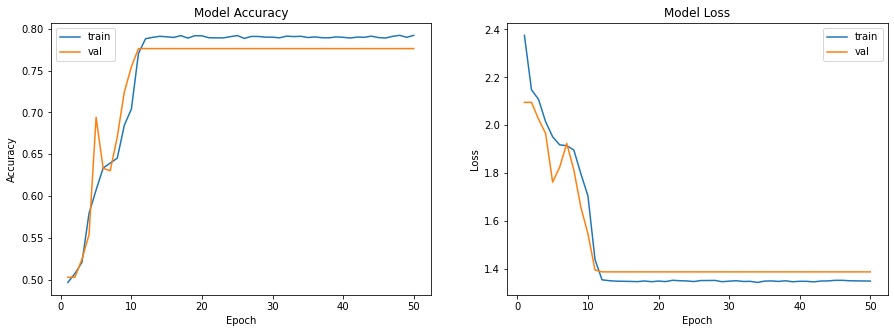

In [24]:
print('train loss:', history.history['loss'][-1])
print('train accuracy:', history.history['output_accuracy'][-1])

print('dev loss:', history.history['val_loss'][-1])
print('dev accuracy:', history.history['val_output_accuracy'][-1])

fig, axs = plt.subplots(1,2,figsize=(15,5))

axs[0].plot(range(1,len(history.history['output_accuracy'])+1), history.history['output_accuracy'])
axs[0].plot(range(1,len(history.history['val_output_accuracy'])+1),history.history['val_output_accuracy'])
axs[0].set_title('Model Accuracy')
axs[0].set_ylabel('Accuracy')
axs[0].set_xlabel('Epoch')
axs[0].legend(['train', 'val'], loc='best')

axs[1].plot(range(1,len(history.history['loss'])+1),history.history['loss'])
axs[1].plot(range(1,len(history.history['val_loss'])+1),history.history['val_loss'])
axs[1].set_title('Model Loss')
axs[1].set_ylabel('Loss')
axs[1].set_xlabel('Epoch')
axs[1].legend(['train', 'val'], loc='best')

plt.show()

In [25]:
predictions = model.predict(x_test)

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Ide

Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:

Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_predict_function_289162 in device /job:

In [30]:
print(predictions)

print(predictions[0].size)

y_pred = []

for i in predictions:
    if i[0] < 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

[array([[8.62008870e-01, 1.37408584e-01, 6.66737324e-05, ...,
        7.62858108e-05, 6.94912887e-05, 7.72014610e-05],
       [2.90440917e-01, 7.08388507e-01, 1.40808945e-04, ...,
        1.39488955e-04, 1.39478580e-04, 1.38221279e-04],
       [7.95330107e-01, 2.04072282e-01, 6.70258305e-05, ...,
        7.57856105e-05, 7.10417953e-05, 7.88981124e-05],
       ...,
       [2.29075477e-01, 7.70225465e-01, 8.68077987e-05, ...,
        8.17718828e-05, 8.22300717e-05, 8.91492164e-05],
       [8.77466798e-01, 1.22155406e-01, 4.32051893e-05, ...,
        4.87084144e-05, 4.46237973e-05, 5.15520296e-05],
       [4.01969016e-01, 5.96764684e-01, 1.59268864e-04, ...,
        1.63078628e-04, 1.49651067e-04, 1.52120847e-04]], dtype=float32), array([[8.2536924e-01, 1.7411287e-01, 6.8896174e-05, ..., 6.2815081e-05,
        6.8917063e-05, 5.5032957e-05],
       [1.7737150e-01, 8.2232308e-01, 3.8861457e-05, ..., 3.4049914e-05,
        4.3347674e-05, 3.6674915e-05],
       [8.7337726e-01, 1.2637885e-01, 

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_mtx = confusion_matrix(y_test, y_pred)

In [ ]:
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens",linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
from sklearn.metrics import classification_report

# Generate a classification report
report = classification_report(y_test, y_pred, target_names=['cat', 'dog'])

In [ ]:
print(report)

In [27]:
print('Precision:- Accuracy of positive predictions.')
print('Precision = TP/(TP + FP)')
print('Recall:- Fraction of positives that were correctly identified.')
print('Recall = TP/(TP+FN)')
print('F1 score')
print('F1 Score = 2*(Recall * Precision) / (Recall + Precision)')
print('Accuracy : (TP+TN) / all')
print('macro avg = (normal+abnormal)/2 * precision or recall or f1 score')
print('weighted avg = normal/(normal+abnormal) * precision or recall or f1 score')

Precision:- Accuracy of positive predictions.
Precision = TP/(TP + FP)
Recall:- Fraction of positives that were correctly identified.
Recall = TP/(TP+FN)
F1 score
F1 Score = 2*(Recall * Precision) / (Recall + Precision)
Accuracy : (TP+TN) / all
macro avg = (normal+abnormal)/2 * precision or recall or f1 score
weighted avg = normal/(normal+abnormal) * precision or recall or f1 score
